In [1]:
try:
    # This library is our indicator that the required installs
    # need to be done.
    import pyvene

except ModuleNotFoundError:
    !pip install git+https://github.com/stanfordnlp/pyvene.git

  Cloning https://github.com/stanfordnlp/pyvene.git to /tmp/pip-req-build-24b5j6jq
  Running command git clone --filter=blob:none --quiet https://github.com/stanfordnlp/pyvene.git /tmp/pip-req-build-24b5j6jq
  Resolved https://github.com/stanfordnlp/pyvene.git to commit 0d3f1f85065f87f849fd2cba060c69ecf69b65be
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 12.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 9.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.5/143.5 kB 12.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 44.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.8/194.8 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 49.7 MB/s eta 0:00:00
  Created w

In [2]:
%pip install dataset

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.6/233.6 kB 22.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 67.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 7.8 MB/s eta 0:00:00
  Attempting uninstall: sqlalchemy
    Found existing installation: SQLAlchemy 2.0.37
    Uninstalling SQLAlchemy-2.0.37:
      Successfully uninstalled SQLAlchemy-2.0.37
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ipython-sql 0.5.0 requires sqlalchemy>=2.0, but you have sqlalchemy 1.4.54 which is incompatible.


In [3]:
from datasets import load_dataset
import pandas as pd
import torch
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt

from pyvene import embed_to_distrib, top_vals

from pyvene import (
    IntervenableModel,
    VanillaIntervention, Intervention,
    RepresentationConfig,
    IntervenableConfig,
    ConstantSourceIntervention,
    LocalistRepresentationIntervention
)
from pyvene import create_gpt2

%config InlineBackend.figure_formats = ['svg']
from plotnine import (
    ggplot,
    geom_tile,
    aes,
    facet_wrap,
    theme,
    element_text,
    geom_bar,
    geom_hline,
    scale_y_log10,
    xlab, ylab, ylim,
    scale_y_discrete, scale_y_continuous, ggsave
)
from plotnine.scales import scale_y_reverse, scale_fill_cmap
from tqdm import tqdm
import random
import tempfile

nnsight is not detected. Please install via 'pip install nnsight' for nnsight backend.


In [4]:
titles={
    "block_output": "single restored layer in GPT2-XL",
    "mlp_activation": "center of interval of 10 patched mlp layer",
    "attention_output": "center of interval of 10 patched attn layer"
}

colors={
    "block_output": "Purples",
    "mlp_activation": "Greens",
    "attention_output": "Reds"
}

In [5]:
device = "cuda" if torch.cuda.is_available() else "cpu"

## Załadowanie zbioru danych *BoolQ*

In [6]:
ds = load_dataset('google/boolq')

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.


README.md:   0%|          | 0.00/6.57k [00:00<?, ?B/s]

train-00000-of-00001.parquet:   0%|          | 0.00/3.69M [00:00<?, ?B/s]

validation-00000-of-00001.parquet:   0%|          | 0.00/1.26M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/9427 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/3270 [00:00<?, ? examples/s]

In [7]:
ds

DatasetDict({
    train: Dataset({
        features: ['question', 'answer', 'passage'],
        num_rows: 9427
    })
    validation: Dataset({
        features: ['question', 'answer', 'passage'],
        num_rows: 3270
    })
})

In [8]:
for entry in ds['train'].select(range(5)):
    print('QUESTION: {} \nANSWER: {}\nPASSAGE: {}\n'.format(entry['question'], entry['answer'], entry['passage']))

QUESTION: do iran and afghanistan speak the same language 
ANSWER: True
PASSAGE: Persian (/ˈpɜːrʒən, -ʃən/), also known by its endonym Farsi (فارسی fārsi (fɒːɾˈsiː) ( listen)), is one of the Western Iranian languages within the Indo-Iranian branch of the Indo-European language family. It is primarily spoken in Iran, Afghanistan (officially known as Dari since 1958), and Tajikistan (officially known as Tajiki since the Soviet era), and some other regions which historically were Persianate societies and considered part of Greater Iran. It is written in the Persian alphabet, a modified variant of the Arabic script, which itself evolved from the Aramaic alphabet.

QUESTION: do good samaritan laws protect those who help at an accident 
ANSWER: True
PASSAGE: Good Samaritan laws offer legal protection to people who give reasonable assistance to those who are, or who they believe to be, injured, ill, in peril, or otherwise incapacitated. The protection is intended to reduce bystanders' hesitat

In [9]:
train_counts = pd.DataFrame({'Answer': ds['train']['answer']})
train_counts = train_counts.groupby('Answer').size().reset_index(name='train_set')

test_counts = pd.DataFrame({'Answer': ds['validation']['answer']})
test_counts = test_counts.groupby('Answer').size().reset_index(name='test_set')

display(train_counts.merge(test_counts, on='Answer'))

,Answer,train_set,test_set
0,False,3553,1237
1,True,5874,2033


## Funkcje

In [10]:
class NoiseIntervention(ConstantSourceIntervention, LocalistRepresentationIntervention):
    def __init__(self, embed_dim, **kwargs):
        super().__init__()
        self.interchange_dim = embed_dim
        rs = np.random.RandomState(1)
        prng = lambda *shape: rs.randn(*shape)
        self.noise = torch.from_numpy(
            prng(1, num_of_units, embed_dim)).to(device)
        self.noise_level = 0.13462981581687927

    def forward(self, base, source=None, subspaces=None):
        base[..., : self.interchange_dim] += self.noise * self.noise_level
        return base

    def __str__(self):
        return f"NoiseIntervention(embed_dim={self.embed_dim})"


def corrupted_config(model_type):
    config = IntervenableConfig(
        model_type=model_type,
        representations=[
            RepresentationConfig(
                0,              # layer
                "block_input",  # intervention type
            ),
        ],
        intervention_types=NoiseIntervention,
    )
    return config

In [11]:
def restore_corrupted_with_interval_config(
    layer, stream="mlp_activation", window=10, num_layers=48):
    start = max(0, layer - window // 2)
    end = min(num_layers, layer - (-window // 2))
    config = IntervenableConfig(
        representations=[
            RepresentationConfig(
                0,       # layer
                "block_input",  # intervention type
            ),
        ] + [
            RepresentationConfig(
                i,       # layer
                stream,  # intervention type
        ) for i in range(start, end)],
        intervention_types=\
            [NoiseIntervention]+[VanillaIntervention]*(end-start),
    )
    return config

In [12]:
def trace_activations(model, tokenizer, example, unit_locations):
    inputs = [tokenizer(example, return_tensors='pt').to(device)]
    print(example)
    res = model(**inputs[0])
    distrib = embed_to_distrib(model, res.last_hidden_state, logits=False)
    print('Przed zaszumieniem')
    top_vals(tokenizer, distrib[0][-1], n=10)

    base = tokenizer(example, return_tensors='pt').to(device)
    config = corrupted_config(type(model))

    intervenable = IntervenableModel(config, model)
    _, counterfactual_outputs = intervenable(
        base, unit_locations={"base": ([[unit_locations]])}
    )

    distrib = embed_to_distrib(model, counterfactual_outputs.last_hidden_state, logits=False)
    print('Po zaszumieniu')
    top_vals(tokenizer, distrib[0][-1], n=10)

In [13]:
def visualize_activations(tokens, tokens_input, base, name, file_name, custom_labels, unit_locations, gpt):
    for stream in ["block_output", "mlp_activation", "attention_output"]:
        data = []
        for layer_i in tqdm(range(gpt.config.n_layer)):
            for pos_i in range(len(tokens_input)):
                config = restore_corrupted_with_interval_config(
                    layer_i, stream,
                    window=1 if stream == "block_output" else 10
                )
                n_restores = len(config.representations) - 1
                intervenable = IntervenableModel(config, gpt)
                _, counterfactual_outputs = intervenable(
                    base,
                    [None] + [base]*n_restores,
                    {
                        "sources->base": (
                            [None] + [[[pos_i]]]*n_restores,
                            [[unit_locations]] + [[[pos_i]]]*n_restores,
                        )
                    },
                )
                distrib = embed_to_distrib(
                    gpt, counterfactual_outputs.last_hidden_state, logits=False
                )
                # prob = sum(distrib[0, pos_i, token].detach().cpu().item() for token in tokens)
                prob = distrib[0][-1][tokens].detach().cpu().item()
                data.append({"layer": layer_i, "pos": pos_i, "prob": prob})
        df = pd.DataFrame(data)
        df.to_csv(f"{file_name}_{stream}.csv")

    for stream in ["block_output", "mlp_activation", "attention_output"]:
            df = pd.read_csv(f"{file_name}_{stream}.csv")
            df["layer"] = df["layer"].astype(int)
            df["pos"] = df["pos"].astype(int)
            df[name] = df["prob"].astype(float)


            breaks = [i for i in range(len(custom_labels))]
            print(breaks)

            plot = (
                ggplot(df, aes(x="layer", y="pos"))

                + geom_tile(aes(fill=name))
                + scale_fill_cmap(colors[stream]) + xlab(titles[stream])
                + scale_y_reverse(
                      limits=(min(breaks) - 0.5, max(breaks) + 0.5),
                      breaks=breaks, labels=custom_labels
                  )
                + theme(figure_size=(10, 10)) + ylab("")
                + theme(axis_text_y  = element_text(angle = 90, hjust = 1))
            )
            ggsave(
                plot, filename=f"{file_name}_{stream}.pdf", dpi=200
            )
            plot.show()


In [14]:
def run(question, unit_locations, models_dict, num):
    global num_of_units
    num_of_units = len(unit_locations)

    for model_name, model_data in models_dict.items():
        config = model_data["config"]
        tokenizer = model_data["tokenizer"]
        gpt = model_data["model"]

        trace_activations(gpt, tokenizer, question, unit_locations)
        if model_name == 'utahnlp/boolq_gpt2-xl_seed-1':
          file_name = f'./data/zadanie3/example_{num}_' + 'boolq_gpt2-xl_seed-1'
        else:
          file_name = f'./data/zadanie3/example_{num}_' + model_name
        custom_labels = question.split(" ")
        print(custom_labels)

        # yes_tokens = [
        #     tokenizer.encode(" Yes")[0],
        #     tokenizer.encode(" yes")[0]
        # ]
        yes_tokens = tokenizer.encode(" Yes")[0]
        no_tokens = tokenizer.encode(" No")[0]
        # no_tokens = [
        #     tokenizer.encode(" No")[0],
        #     tokenizer.encode(" no")[0]
        # ]

        base = tokenizer(question, return_tensors='pt').to(device)
        tokens = tokenizer.convert_ids_to_tokens(base['input_ids'][0])

        visualize_activations(yes_tokens, tokens, base, "p(Yes)", file_name + "_yes", custom_labels, unit_locations, gpt)
        visualize_activations(no_tokens, tokens, base, "p(No)", file_name + "_no", custom_labels, unit_locations, gpt)

## Załadowanie modeli

In [15]:
MODELS_NAME = ['gpt2-xl',
               'utahnlp/boolq_gpt2-xl_seed-1'
               ]

In [16]:
models_dict = {}

for model_name in MODELS_NAME:
    config, tokenizer, gpt = create_gpt2(name=model_name)
    gpt.to(device)
    models_dict[model_name] = {
        "config": config,
        "tokenizer": tokenizer,
        "model": gpt
    }

config.json:   0%|          | 0.00/689 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/6.43G [00:00<?, ?B/s]

loaded model


config.json:   0%|          | 0.00/1.15k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/668 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/798k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/587 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.11M [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/43.5k [00:00<?, ?B/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/4.96G [00:00<?, ?B/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/1.27G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

loaded model


## Przykłady

### Przykład 1

In [ ]:
example = ds['train'].select(range(7968, 7969))
print('QUESTION: {} \nANSWER: {}\nPASSAGE: {}\n'.format(example['question'], example['answer'], example['passage']))

QUESTION: ['if events a and b are mutually exclusive are they also collectively exhaustive'] 
ANSWER: [True]
PASSAGE: ["One example of an event that is both collectively exhaustive and mutually exclusive is tossing a coin. The outcome must be either heads or tails, or p (heads or tails) = 1, so the outcomes are collectively exhaustive. When heads occurs, tails can't occur, or p (heads and tails) = 0, so the outcomes are also mutually exclusive."]



In [ ]:
tok = tokenizer(example['question'], return_tensors='pt').to(device)
tokens = tokenizer.convert_ids_to_tokens(tok['input_ids'][0])
print(tokens)


['if', 'Ġevents', 'Ġa', 'Ġand', 'Ġb', 'Ġare', 'Ġmutually', 'Ġexclusive', 'Ġare', 'Ġthey', 'Ġalso', 'Ġcollectively', 'Ġexhaustive']


In [ ]:
unit_locations = [2, 4]

if events a and b are mutually exclusive are they also collectively exhaustive
Przed zaszumieniem
?                    0.6617316007614136
_of                  0.06897959858179092
_?                   0.04403391480445862
.                    0.03242234140634537
,                    0.03122376836836338
_or                  0.02339819073677063
_in                  0.012575997039675713
_(                   0.011751742102205753
_and                 0.010407928377389908
?"                   0.007060980889946222
Po zaszumieniu
?                    0.6287713050842285
_?                   0.058713801205158234
.                    0.058498285710811615
_of                  0.046870674937963486
,                    0.035242710262537
_or                  0.019611932337284088
_(                   0.013527310453355312
_in                  0.01281991321593523
_and                 0.012773441150784492
_for                 0.006850823760032654
['if', 'events', 'a', 'and', 'b', 'are', 'mutually', 'exclus

100%|██████████| 48/48 [04:15<00:00,  5.33s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_1_gpt2-xl_yes_block_output.pdf


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]


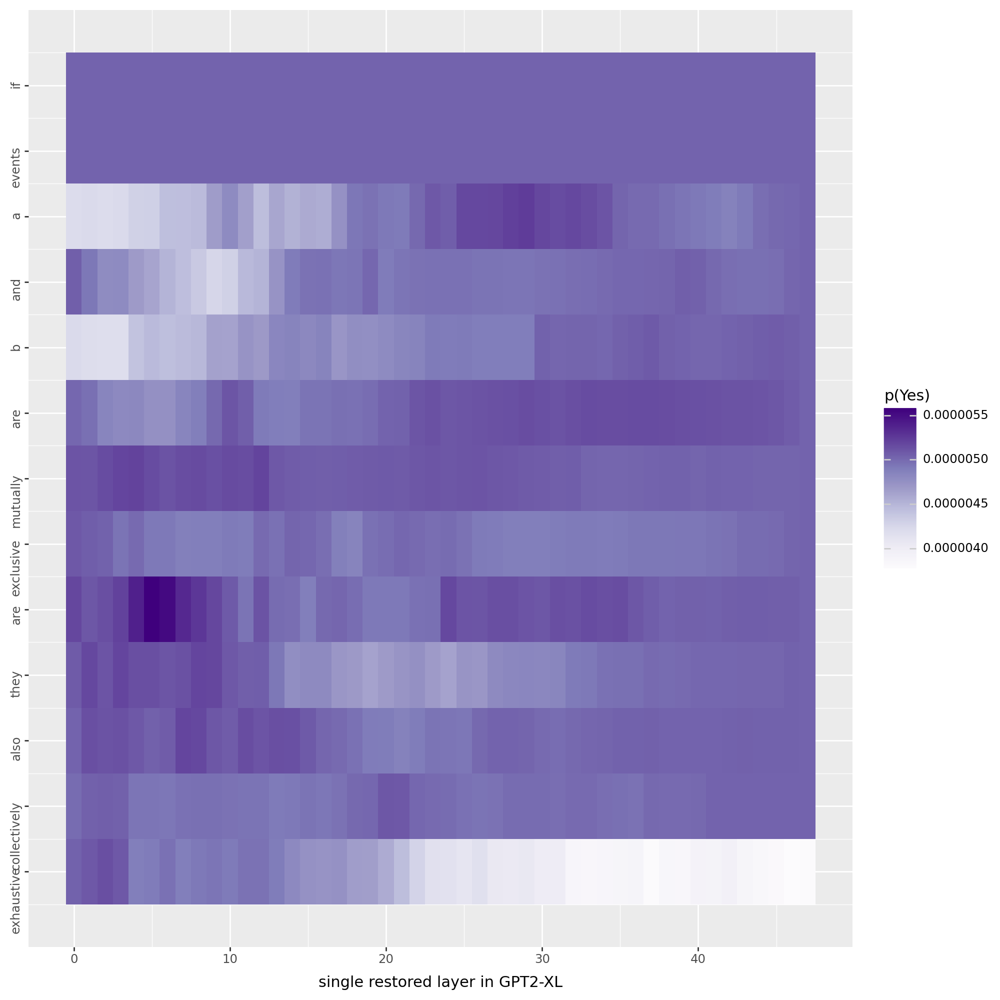

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_1_gpt2-xl_yes_mlp_activation.pdf


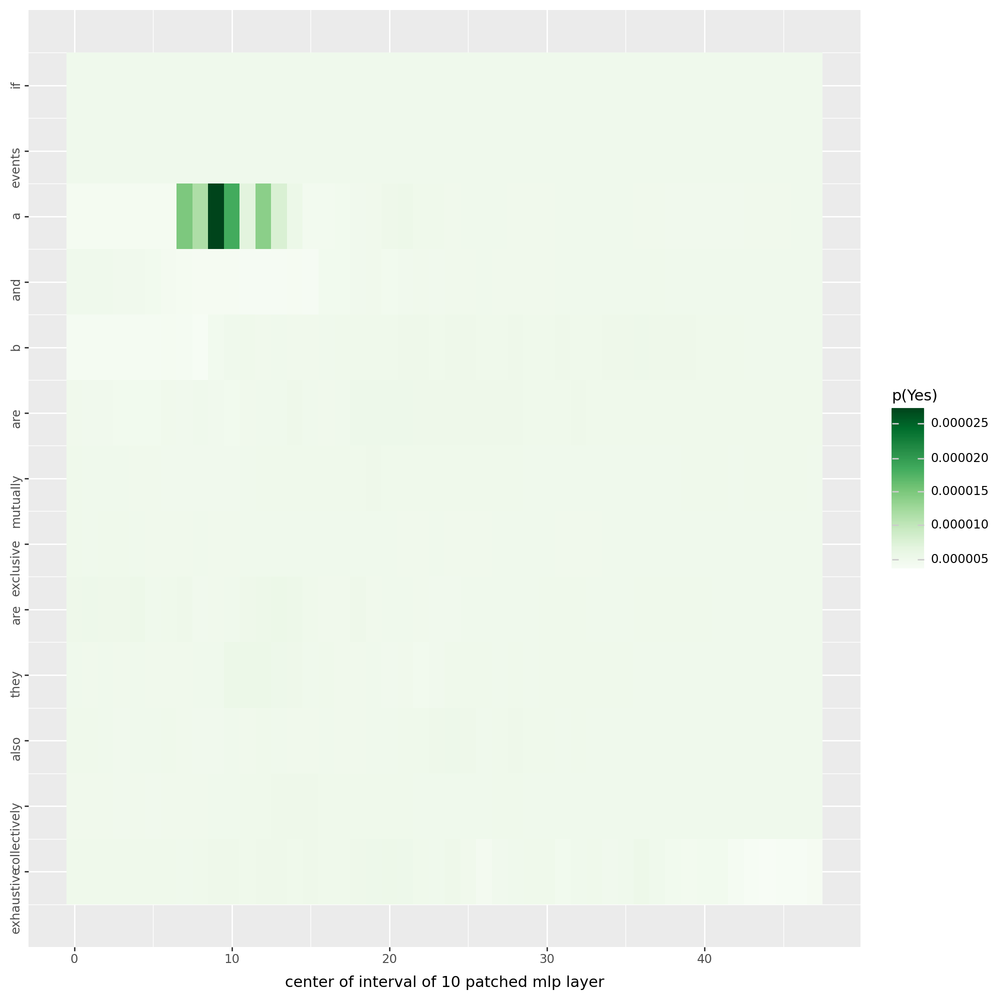

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_1_gpt2-xl_yes_attention_output.pdf


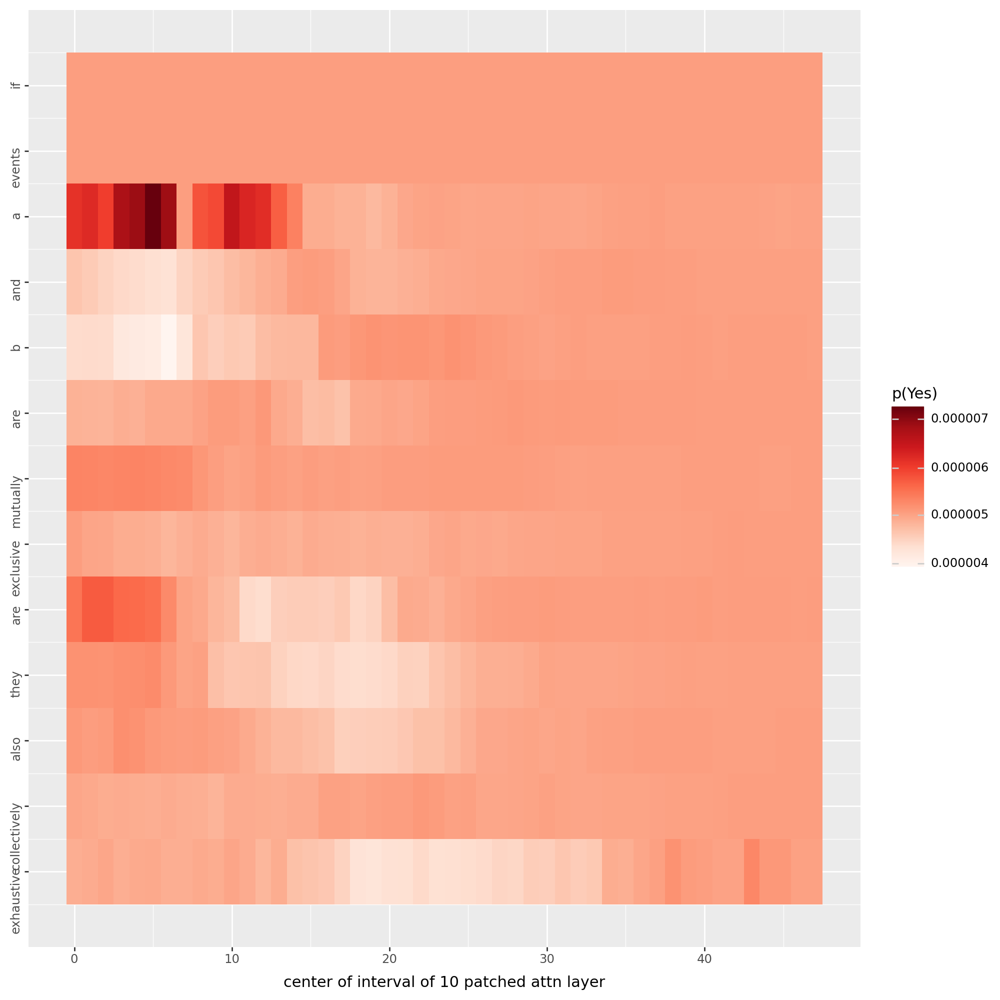

100%|██████████| 48/48 [04:15<00:00,  5.33s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_1_gpt2-xl_no_block_output.pdf


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]


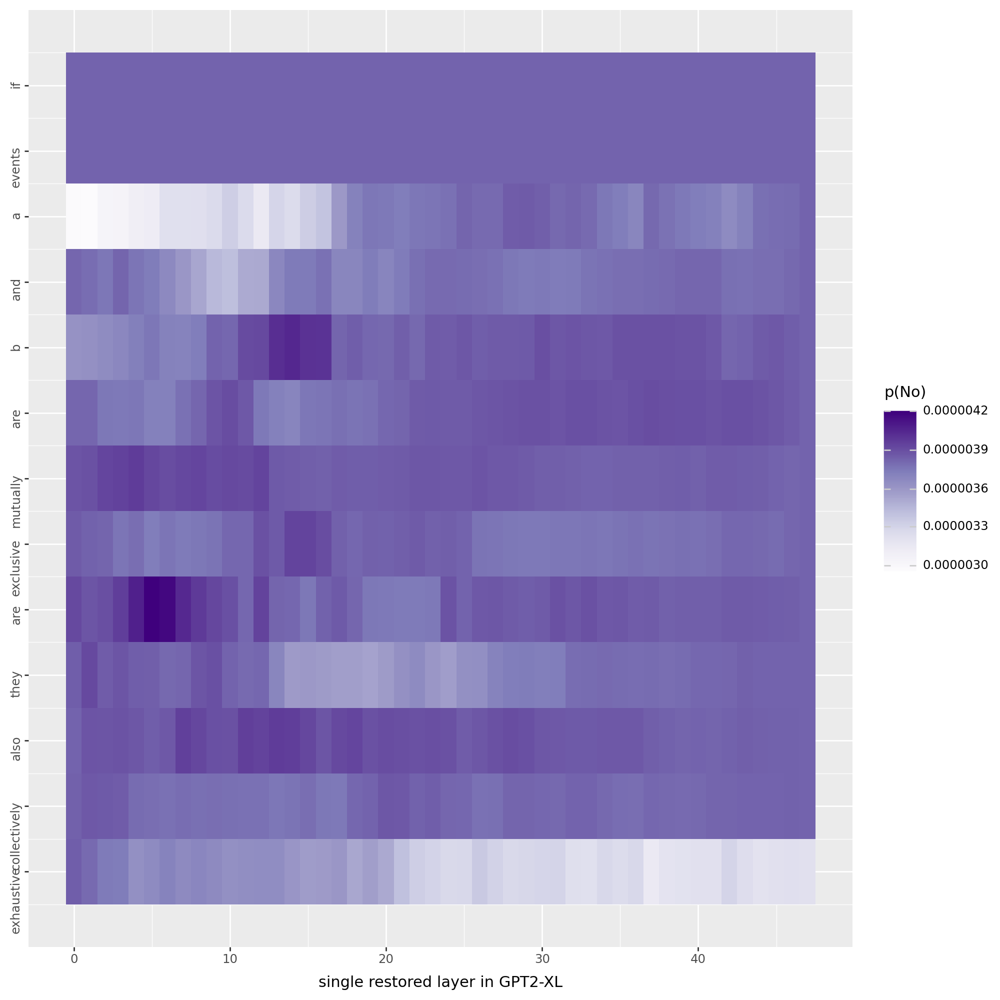

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_1_gpt2-xl_no_mlp_activation.pdf


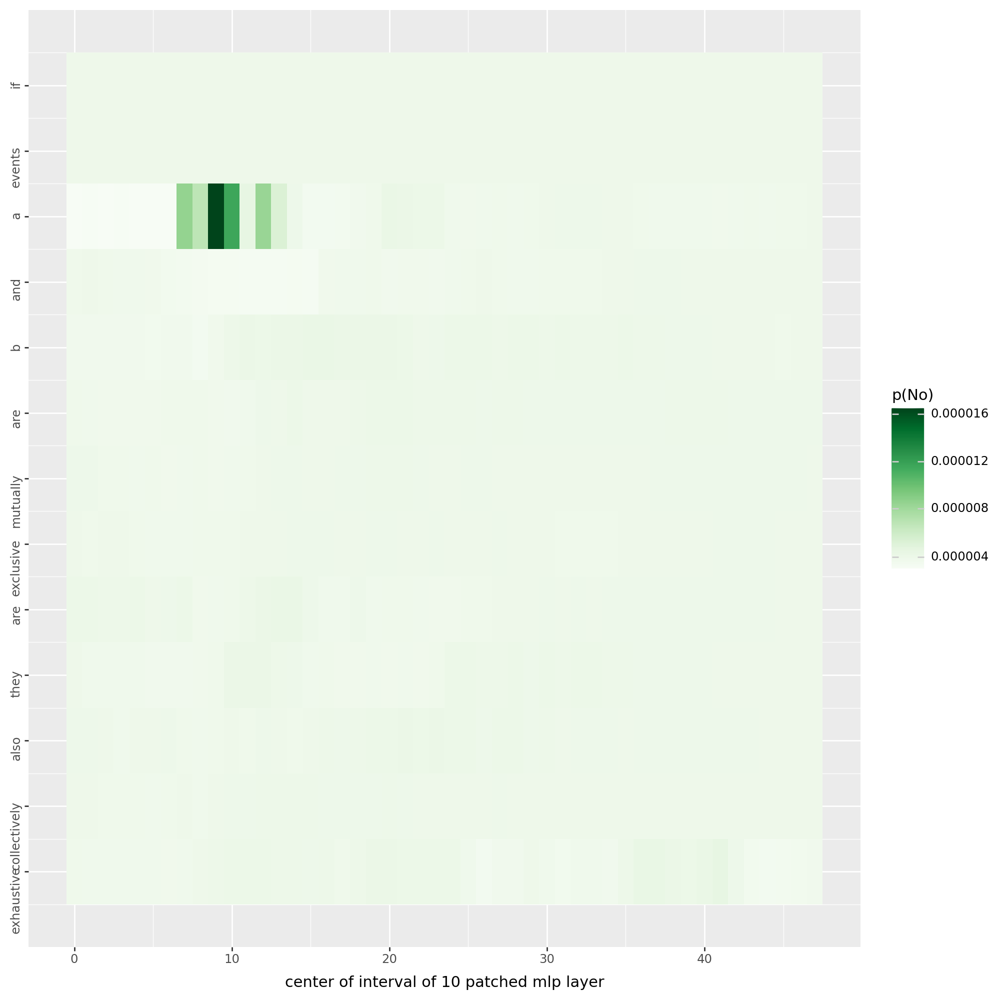

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_1_gpt2-xl_no_attention_output.pdf


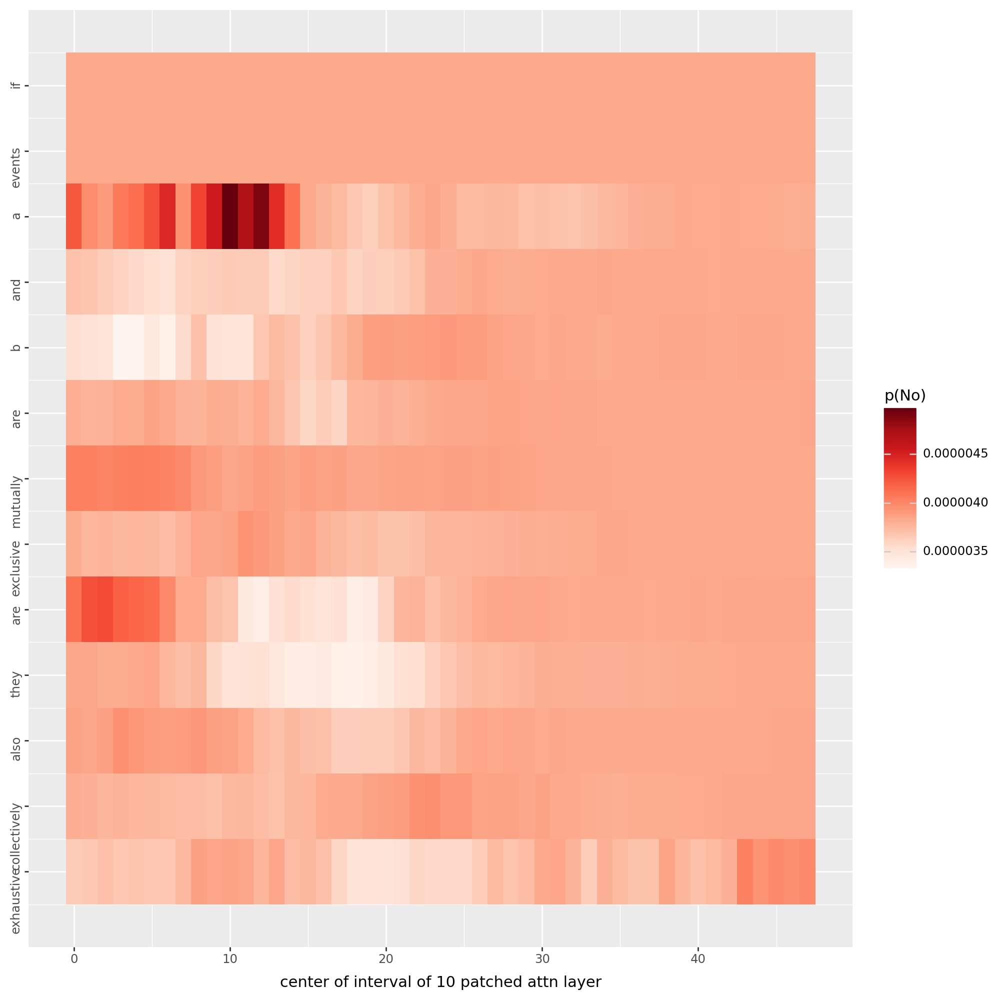

if events a and b are mutually exclusive are they also collectively exhaustive
Przed zaszumieniem
?                    0.6624828577041626
.                    0.06761985272169113
,                    0.061521269381046295
_or                  0.036604952067136765
_of                  0.023919502273201942
_and                 0.013752027414739132
?                    0.013013380579650402
_in                  0.00965810101479292
_(                   0.008556726388633251
_for                 0.008077402599155903
Po zaszumieniu
?                    0.6498616337776184
.                    0.08066432923078537
,                    0.057431384921073914
_or                  0.03149547800421715
?                    0.02782093919813633
_and                 0.012906642630696297
_of                  0.010036459192633629
\n                   0.009515006095170975
_are                 0.00928110908716917
_(                   0.008452665992081165
['if', 'events', 'a', 'and', 'b', 'are', 'mutually', 'exc

100%|██████████| 48/48 [04:16<00:00,  5.33s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_1_boolq_gpt2-xl_seed-1_yes_block_output.pdf


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]


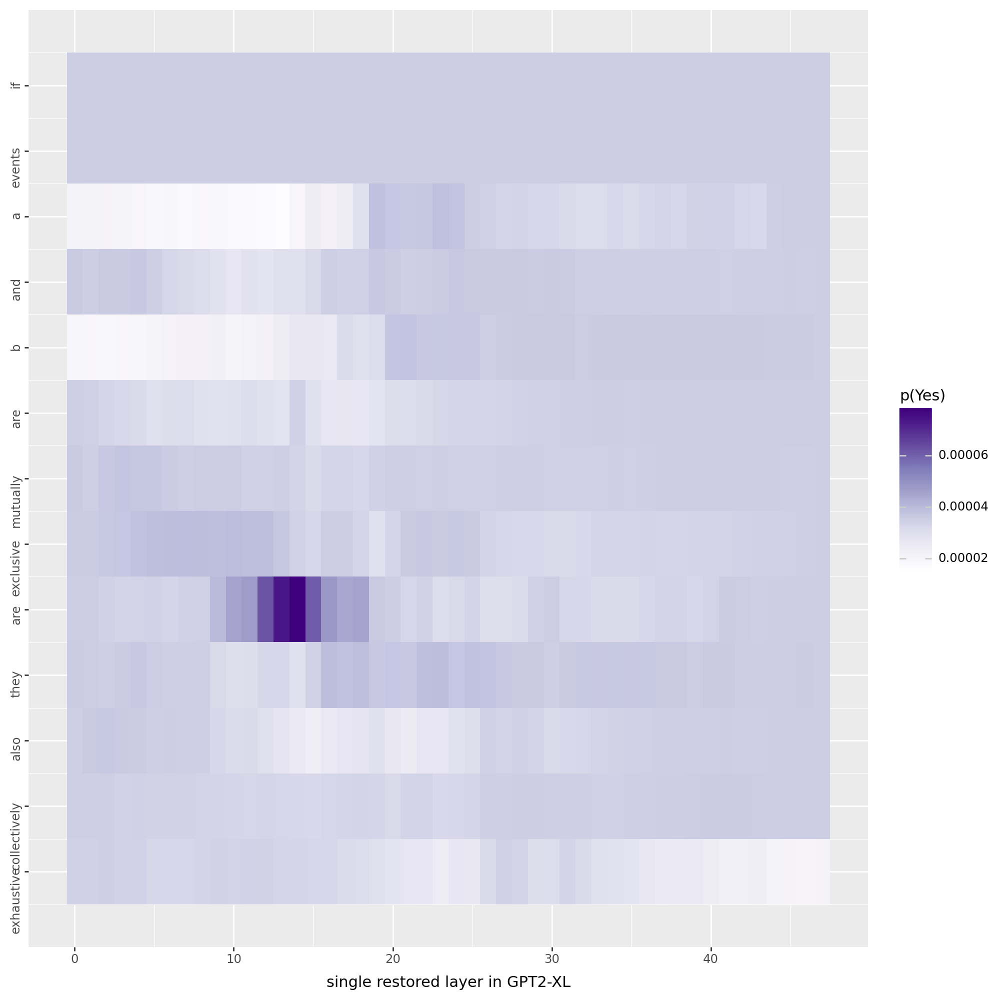

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_1_boolq_gpt2-xl_seed-1_yes_mlp_activation.pdf


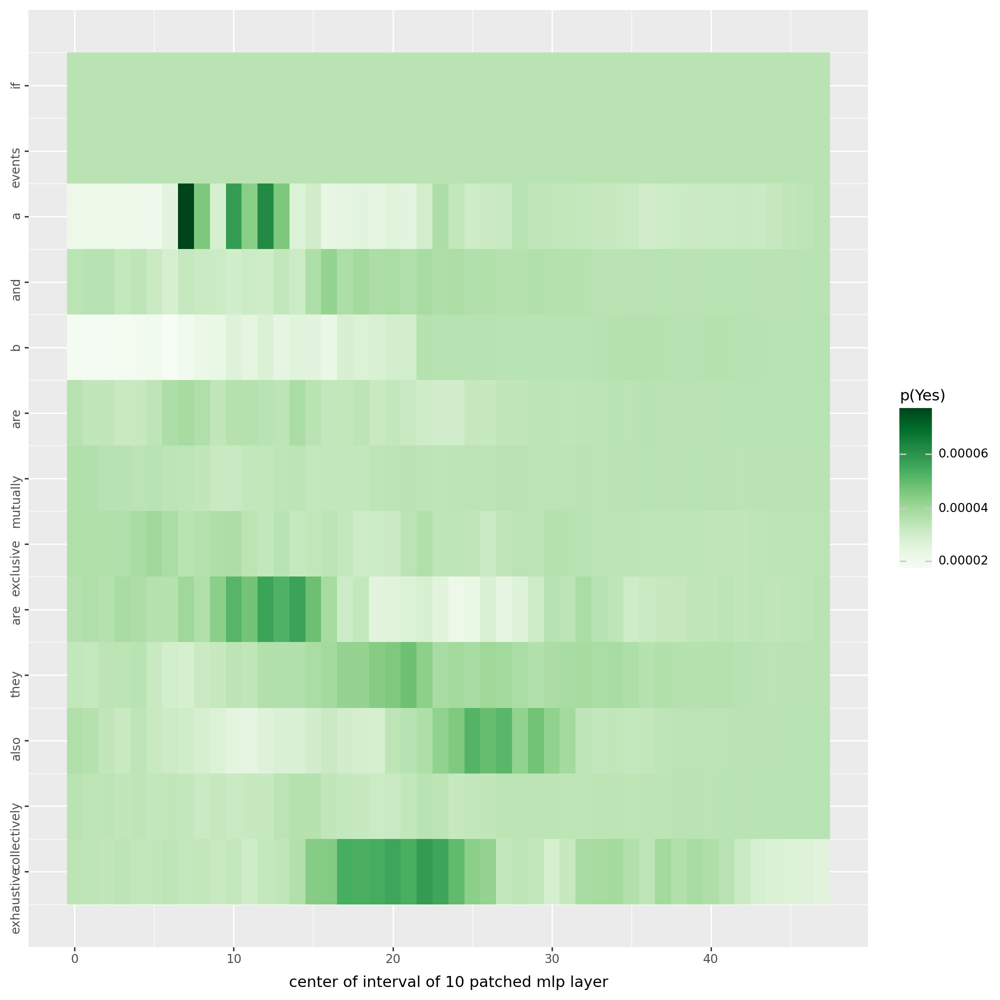

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_1_boolq_gpt2-xl_seed-1_yes_attention_output.pdf


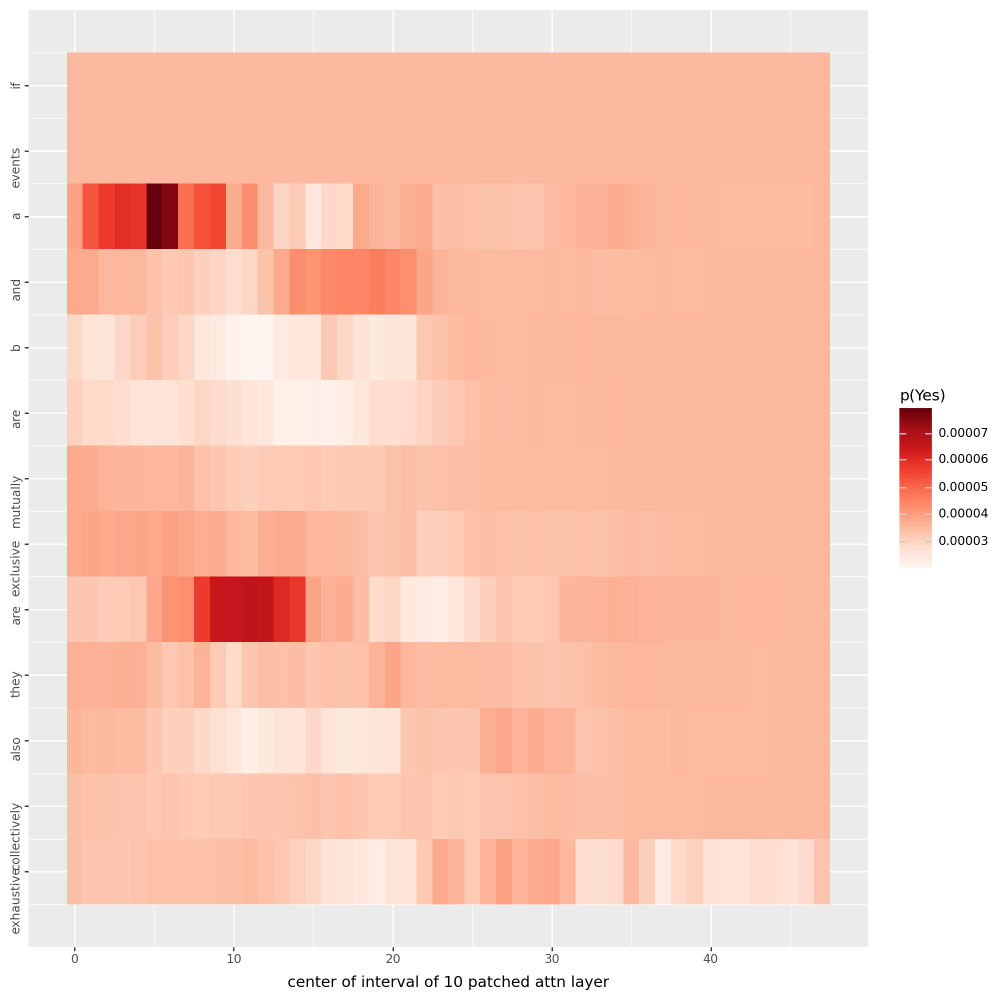

100%|██████████| 48/48 [04:15<00:00,  5.33s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_1_boolq_gpt2-xl_seed-1_no_block_output.pdf


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]


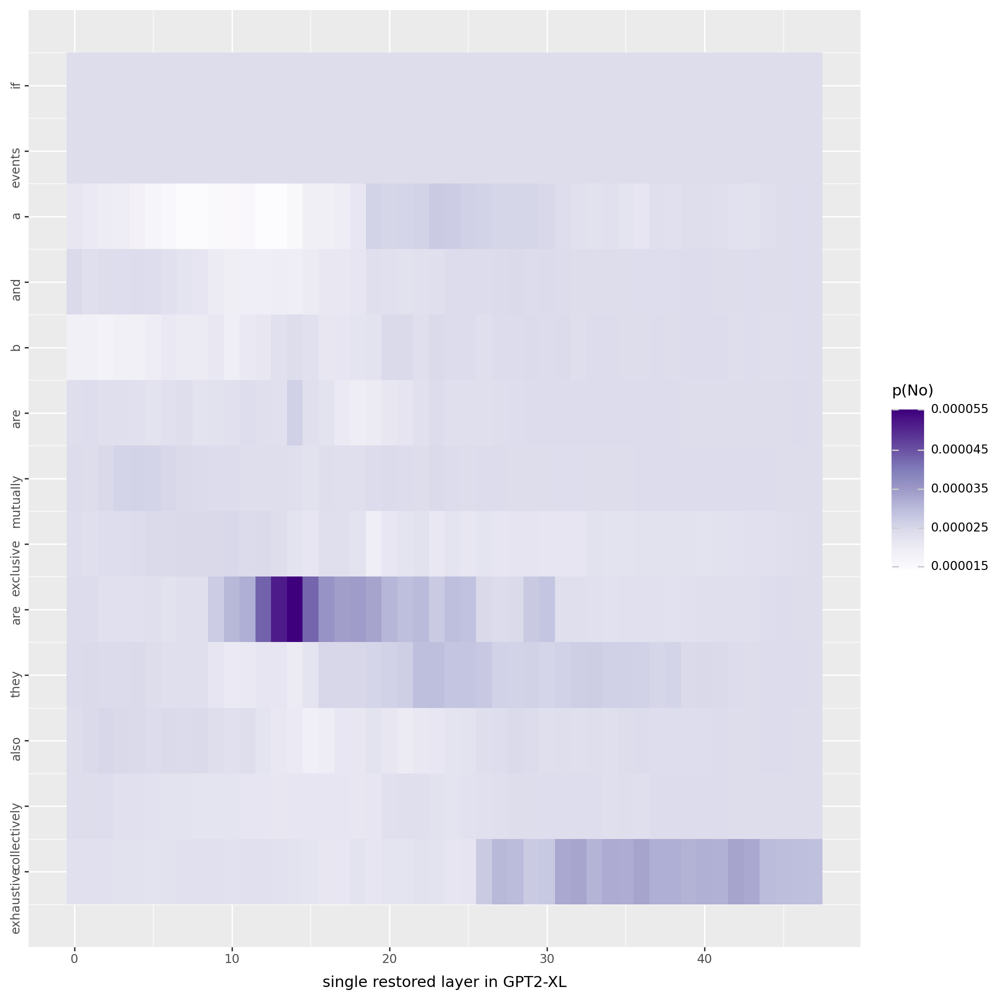

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_1_boolq_gpt2-xl_seed-1_no_mlp_activation.pdf


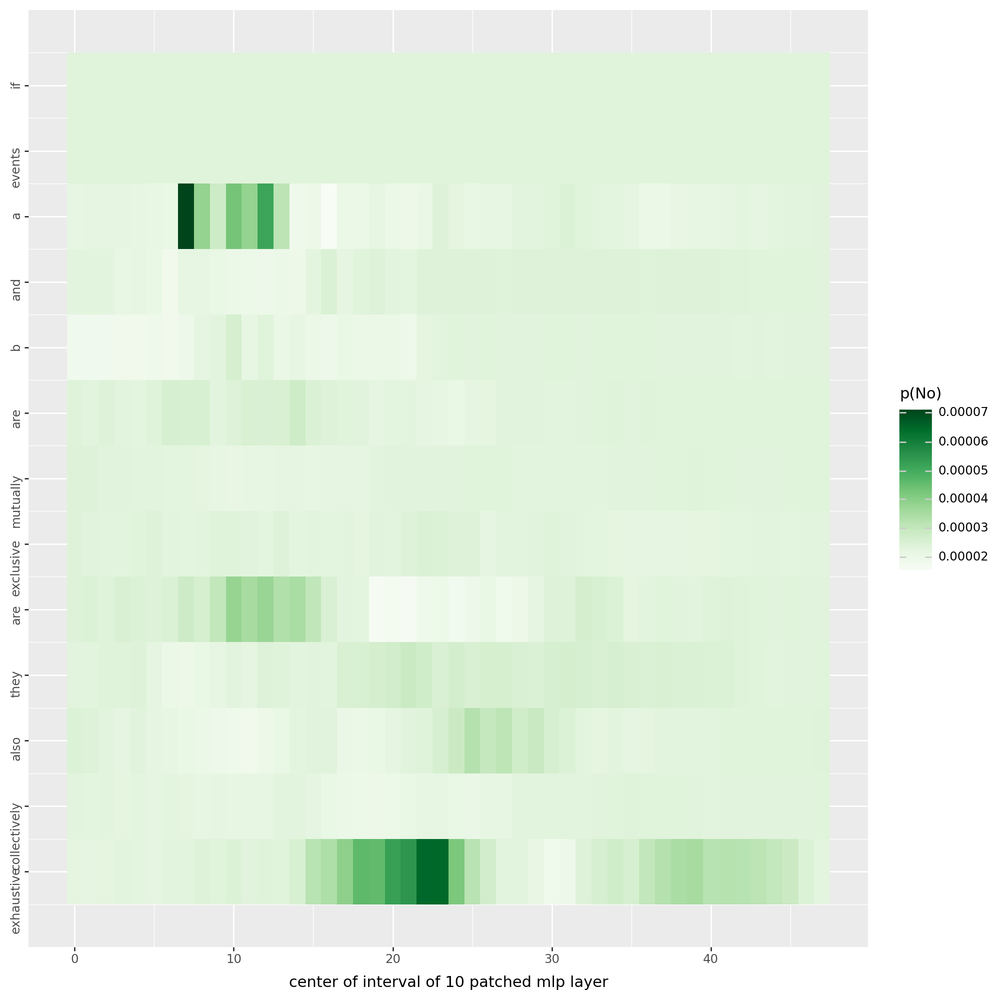

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_1_boolq_gpt2-xl_seed-1_no_attention_output.pdf


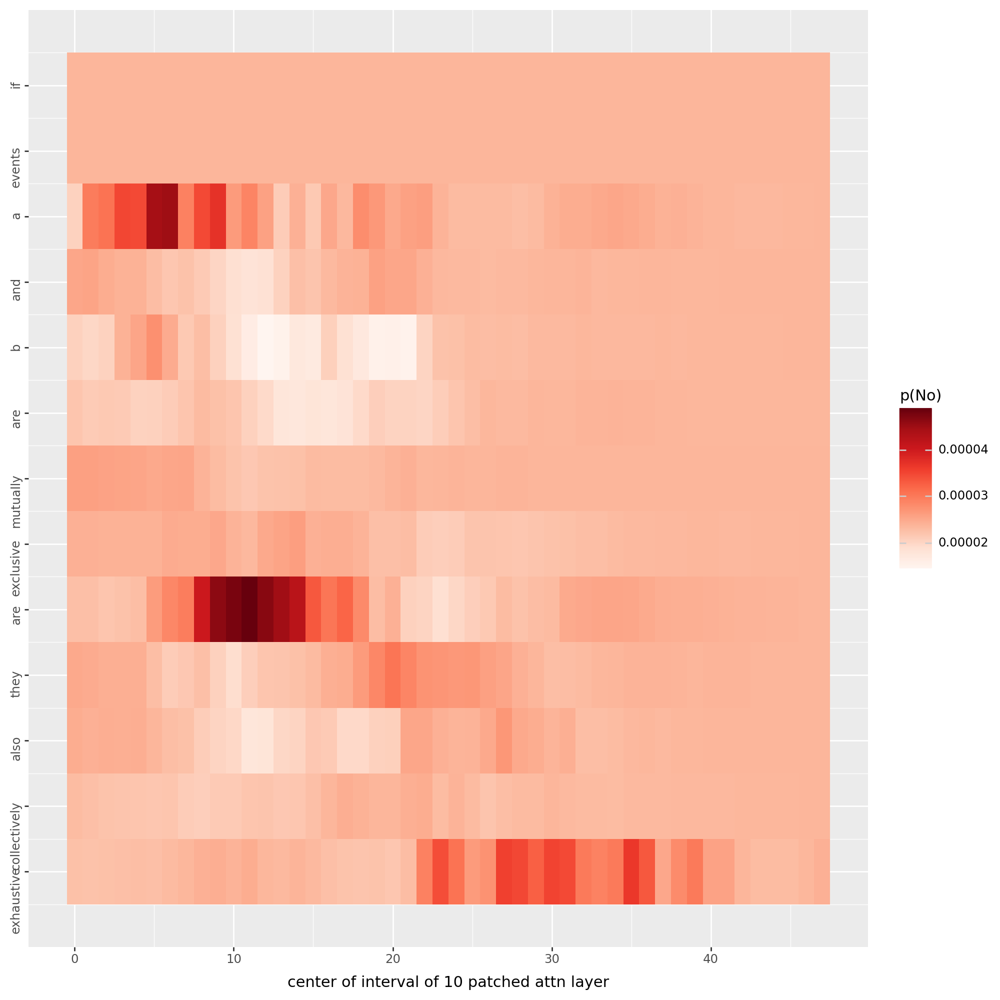

In [ ]:
run(example['question'][0], unit_locations, models_dict, 1)

In [ ]:
question = 'Ouestion: ' + example['question'][0] + ' ?' + ' Answer:'
tok = tokenizer(question, return_tensors='pt').to(device)
tokens = tokenizer.convert_ids_to_tokens(tok['input_ids'][0])
print(tokens)

['O', 'u', 'est', 'ion', ':', 'Ġif', 'Ġevents', 'Ġa', 'Ġand', 'Ġb', 'Ġare', 'Ġmutually', 'Ġexclusive', 'Ġare', 'Ġthey', 'Ġalso', 'Ġcollectively', 'Ġexhaustive', 'Ġ?', 'ĠAnswer', ':']


Ouestion: if events a and b are mutually exclusive are they also collectively exhaustive ? Answer:
Przed zaszumieniem
_No                  0.1981615424156189
_no                  0.1107616201043129
_Yes                 0.0739661157131195
_yes                 0.06718114763498306
_they                0.05980683118104935
\n                   0.03195985406637192
_They                0.030501946806907654
_The                 0.020356226712465286
_If                  0.01705661043524742
_a                   0.016823871061205864
Po zaszumieniu
_no                  0.15516798198223114
_No                  0.12944483757019043
_they                0.07454316318035126
_yes                 0.07029244303703308
_Yes                 0.05309262499213219
\n                   0.035122454166412354
_They                0.025880612432956696
_a                   0.01969587802886963
_not                 0.018265042454004288
_the                 0.017634423449635506
['Ouestion:', 'if', 'events', 'a', 'and', '

100%|██████████| 48/48 [06:55<00:00,  8.66s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_1_gpt2-xl_yes_block_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]


/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.


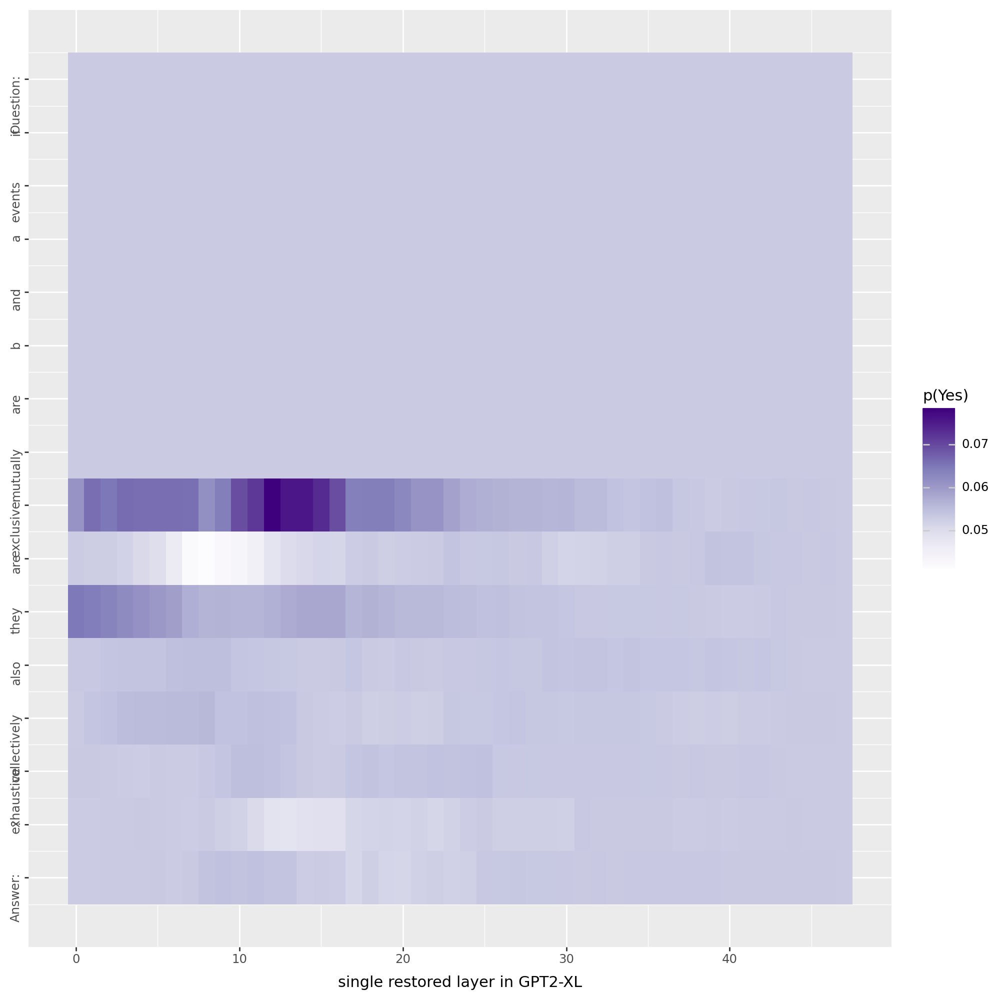

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_1_gpt2-xl_yes_mlp_activation.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.


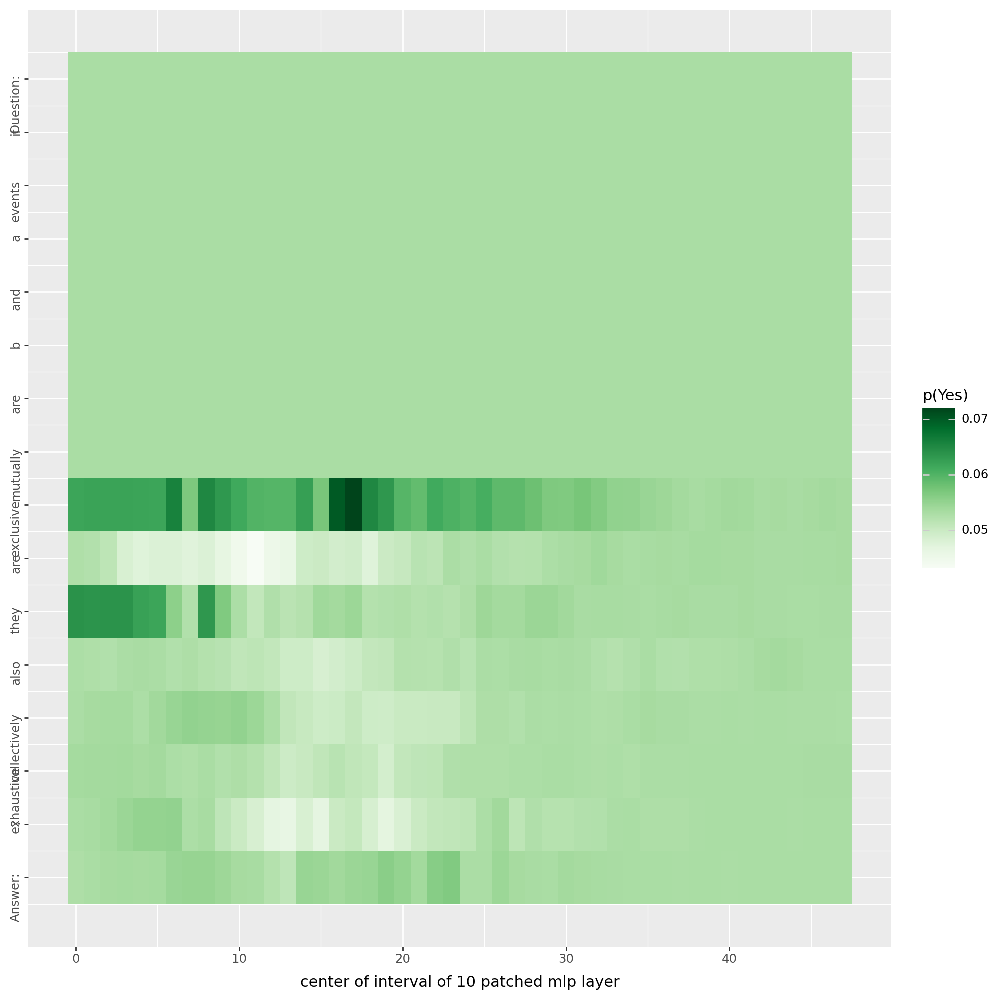

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_1_gpt2-xl_yes_attention_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.


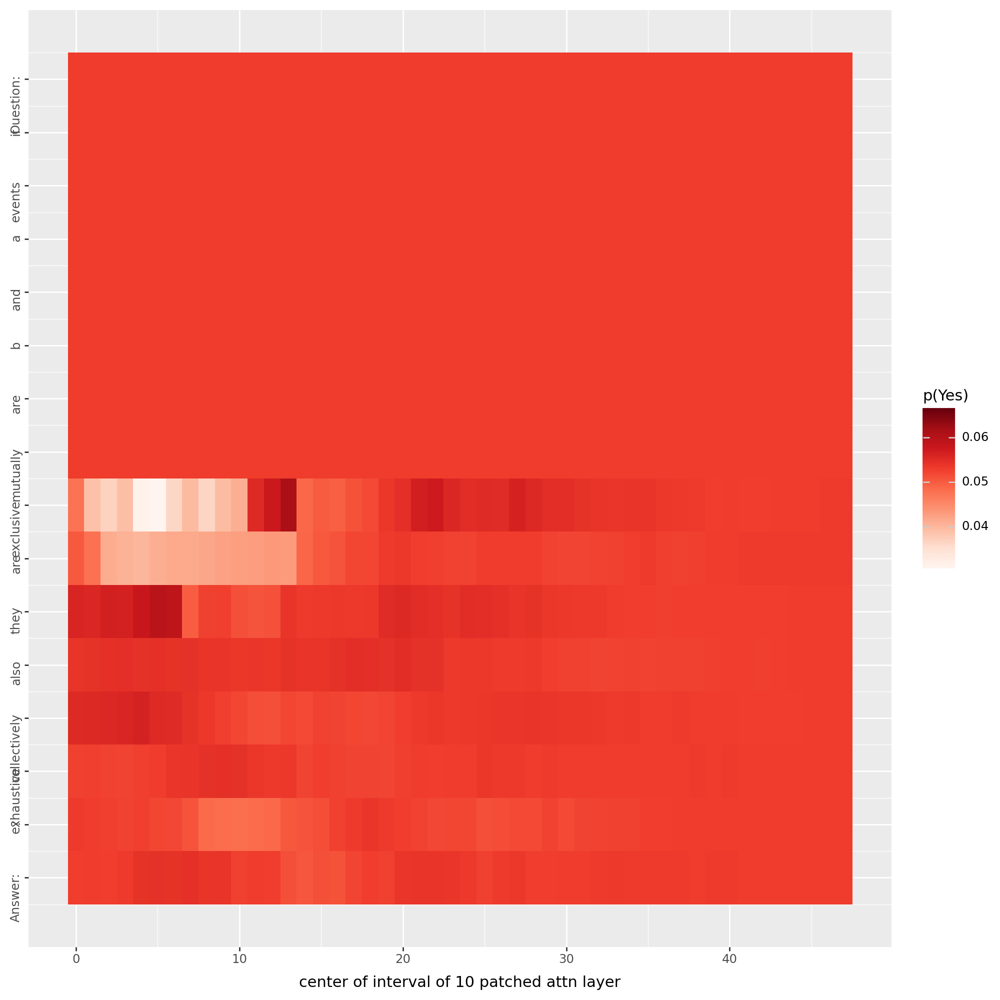

100%|██████████| 48/48 [06:54<00:00,  8.64s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_1_gpt2-xl_no_block_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]


/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.


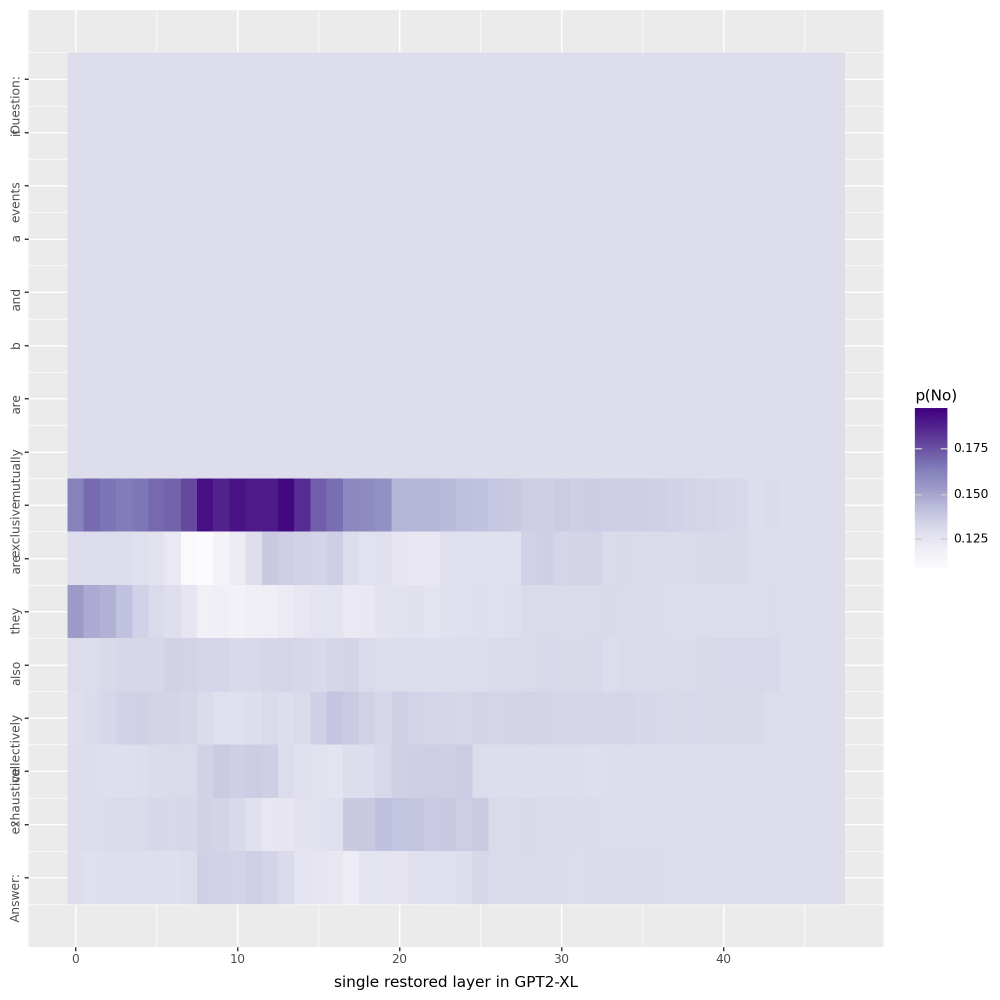

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_1_gpt2-xl_no_mlp_activation.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.


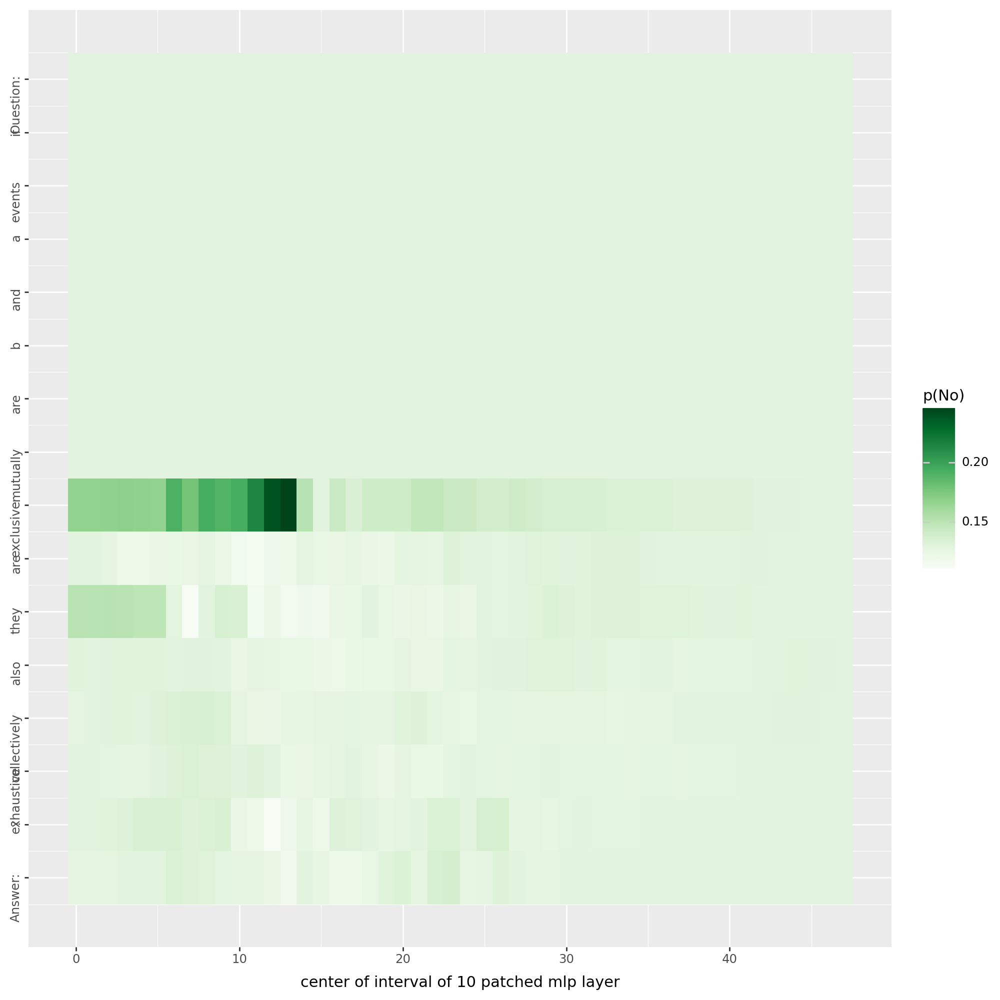

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_1_gpt2-xl_no_attention_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.


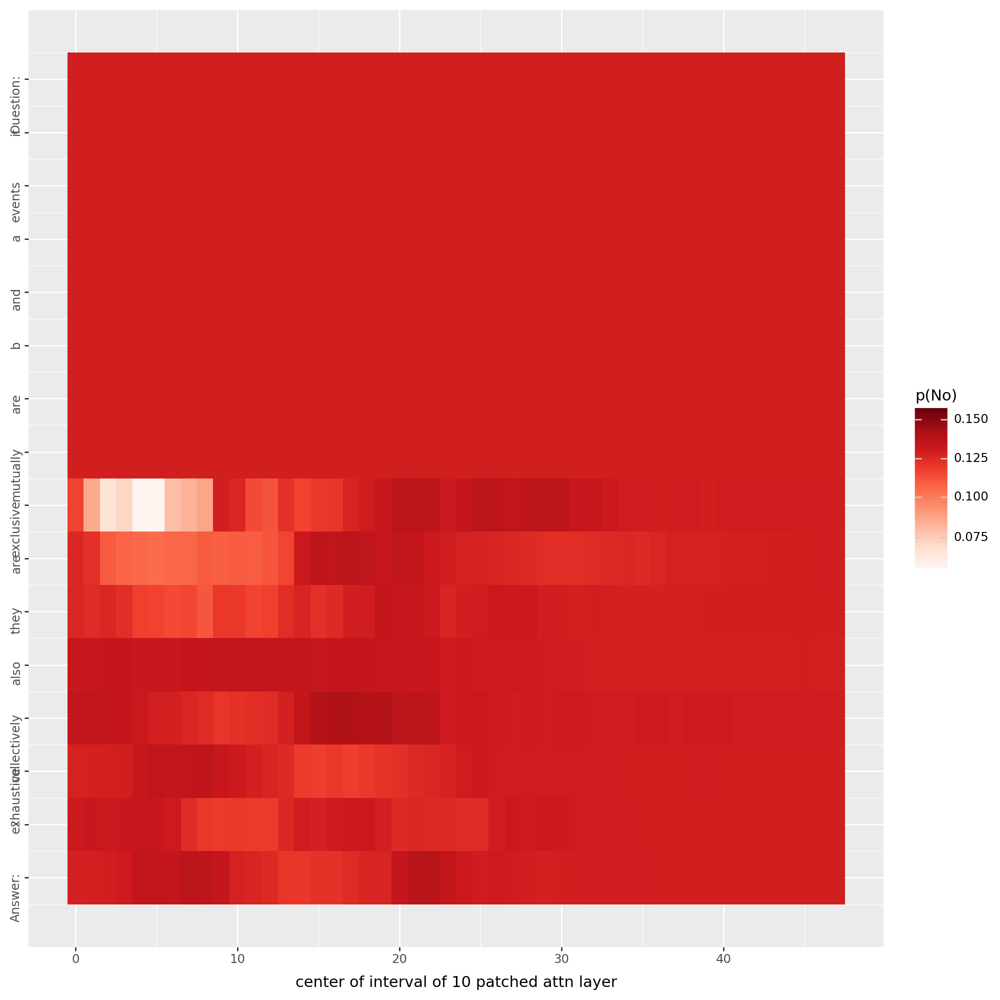

Ouestion: if events a and b are mutually exclusive are they also collectively exhaustive ? Answer:
Przed zaszumieniem
_no                  0.5475531816482544
_No                  0.07811183482408524
_not                 0.057728361338377
_yes                 0.032316576689481735
_they                0.03215676173567772
\n                   0.02647450566291809
_NO                  0.019255811348557472
_Yes                 0.012349366210401058
_n                   0.01197450328618288
_I                   0.006369616836309433
Po zaszumieniu
_no                  0.5921785235404968
_not                 0.05977717787027359
_No                  0.044735394418239594
_they                0.03121396154165268
_yes                 0.029198266565799713
\n                   0.024600692093372345
_NO                  0.013140097260475159
_n                   0.011476253159344196
_if                  0.01112089678645134
_I                   0.008613694459199905
['Ouestion:', 'if', 'events', 'a', 'and',

100%|██████████| 48/48 [06:54<00:00,  8.64s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_1_boolq_gpt2-xl_seed-1_yes_block_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]


/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.


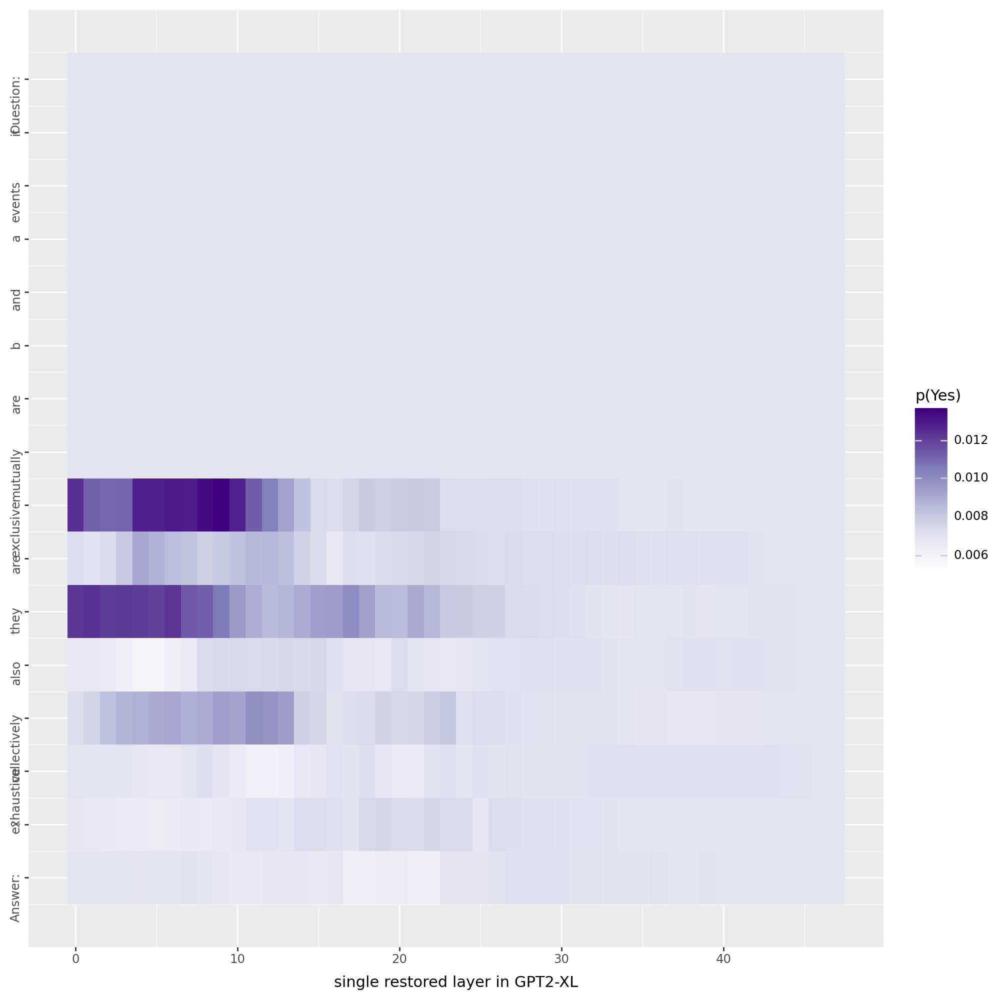

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_1_boolq_gpt2-xl_seed-1_yes_mlp_activation.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.


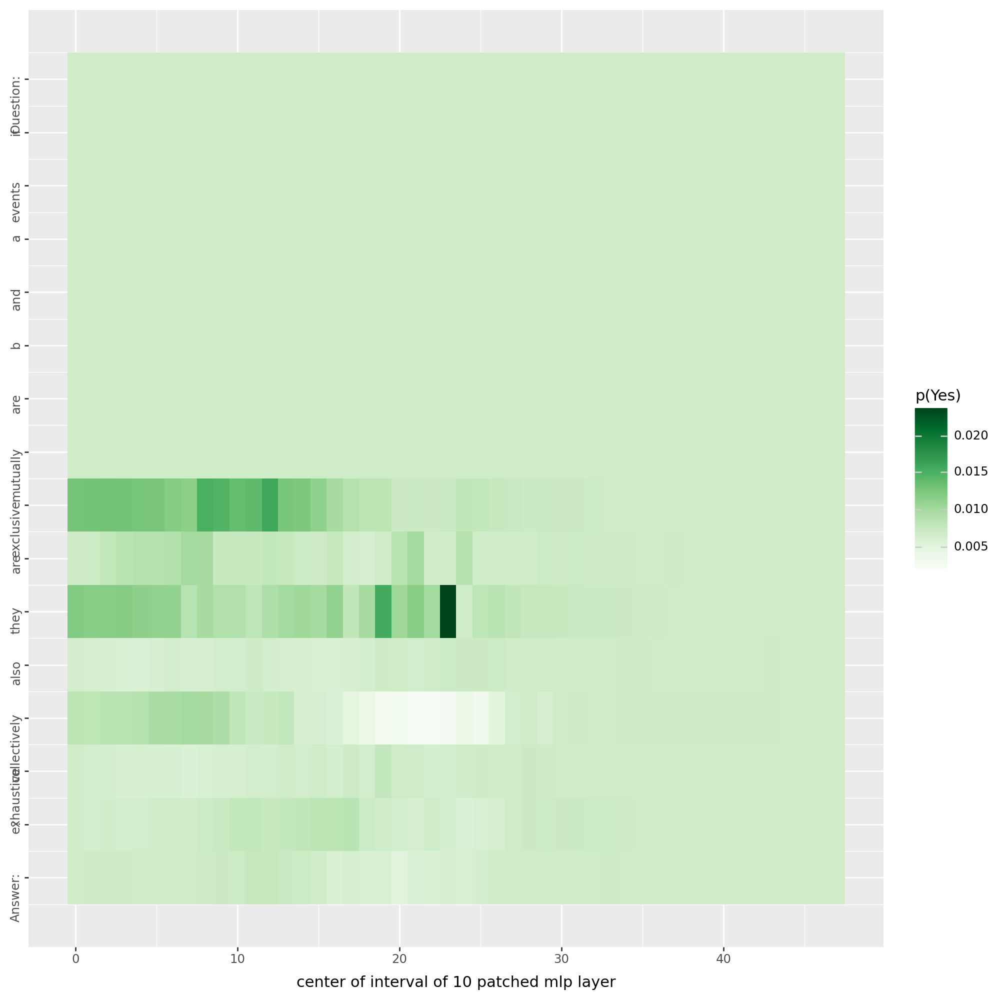

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_1_boolq_gpt2-xl_seed-1_yes_attention_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.


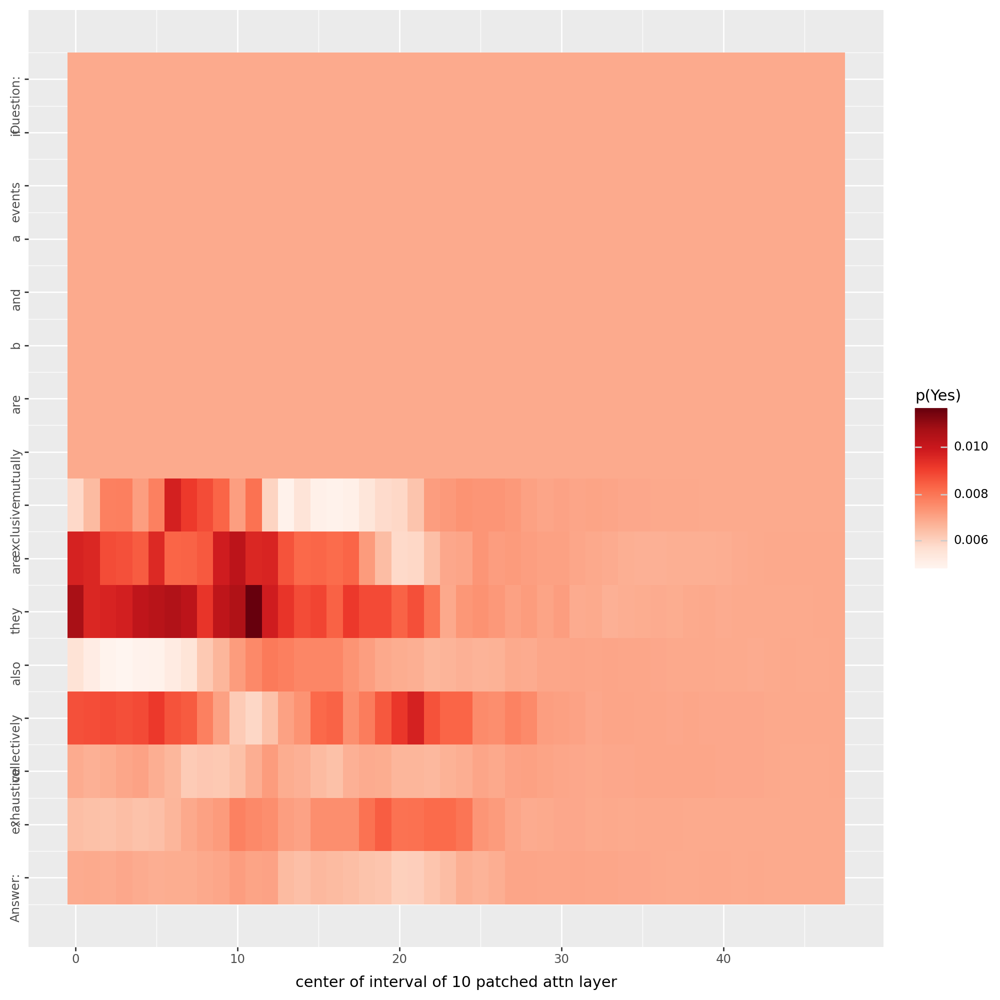

100%|██████████| 48/48 [06:54<00:00,  8.63s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_1_boolq_gpt2-xl_seed-1_no_block_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]


/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.


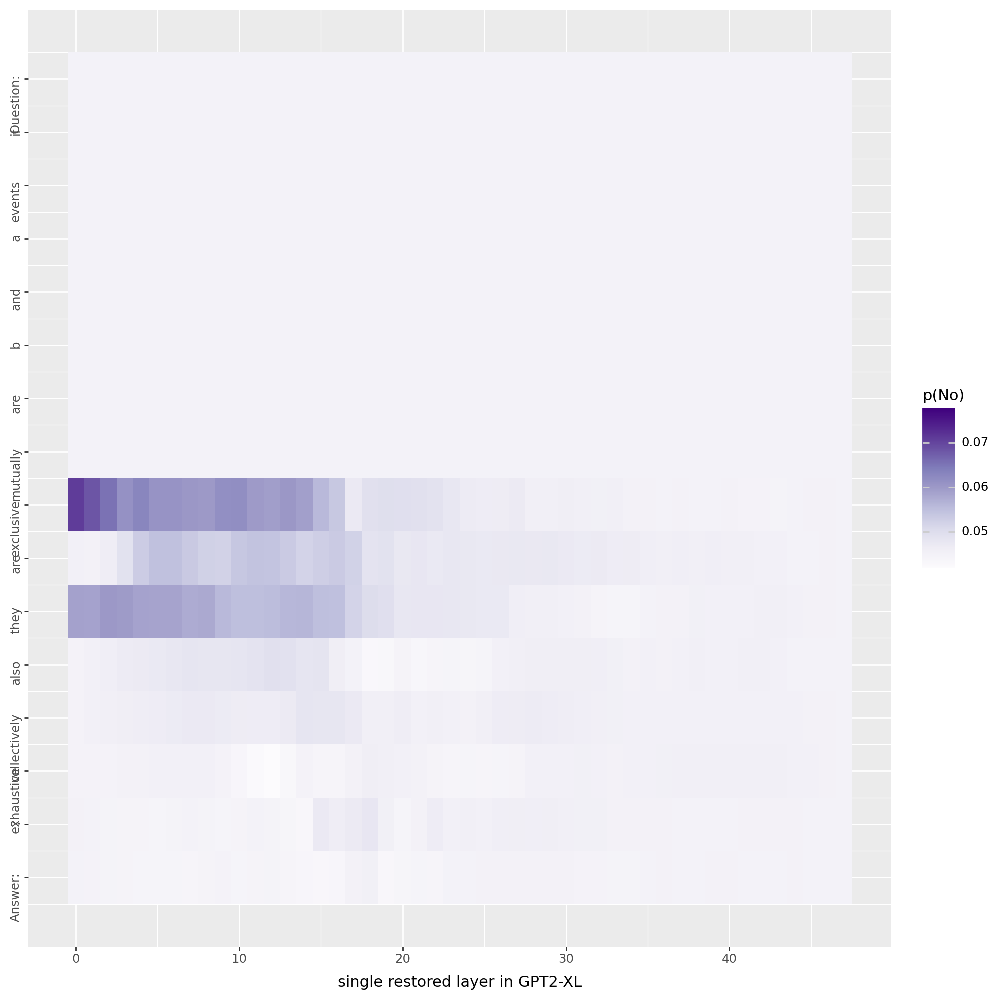

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_1_boolq_gpt2-xl_seed-1_no_mlp_activation.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.


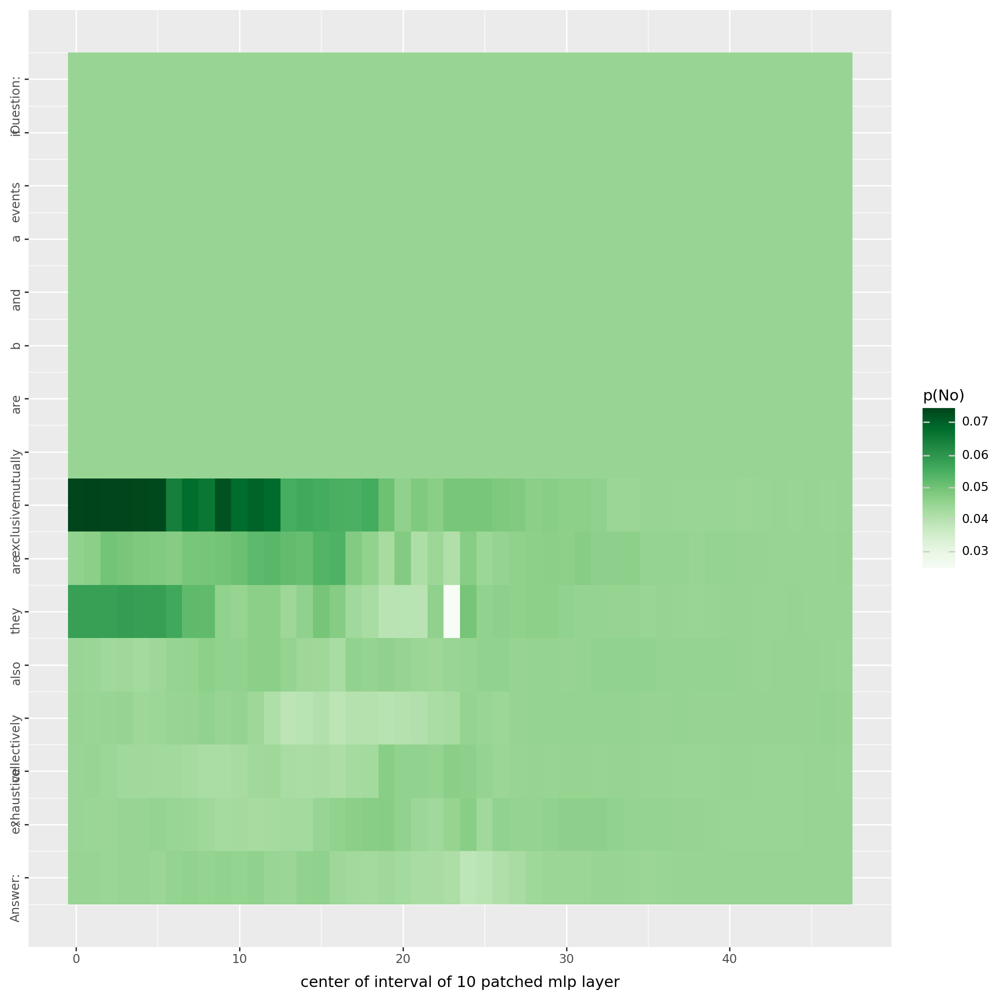

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_1_boolq_gpt2-xl_seed-1_no_attention_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.


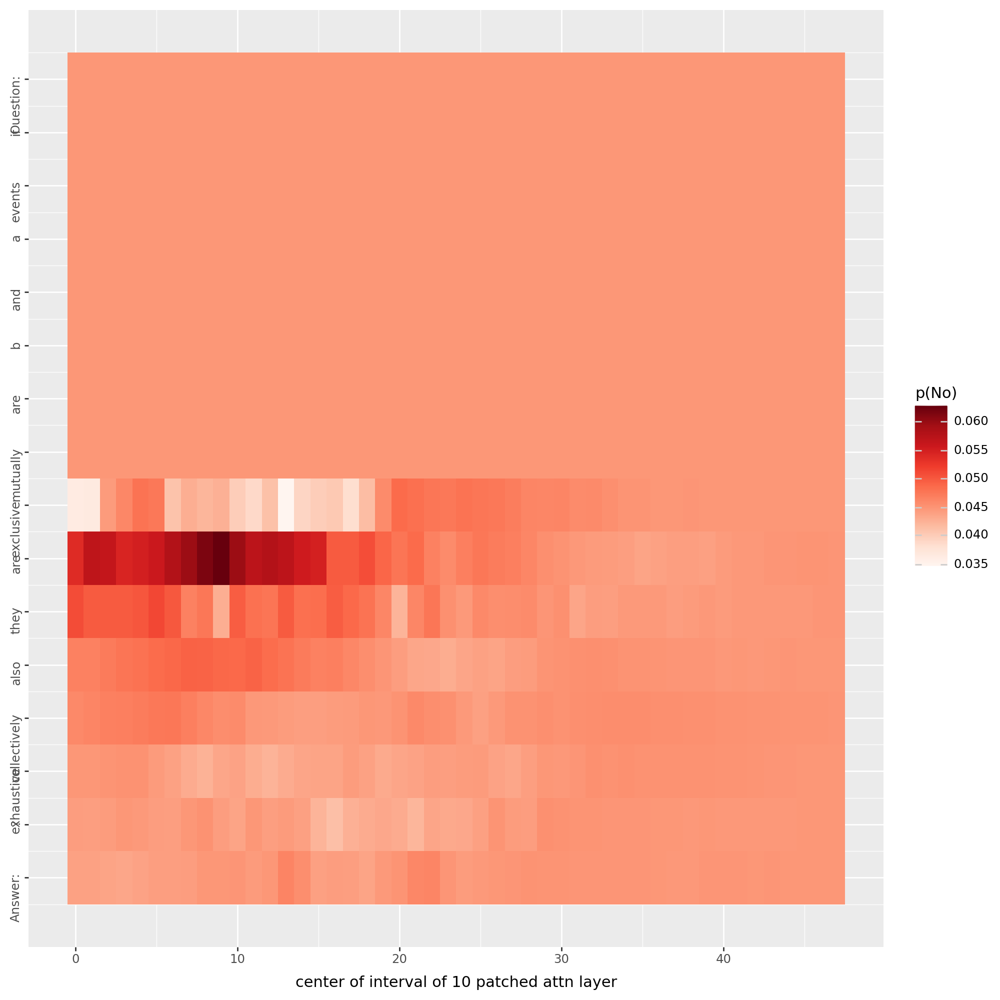

In [ ]:
unit_locations = [7, 9]
run(question, unit_locations, models_dict, 1)

### Przykład 2

In [ ]:
example_2 = ds['train'].select(range(1904, 1905))
print('QUESTION: {} \nANSWER: {}\nPASSAGE: {}\n'.format(example_2['question'], example_2['answer'], example_2['passage']))

QUESTION: ['do all bees and wasps die after stinging'] 
ANSWER: [False]
PASSAGE: ['When a honey bee stings a person, it cannot pull the barbed stinger back out. It leaves behind not only the stinger, but also part of its abdomen and digestive tract, plus muscles and nerves. This massive abdominal rupture kills the honey bee. Honey bees are the only bees to die after stinging.']



In [ ]:
tok = tokenizer(example_2['question'], return_tensors='pt').to(device)
tokens = tokenizer.convert_ids_to_tokens(tok['input_ids'][0])
print(tokens)

['do', 'Ġall', 'Ġbees', 'Ġand', 'Ġwas', 'ps', 'Ġdie', 'Ġafter', 'Ġst', 'inging']


In [ ]:
unit_locations = [2, 4, 5]

do all bees and wasps die after stinging
Przed zaszumieniem
?                    0.14664201438426971
_a                   0.09910473972558975
?"                   0.050351500511169434
,                    0.04872544854879379
_an                  0.04598160833120346
_you                 0.03790421783924103
.                    0.034009553492069244
_someone             0.031620364636182785
_the                 0.026420556008815765
_me                  0.020673085004091263
Po zaszumieniu
.                    0.05630423128604889
_the                 0.0499919168651104
,                    0.039208728820085526
_a                   0.03704485669732094
\n                   0.030153973028063774
_on                  0.023800265043973923
_them                0.0216915812343359
?                    0.01991095207631588
_and                 0.019724488258361816
)                    0.015376831404864788
['do', 'all', 'bees', 'and', 'wasps', 'die', 'after', 'stinging']


100%|██████████| 48/48 [03:23<00:00,  4.23s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_2_gpt2-xl_yes_block_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 96 rows containing missing values.


[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 96 rows containing missing values.


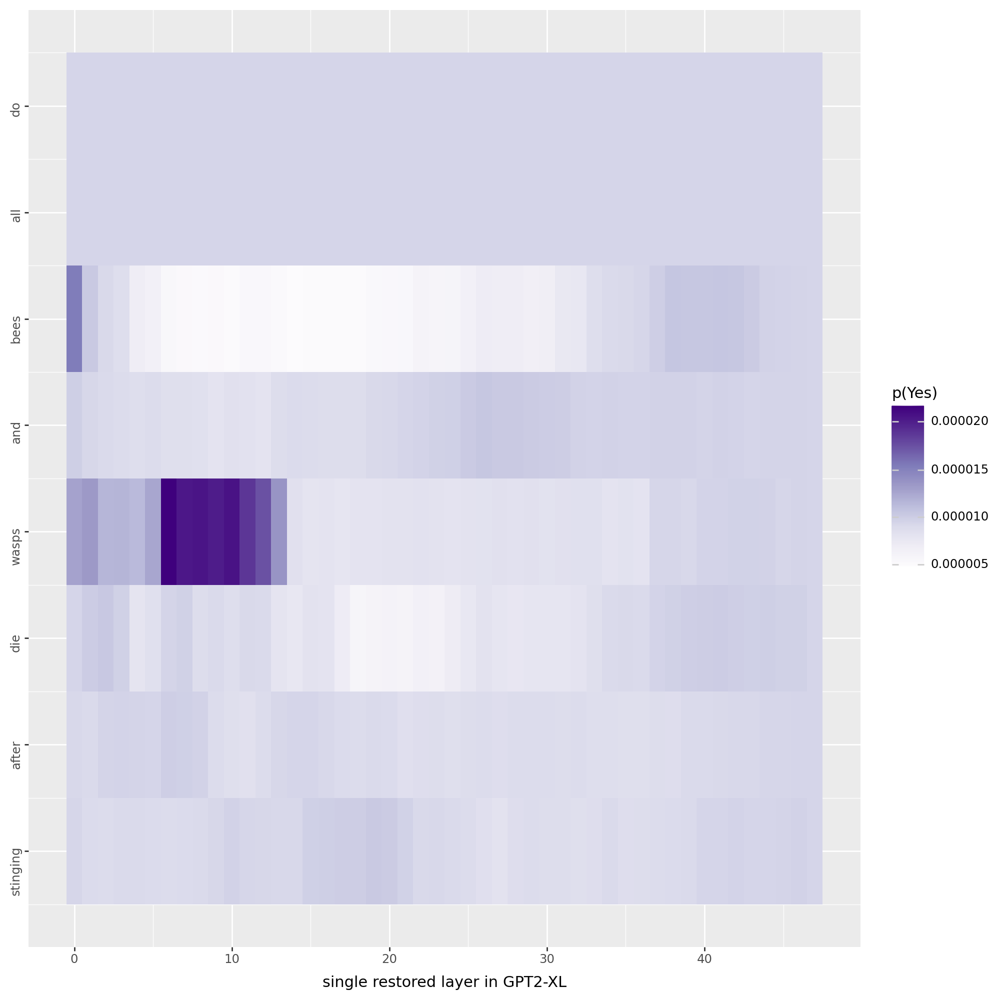

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_2_gpt2-xl_yes_mlp_activation.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 96 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 96 rows containing missing values.


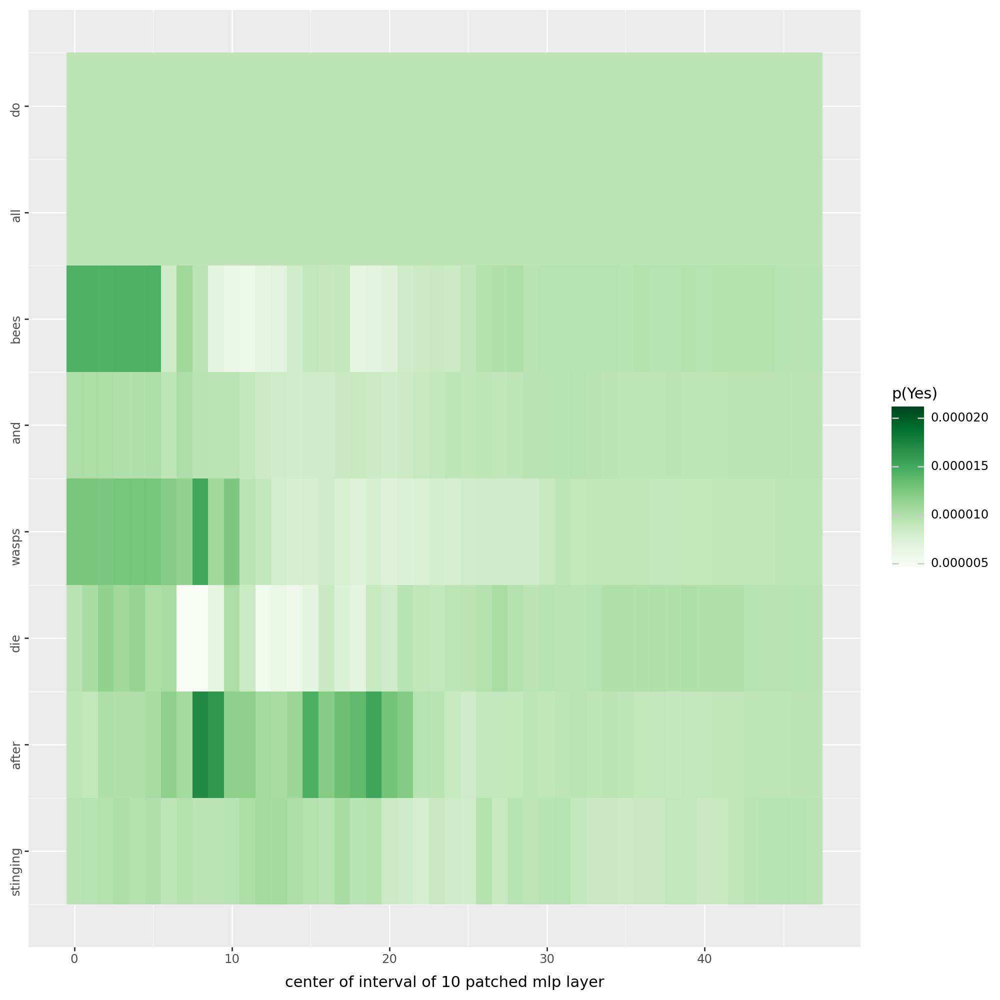

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_2_gpt2-xl_yes_attention_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 96 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 96 rows containing missing values.


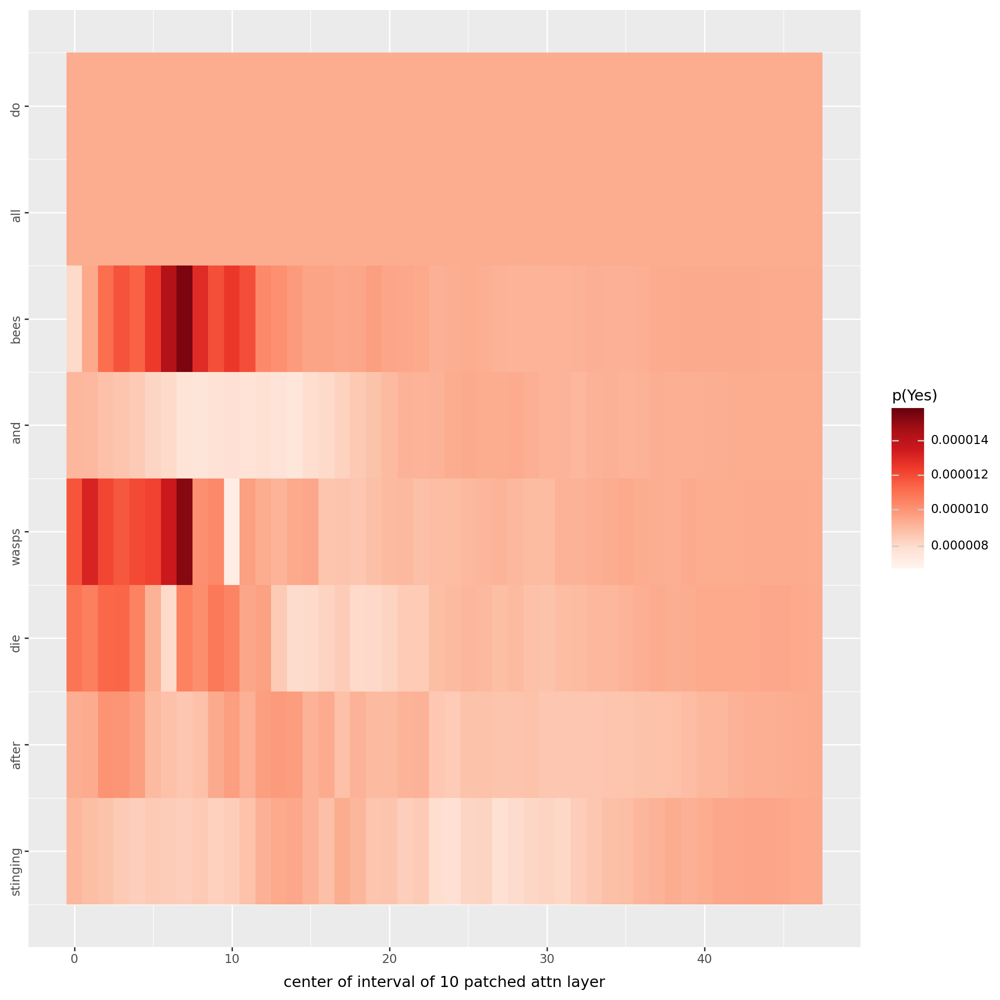

100%|██████████| 48/48 [03:16<00:00,  4.10s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_2_gpt2-xl_no_block_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 96 rows containing missing values.


[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 96 rows containing missing values.


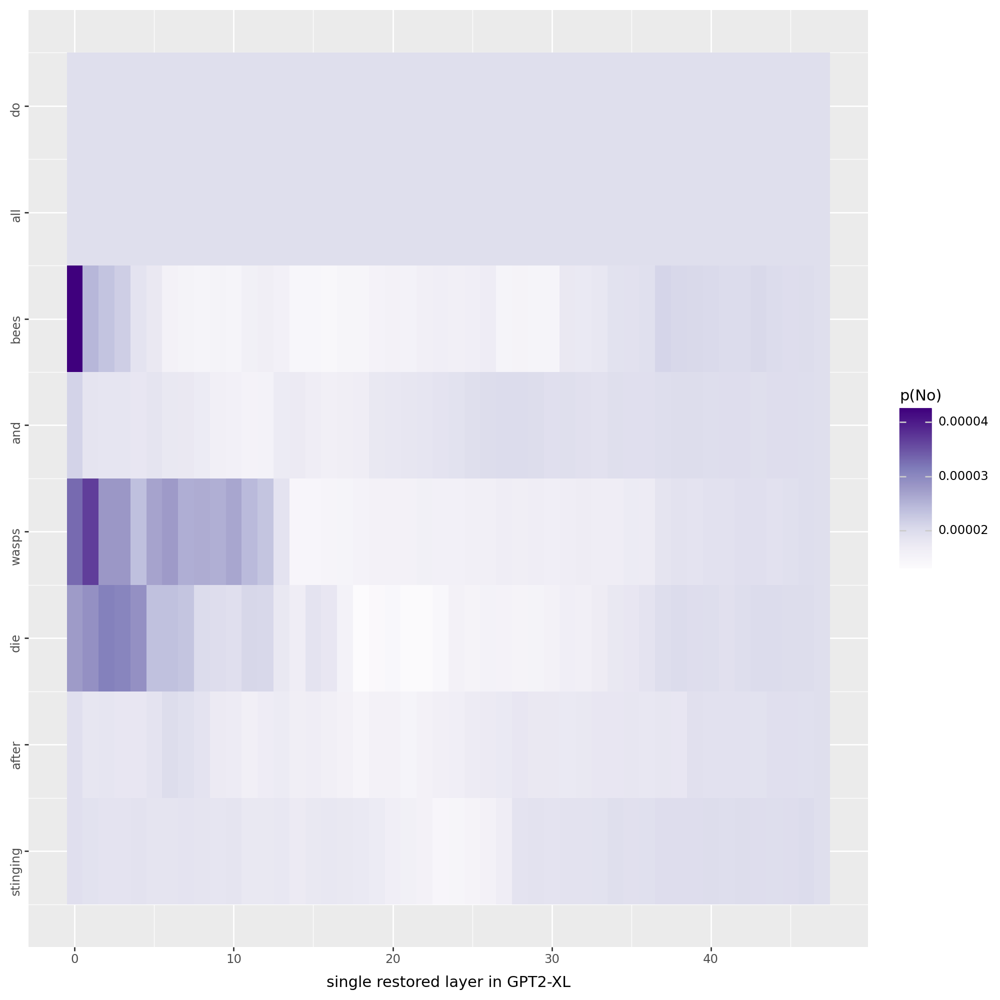

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_2_gpt2-xl_no_mlp_activation.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 96 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 96 rows containing missing values.


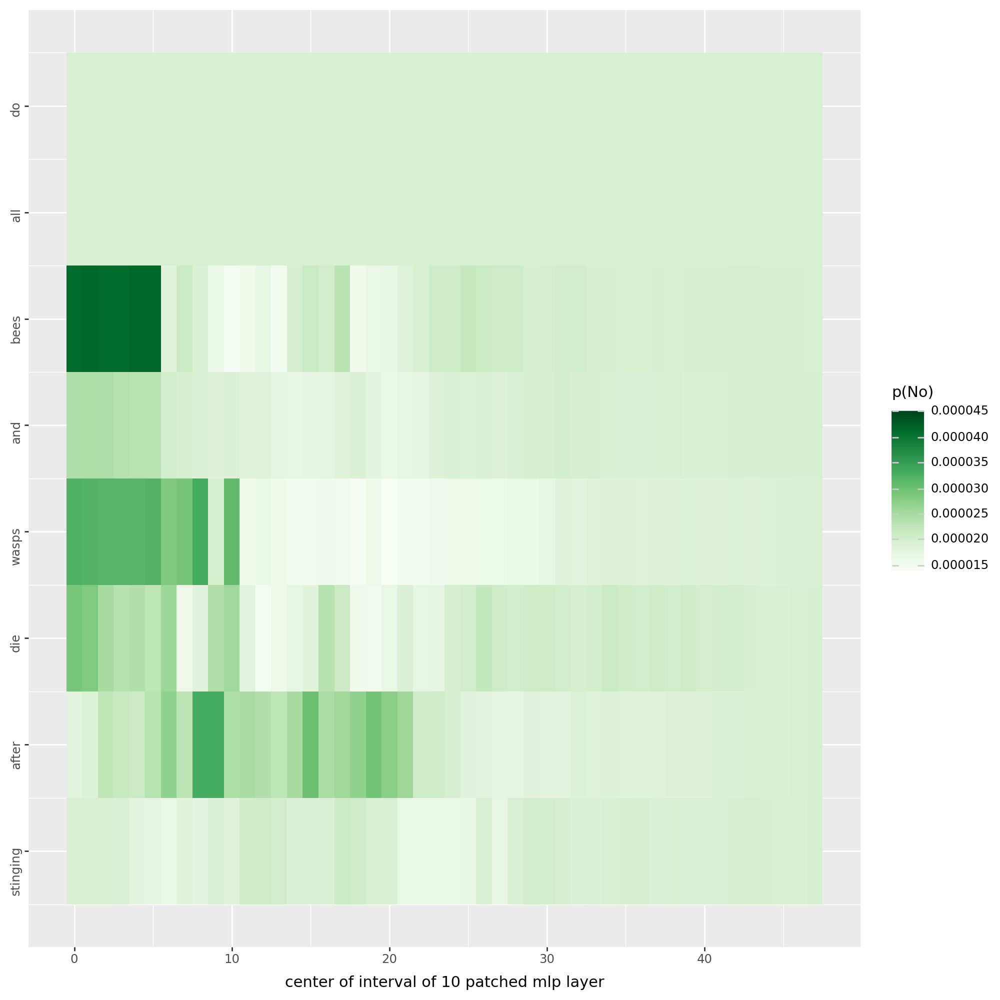

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_2_gpt2-xl_no_attention_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 96 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 96 rows containing missing values.


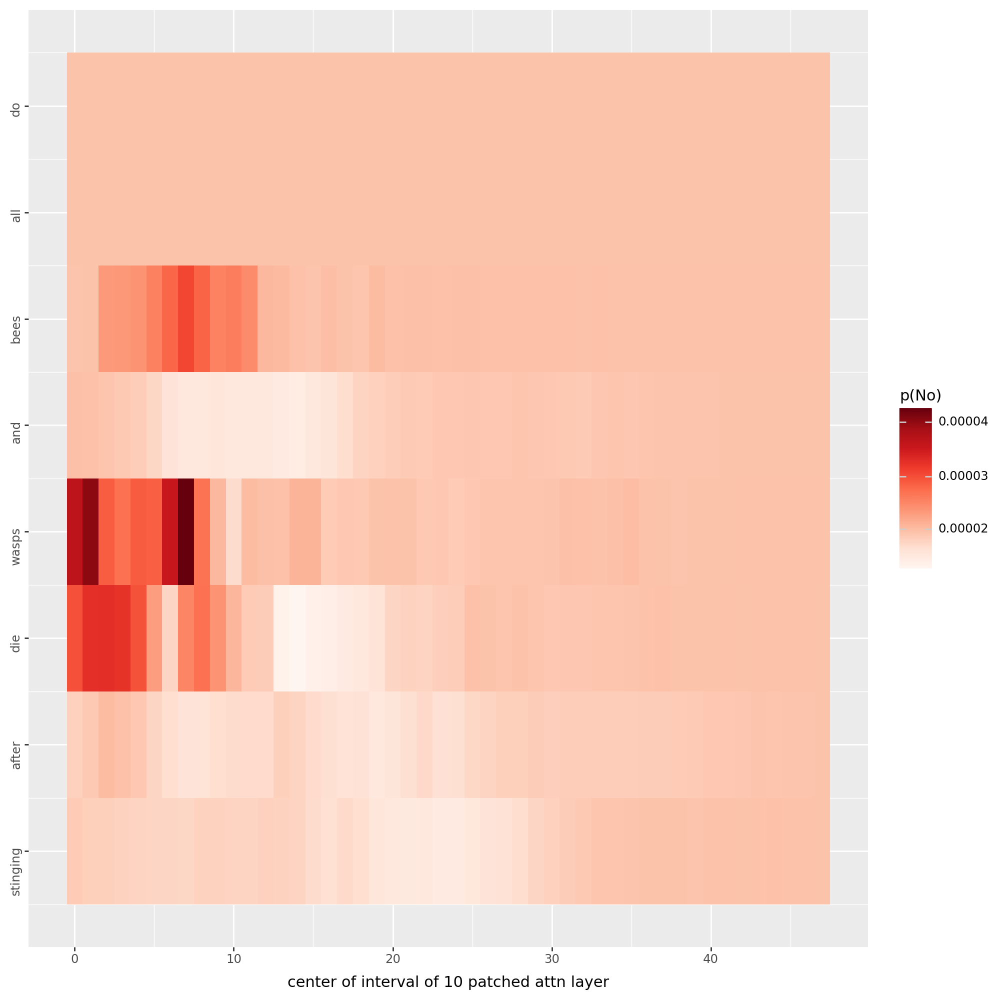

do all bees and wasps die after stinging
Przed zaszumieniem
?                    0.42879021167755127
,                    0.07649550586938858
_you                 0.04769604653120041
_one                 0.044249363243579865
_a                   0.04176018759608269
_or                  0.041420627385377884
_the                 0.03271957486867905
_me                  0.02733072079718113
_an                  0.0238761268556118
_and                 0.020009765401482582
Po zaszumieniu
_a                   0.1585850566625595
?                    0.11172888427972794
_the                 0.11140085756778717
_an                  0.07523787021636963
_one                 0.042565640062093735
_me                  0.03976630046963692
_someone             0.03279082849621773
_you                 0.02848568558692932
_them                0.019622843712568283
_him                 0.017023097723722458
['do', 'all', 'bees', 'and', 'wasps', 'die', 'after', 'stinging']


100%|██████████| 48/48 [03:20<00:00,  4.17s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_2_boolq_gpt2-xl_seed-1_yes_block_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 96 rows containing missing values.


[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 96 rows containing missing values.


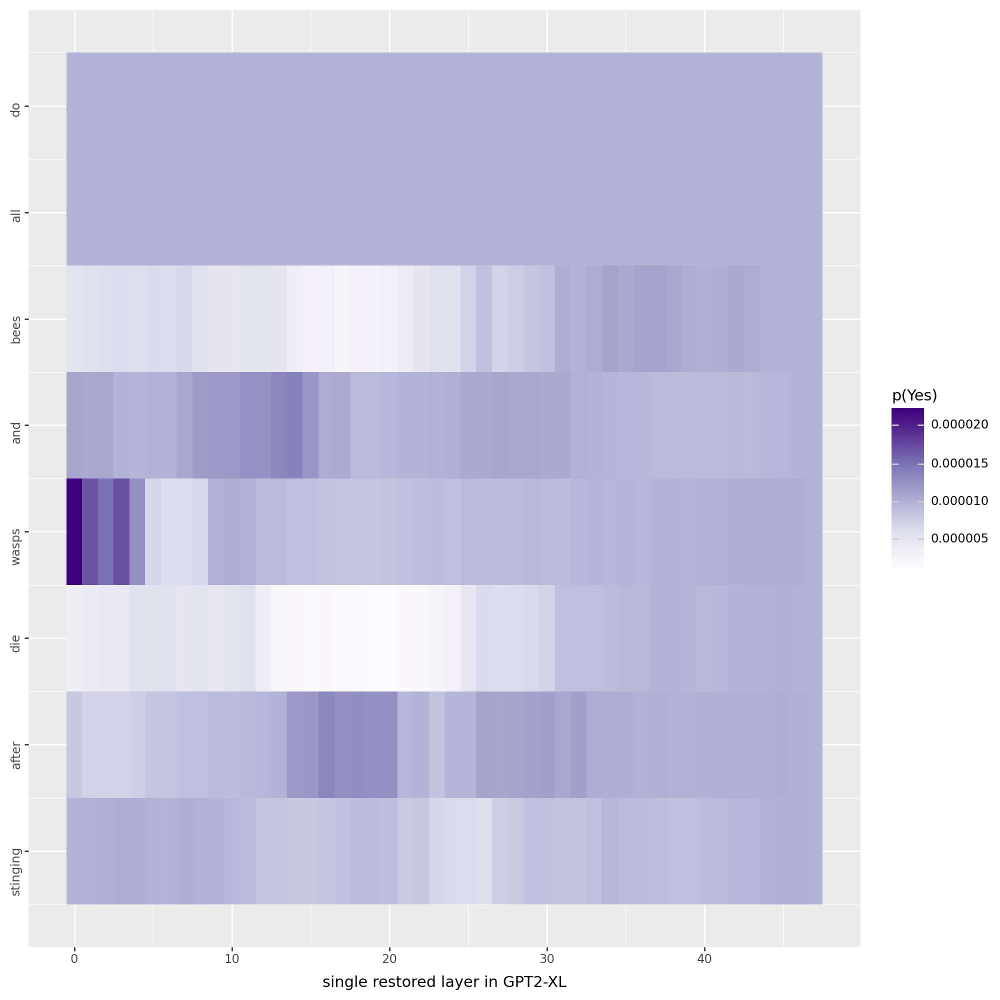

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_2_boolq_gpt2-xl_seed-1_yes_mlp_activation.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 96 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 96 rows containing missing values.


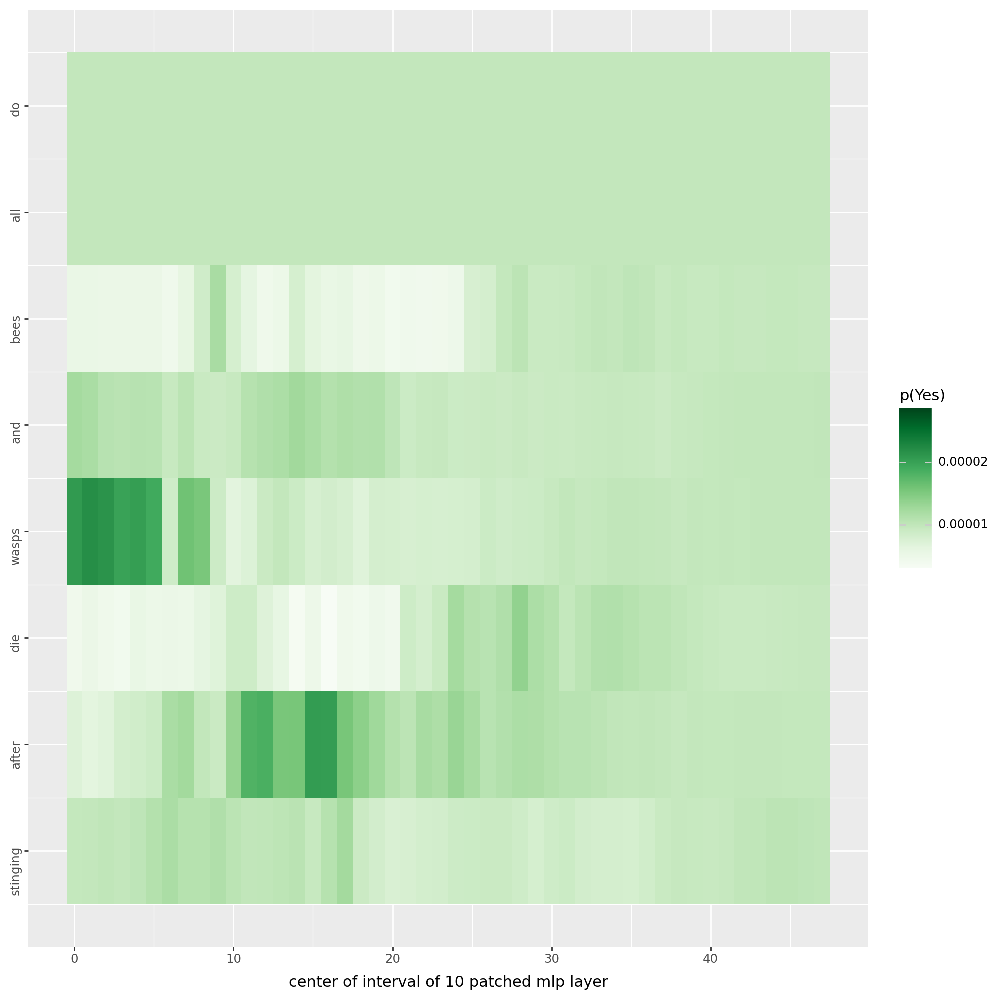

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_2_boolq_gpt2-xl_seed-1_yes_attention_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 96 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 96 rows containing missing values.


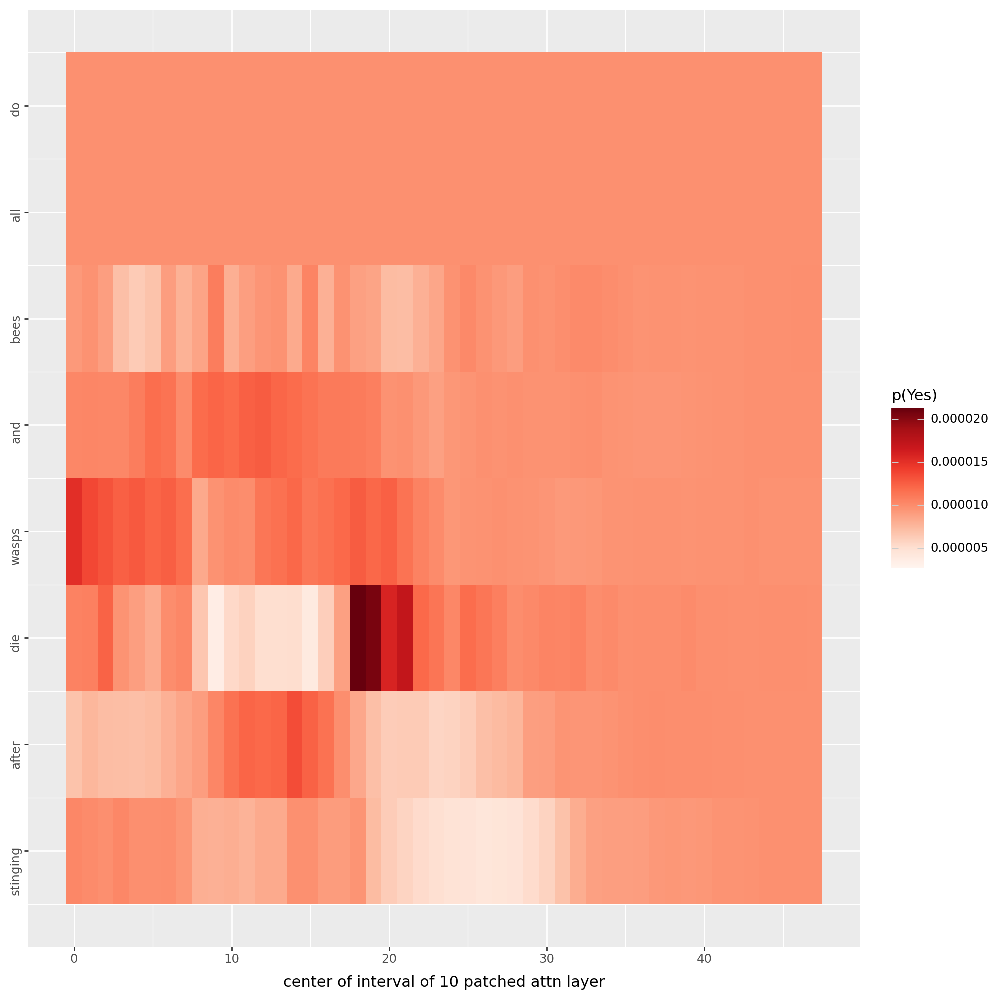

100%|██████████| 48/48 [03:18<00:00,  4.14s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_2_boolq_gpt2-xl_seed-1_no_block_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 96 rows containing missing values.


[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 96 rows containing missing values.


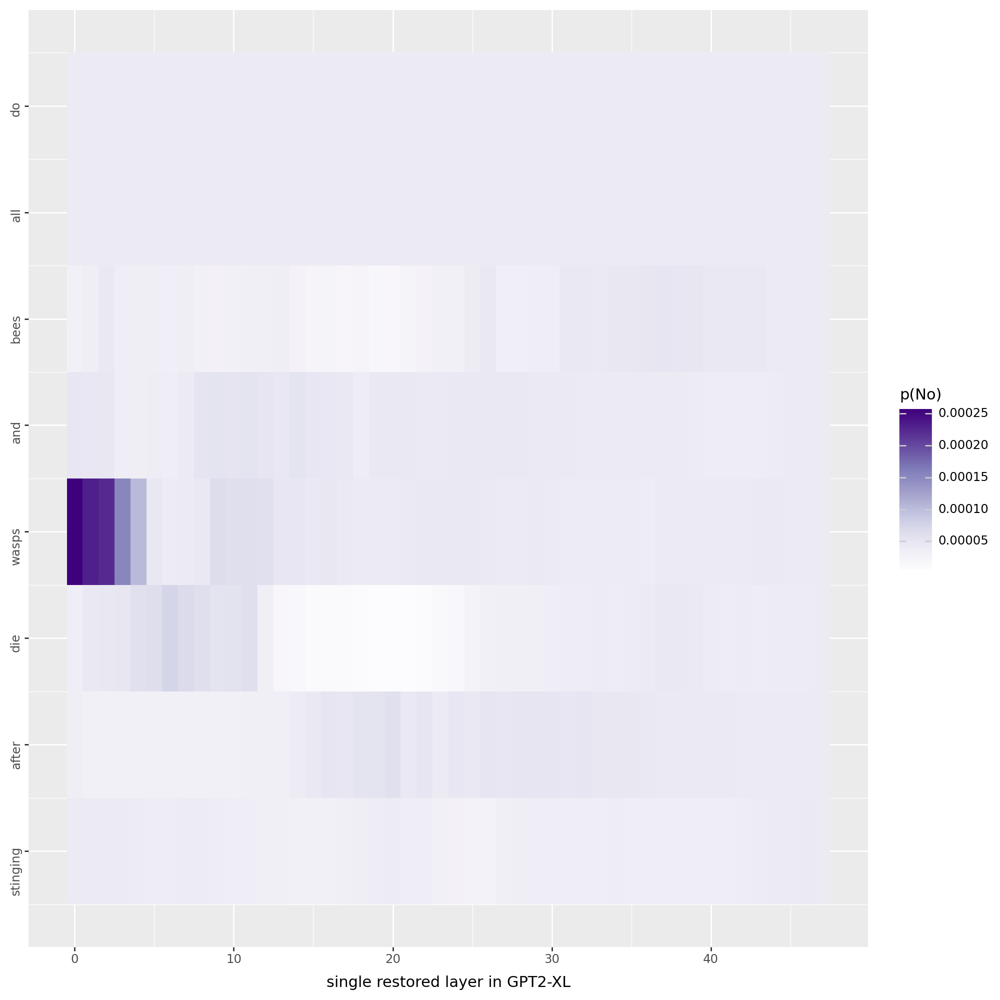

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_2_boolq_gpt2-xl_seed-1_no_mlp_activation.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 96 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 96 rows containing missing values.


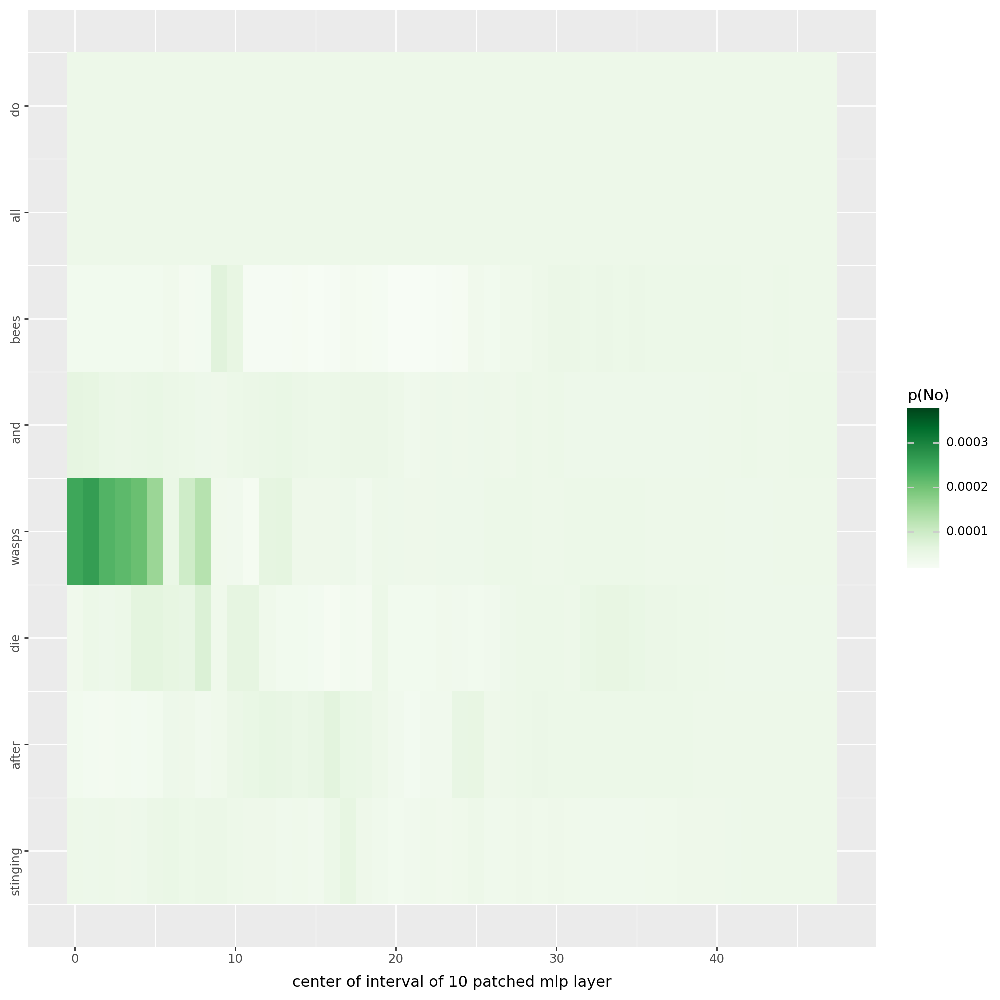

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_2_boolq_gpt2-xl_seed-1_no_attention_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 96 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 96 rows containing missing values.


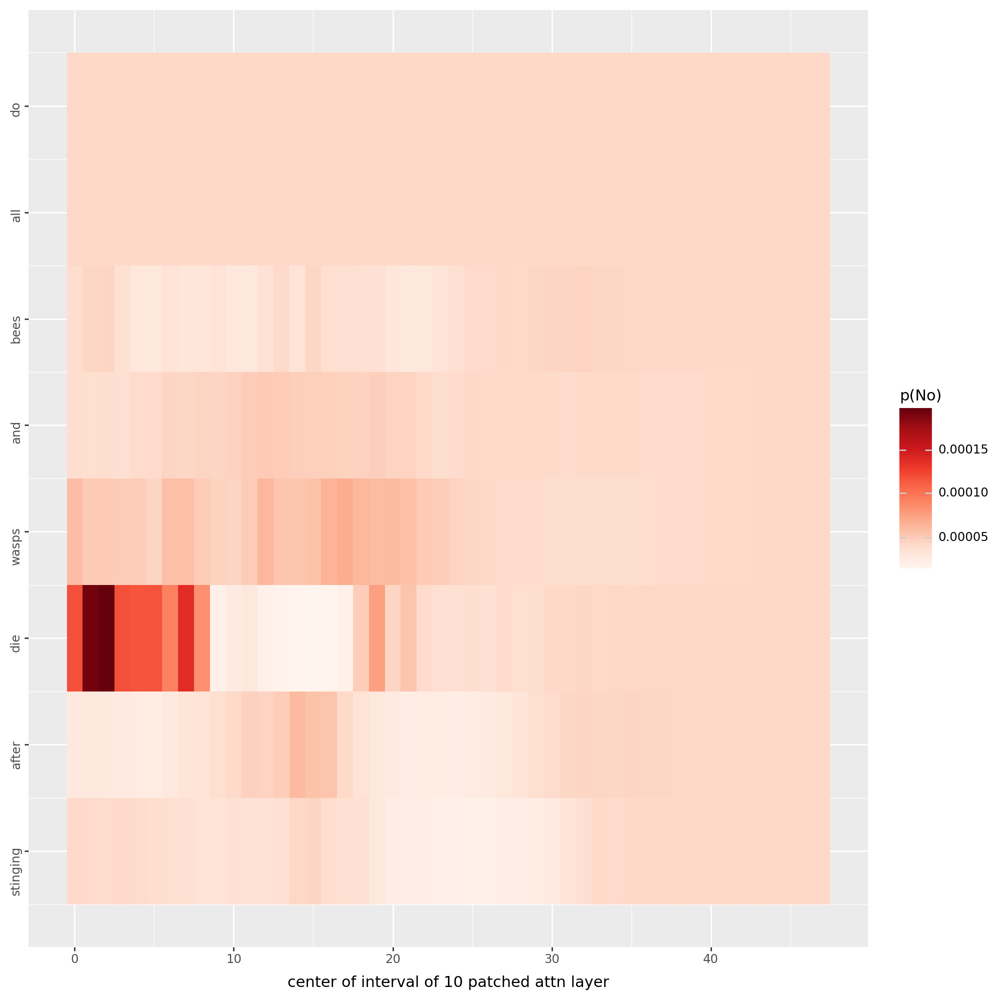

In [ ]:
run(example_2['question'][0], unit_locations, models_dict, 2)

In [ ]:
question = 'Ouestion: ' + example_2['question'][0] + ' ?' + ' Answer:'
tok = tokenizer(question, return_tensors='pt').to(device)
tokens = tokenizer.convert_ids_to_tokens(tok['input_ids'][0])
print(tokens)

['O', 'u', 'est', 'ion', ':', 'Ġdo', 'Ġall', 'Ġbees', 'Ġand', 'Ġwas', 'ps', 'Ġdie', 'Ġafter', 'Ġst', 'inging', 'Ġ?', 'ĠAnswer', ':']


In [ ]:
unit_locations = [7, 9, 10]

Ouestion: do all bees and wasps die after stinging ? Answer:
Przed zaszumieniem
_No                  0.192949116230011
_Yes                 0.1040407046675682
\n                   0.05044373497366905
_yes                 0.04419366642832756
_no                  0.043357715010643005
_They                0.03450257331132889
_The                 0.030738377943634987
_Not                 0.02020769752562046
_All                 0.015068997628986835
_they                0.01502238493412733
Po zaszumieniu
_No                  0.3136625289916992
_no                  0.06406228244304657
_Yes                 0.05863657593727112
_yes                 0.03177676722407341
\n                   0.02243410423398018
_The                 0.0180190559476614
_They                0.01777939684689045
_All                 0.015564315021038055
_Not                 0.013310566544532776
_they                0.012638749554753304
['Ouestion:', 'do', 'all', 'bees', 'and', 'wasps', 'die', 'after', 'stinging', '?', 

100%|██████████| 48/48 [05:45<00:00,  7.20s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_22_gpt2-xl_yes_block_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 336 rows containing missing values.


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 336 rows containing missing values.


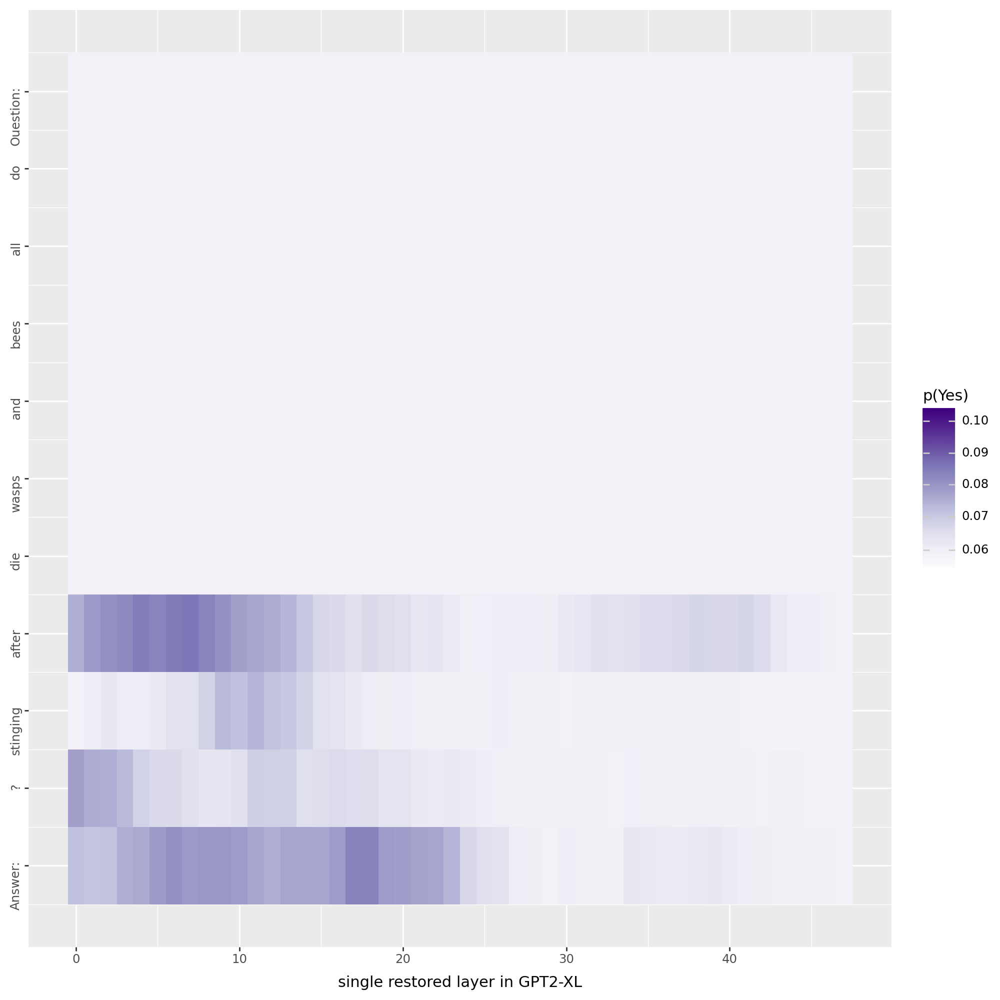

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_22_gpt2-xl_yes_mlp_activation.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 336 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 336 rows containing missing values.


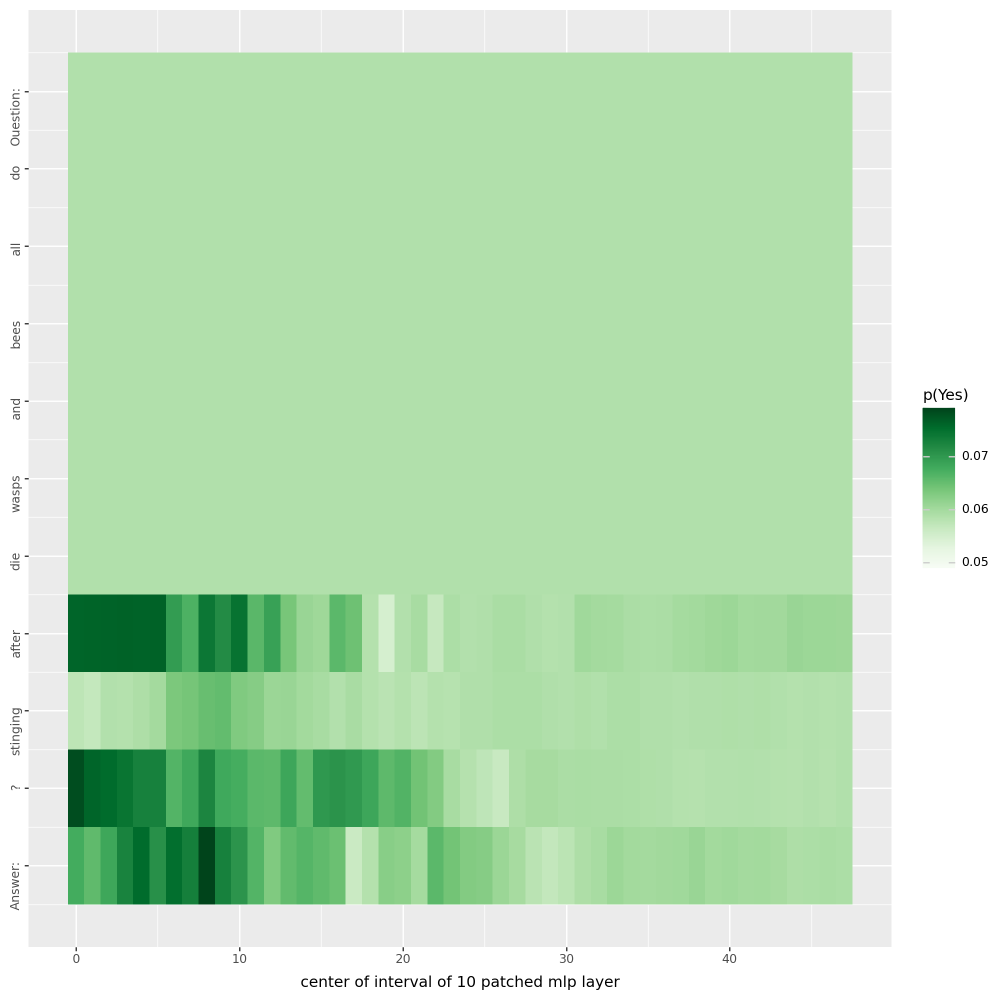

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_22_gpt2-xl_yes_attention_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 336 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 336 rows containing missing values.


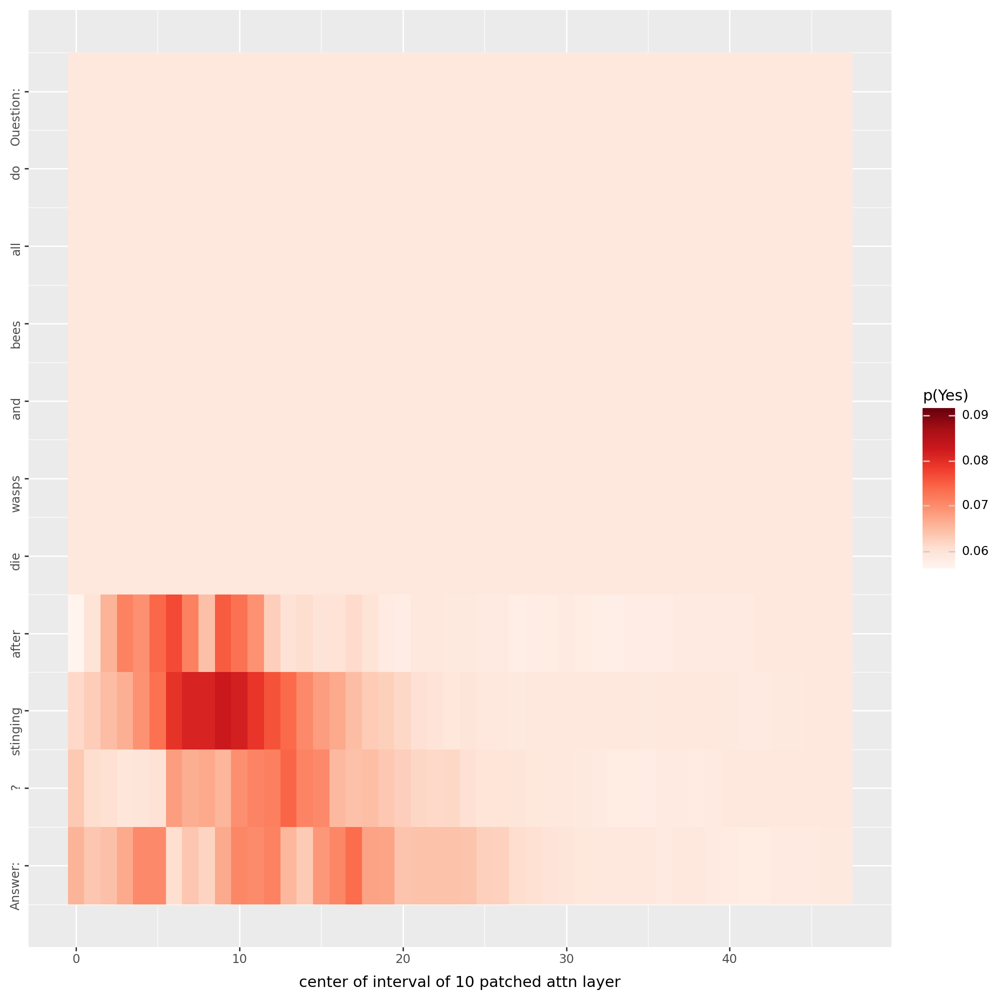

100%|██████████| 48/48 [05:46<00:00,  7.22s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_22_gpt2-xl_no_block_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 336 rows containing missing values.


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 336 rows containing missing values.


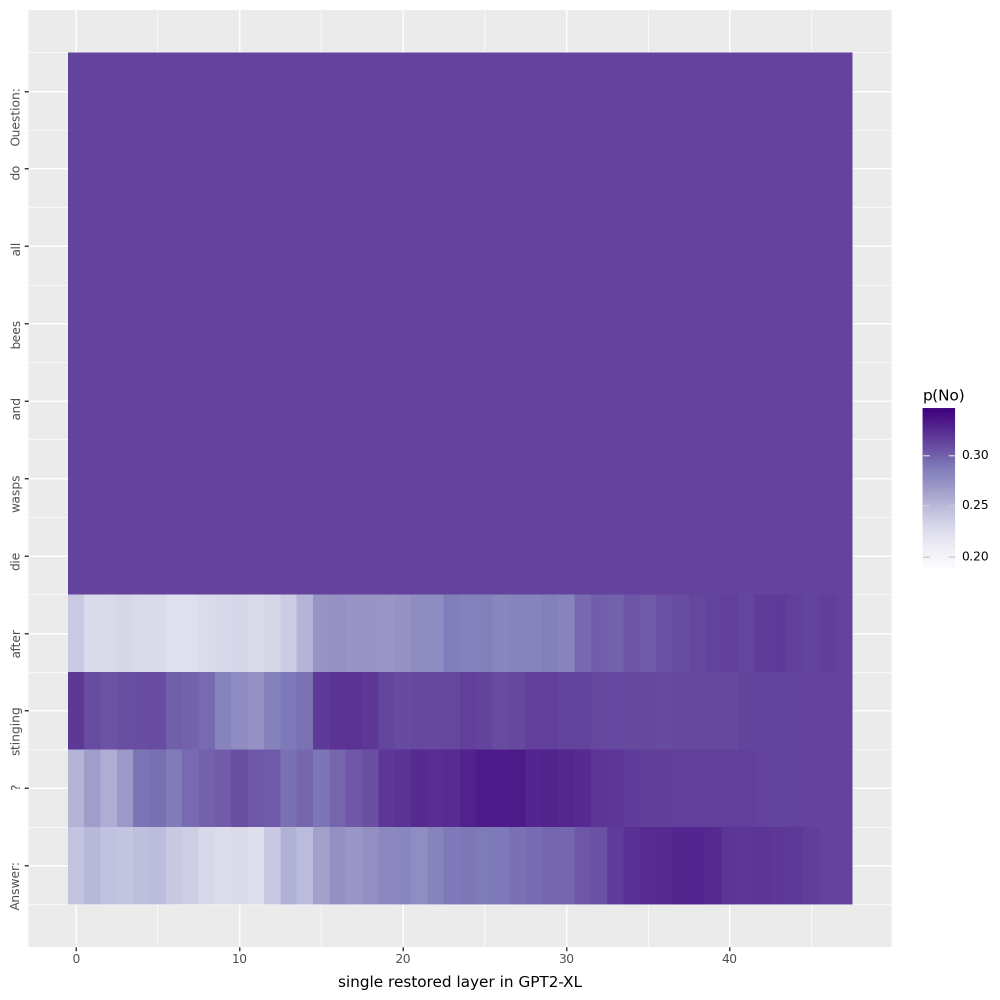

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_22_gpt2-xl_no_mlp_activation.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 336 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 336 rows containing missing values.


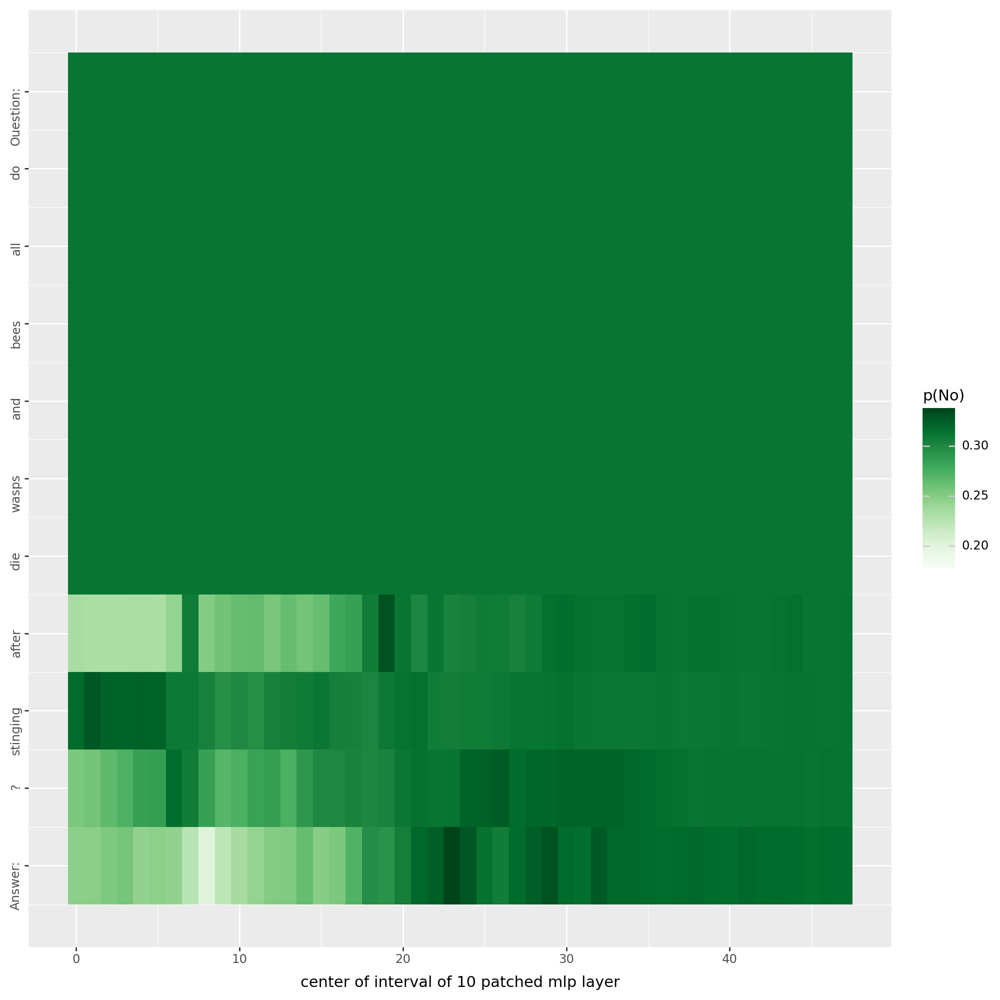

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_22_gpt2-xl_no_attention_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 336 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 336 rows containing missing values.


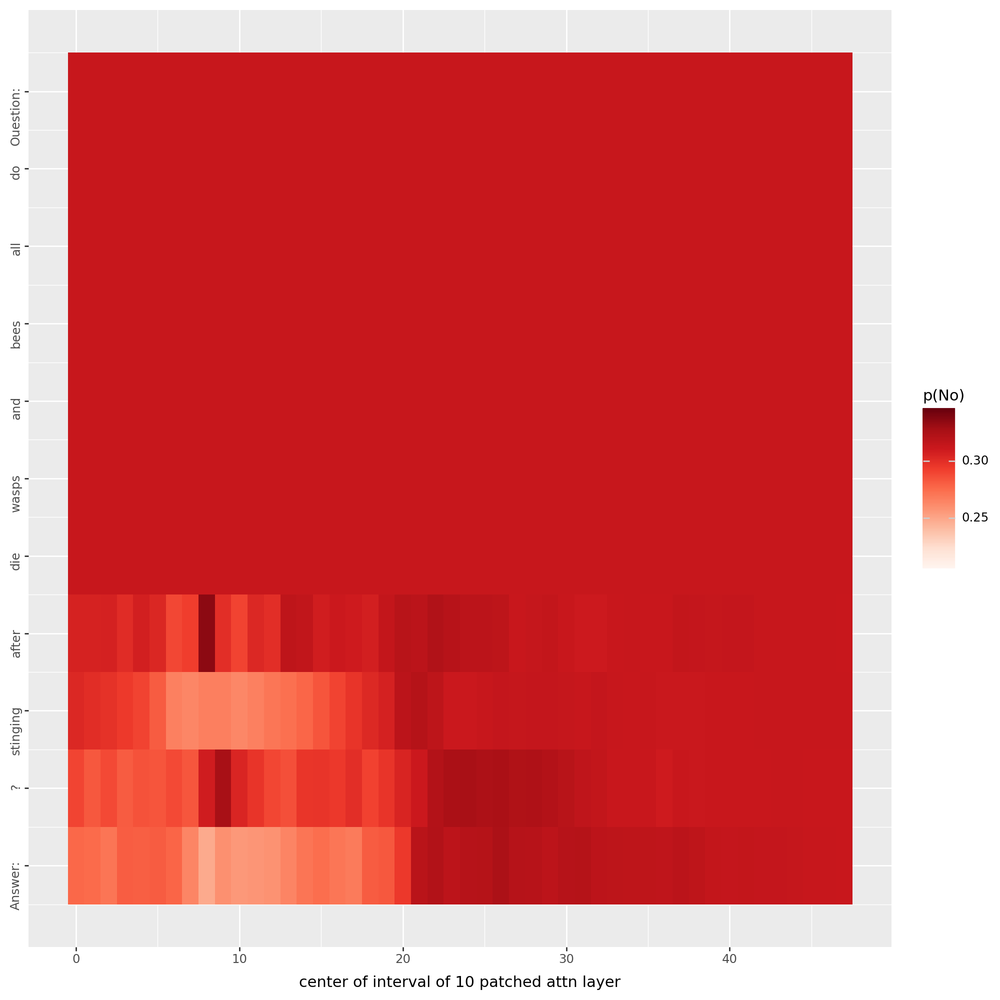

Ouestion: do all bees and wasps die after stinging ? Answer:
Przed zaszumieniem
_no                  0.5254853963851929
_No                  0.1542758345603943
_not                 0.09048139303922653
_NO                  0.036447398364543915
\n                   0.034299299120903015
_yes                 0.0192288625985384
_Not                 0.009495783597230911
_Yes                 0.006732350680977106
_n                   0.006536784581840038
_some                0.005289039108902216
Po zaszumieniu
_no                  0.6246766448020935
_No                  0.08819392323493958
_not                 0.06614383310079575
_n                   0.039876051247119904
_NO                  0.02876596711575985
\n                   0.020249783992767334
_yes                 0.012536713853478432
_Nope                0.010475605726242065
_Not                 0.003641156479716301
no                   0.0032650604844093323
['Ouestion:', 'do', 'all', 'bees', 'and', 'wasps', 'die', 'after', 'stinging

100%|██████████| 48/48 [05:46<00:00,  7.22s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_22_boolq_gpt2-xl_seed-1_yes_block_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 336 rows containing missing values.


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 336 rows containing missing values.


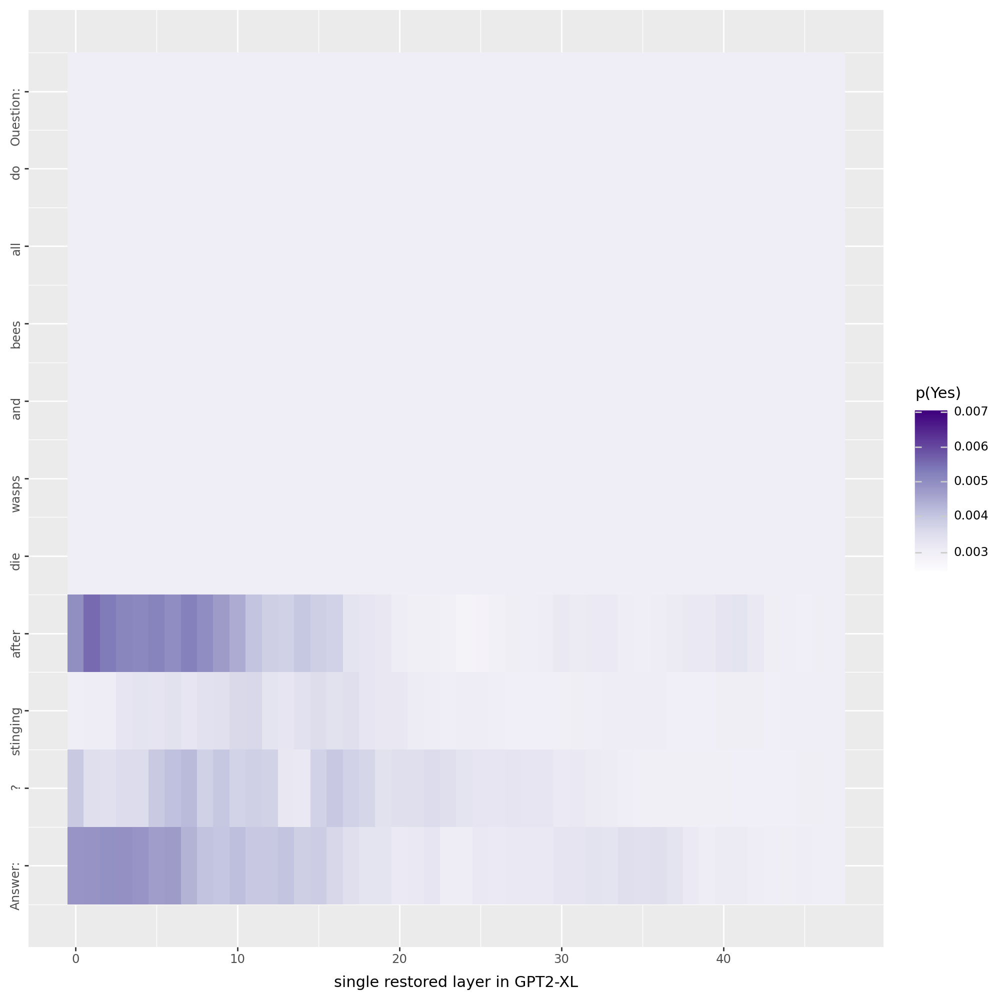

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_22_boolq_gpt2-xl_seed-1_yes_mlp_activation.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 336 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 336 rows containing missing values.


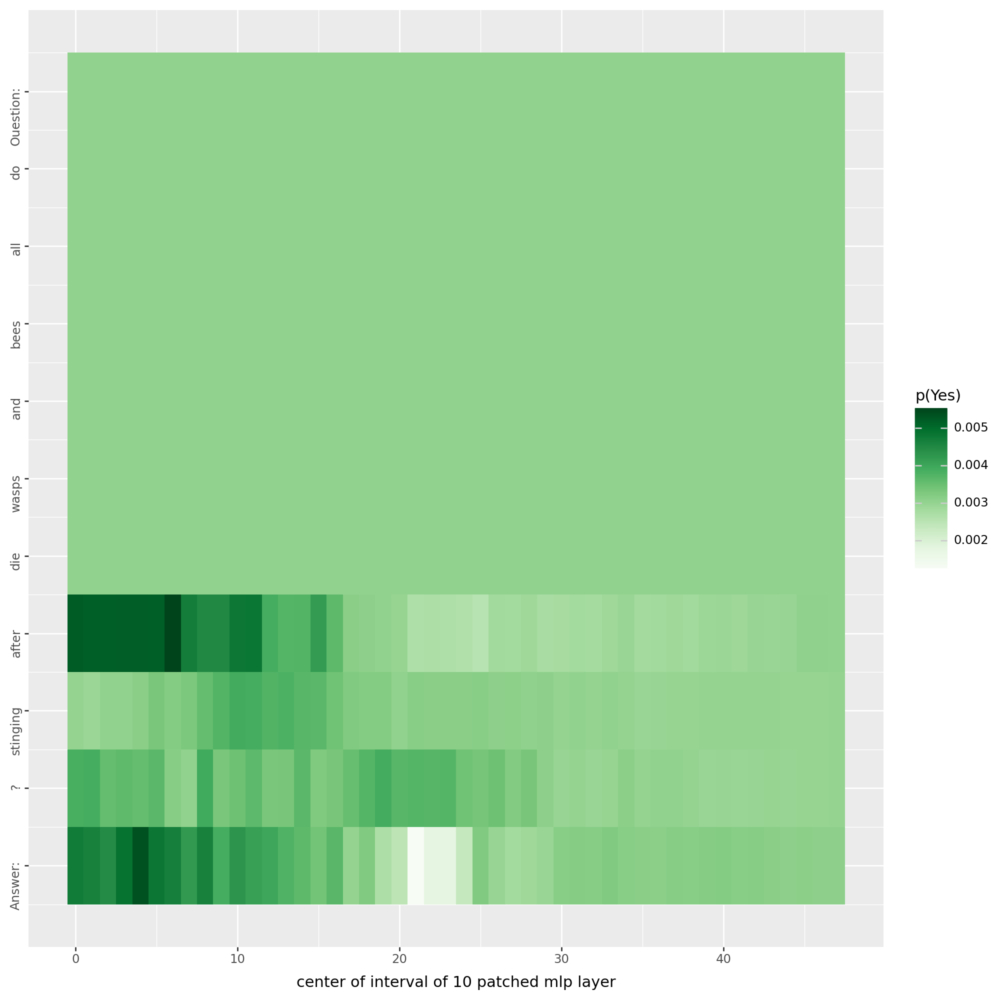

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_22_boolq_gpt2-xl_seed-1_yes_attention_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 336 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 336 rows containing missing values.


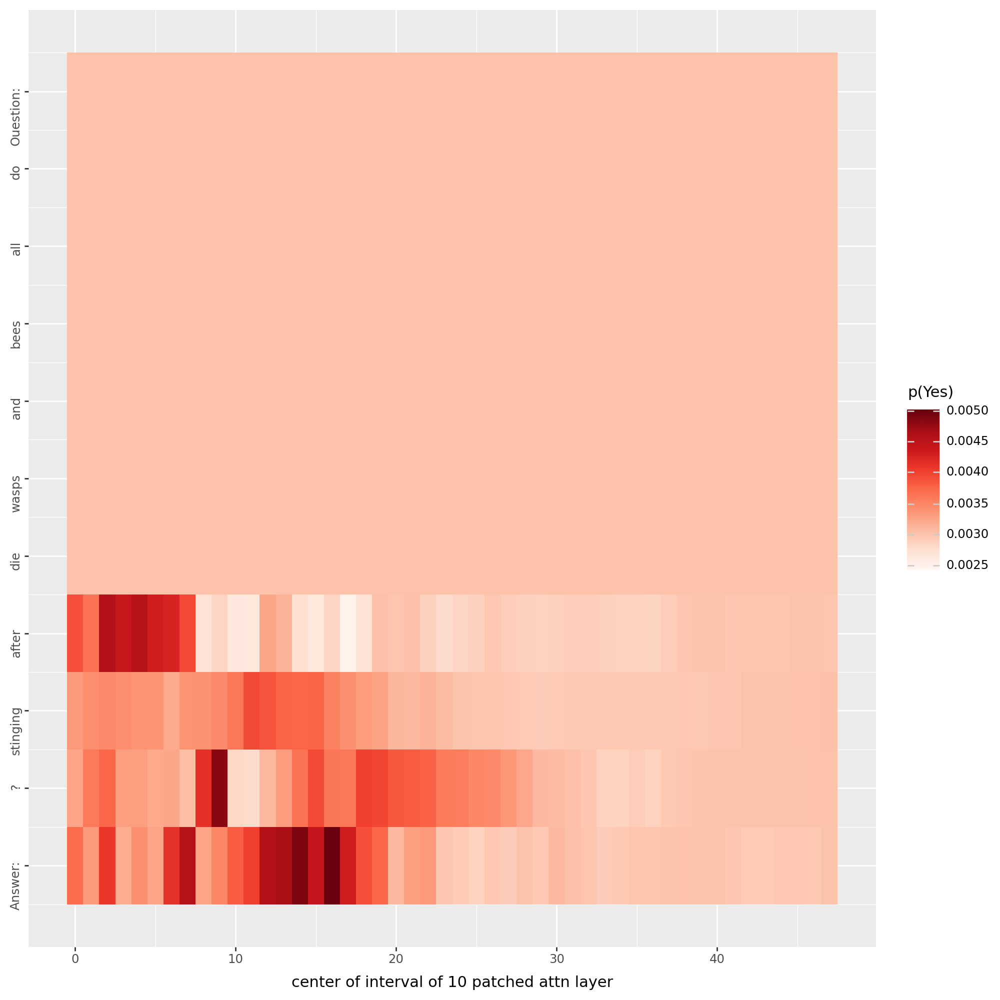

100%|██████████| 48/48 [06:14<00:00,  7.80s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_22_boolq_gpt2-xl_seed-1_no_block_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 336 rows containing missing values.


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 336 rows containing missing values.


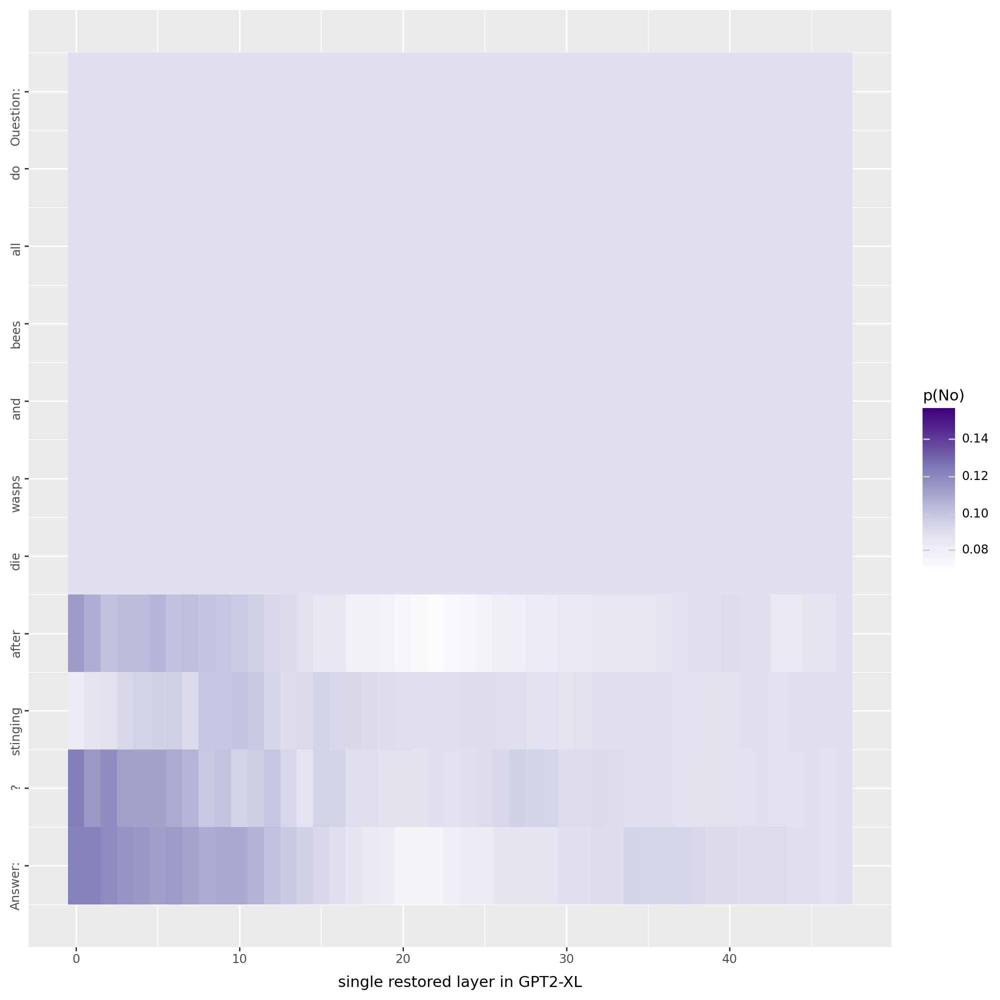

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_22_boolq_gpt2-xl_seed-1_no_mlp_activation.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 336 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 336 rows containing missing values.


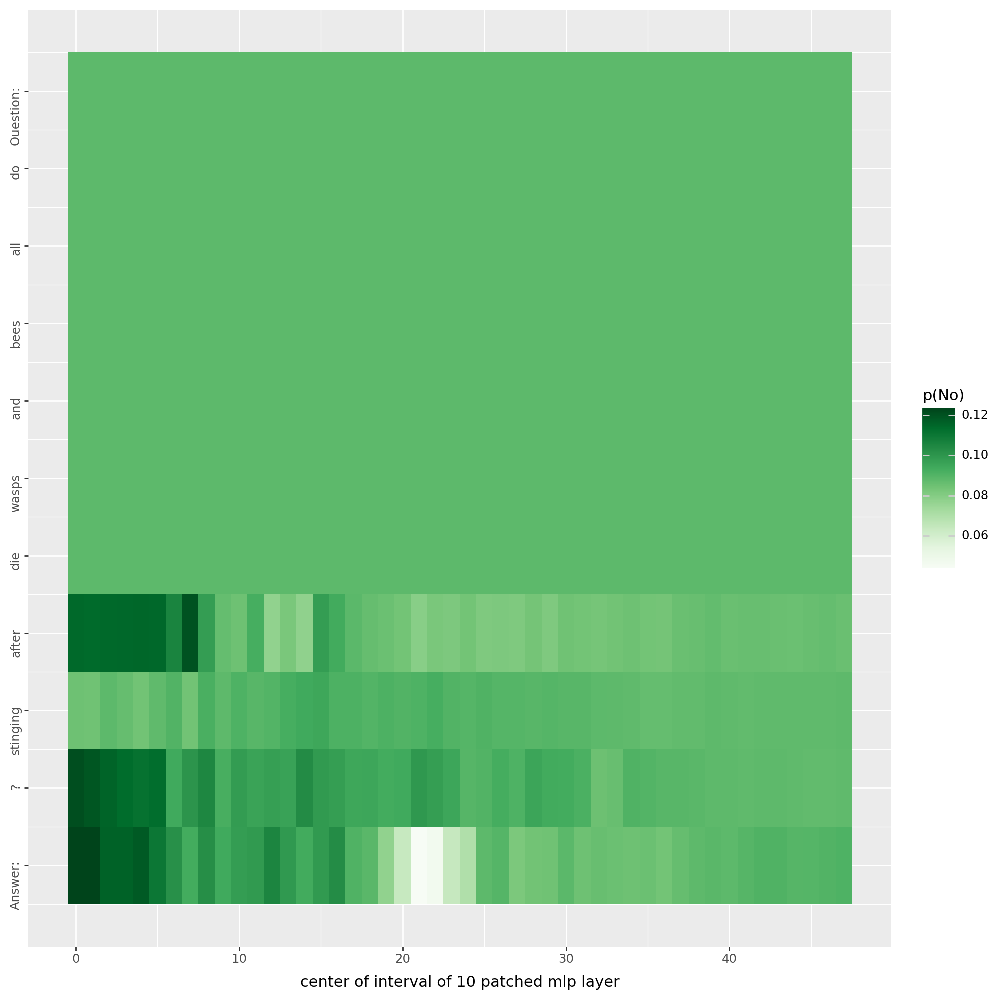

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_22_boolq_gpt2-xl_seed-1_no_attention_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 336 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 336 rows containing missing values.


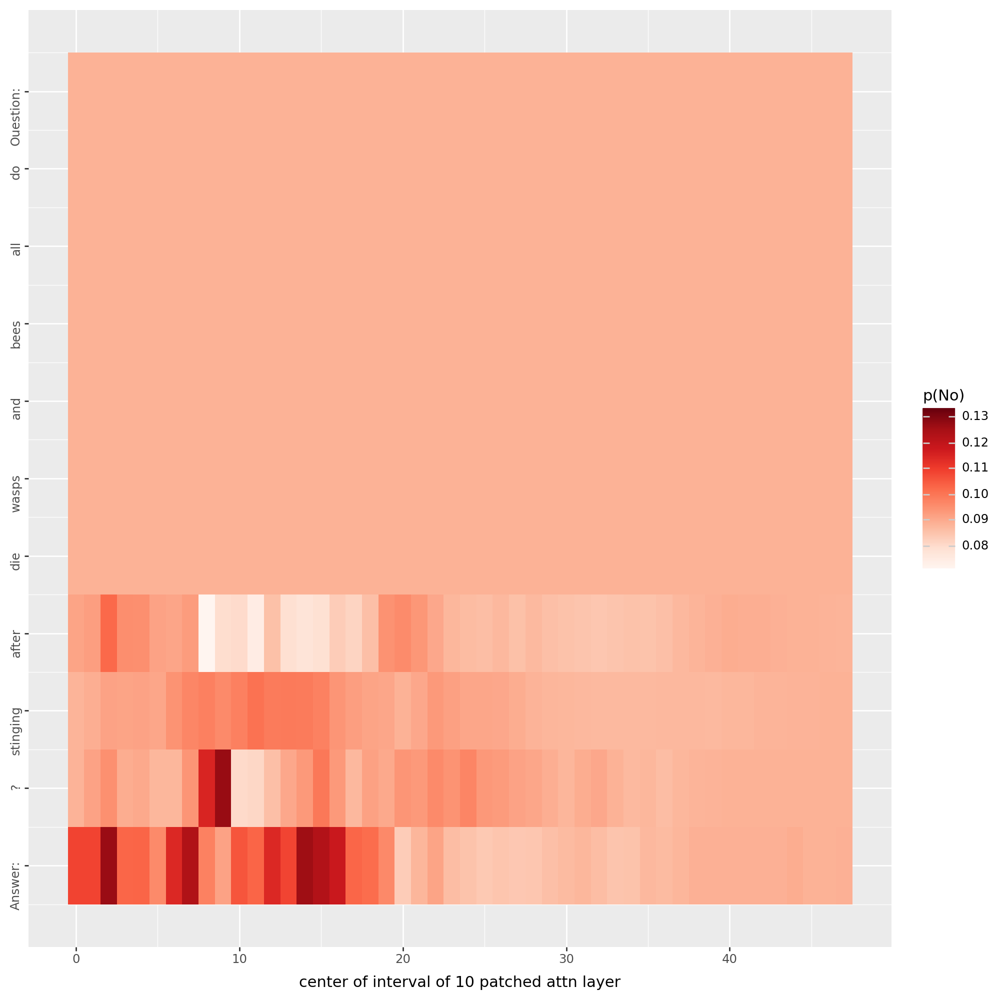

In [ ]:
run(question, unit_locations, models_dict, 2_2)

### Przykład 3

In [17]:
example_3 = ds['train'].select(range(49, 50))
print('QUESTION: {} \nANSWER: {}\nPASSAGE: {}\n'.format(example_3['question'], example_3['answer'], example_3['passage']))

QUESTION: ['is lord of the rings considered an epic'] 
ANSWER: [True]
PASSAGE: ["The Lord of the Rings is an epic high fantasy novel written by English author and scholar J.R.R. Tolkien. The story began as a sequel to Tolkien's 1937 fantasy novel The Hobbit, but eventually developed into a much larger work. Written in stages between 1937 and 1949, The Lord of the Rings is one of the best-selling novels ever written, with over 150 million copies sold."]



In [18]:
tok = tokenizer(example_3['question'], return_tensors='pt').to(device)
tokens = tokenizer.convert_ids_to_tokens(tok['input_ids'][0])
print(tokens)

['is', 'Ġlord', 'Ġof', 'Ġthe', 'Ġrings', 'Ġconsidered', 'Ġan', 'Ġepic']


In [19]:
units_locations = [1, 2, 3, 4]

is lord of the rings considered an epic
Przed zaszumieniem
.                    0.06751323491334915
,                    0.06198051571846008
_quest               0.0471024215221405
_fantasy             0.04195387661457062
_poem                0.033105459064245224
_adventure           0.02733510546386242
_tale                0.026620017364621162
_and                 0.023526864126324654
enter                0.02274322137236595
_of                  0.022398926317691803
Po zaszumieniu
enter                0.11190378665924072
.                    0.04927745461463928
,                    0.03817746043205261
ure                  0.03310692682862282
_of                  0.029766924679279327
_poem                0.0266699381172657
_battle              0.01875278353691101
_and                 0.014859522692859173
ent                  0.01453049574047327
_in                  0.013558934442698956
['is', 'lord', 'of', 'the', 'rings', 'considered', 'an', 'epic']


100%|██████████| 48/48 [02:26<00:00,  3.06s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_3_gpt2-xl_yes_block_output.pdf


[0, 1, 2, 3, 4, 5, 6, 7]


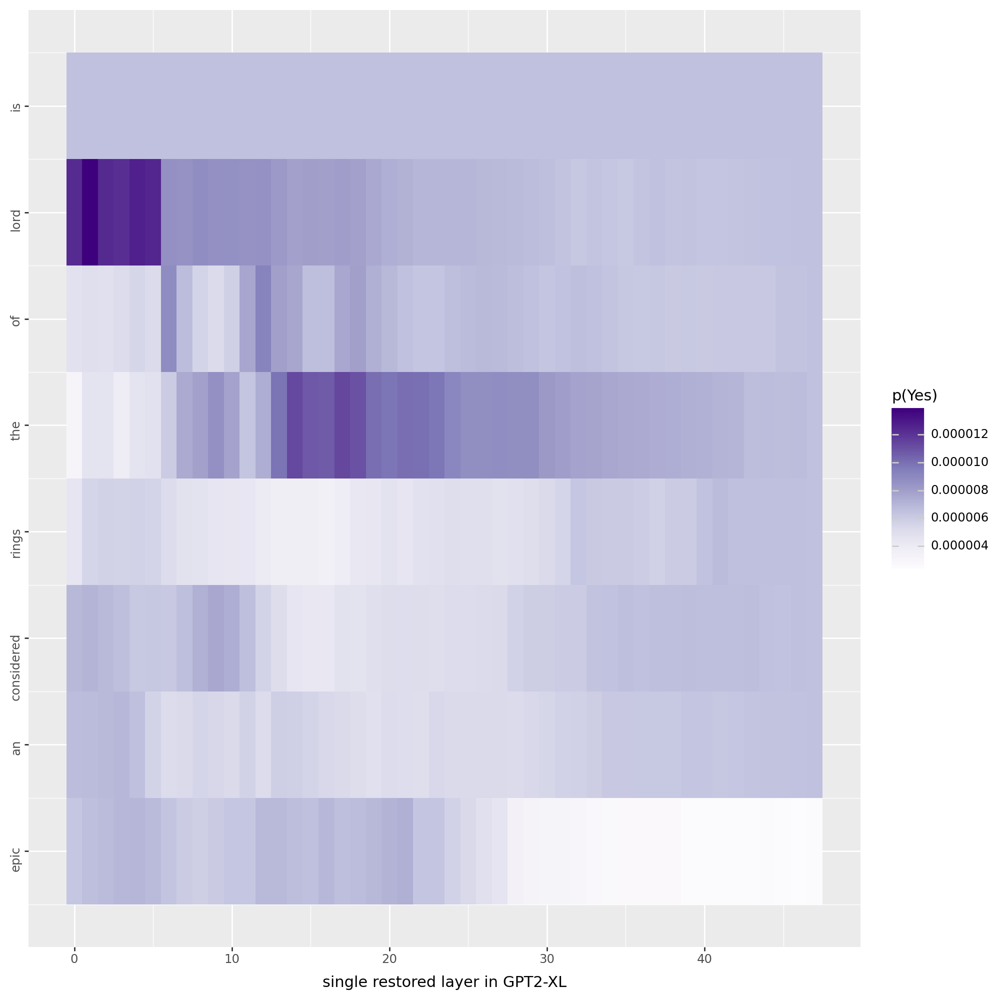

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_3_gpt2-xl_yes_mlp_activation.pdf


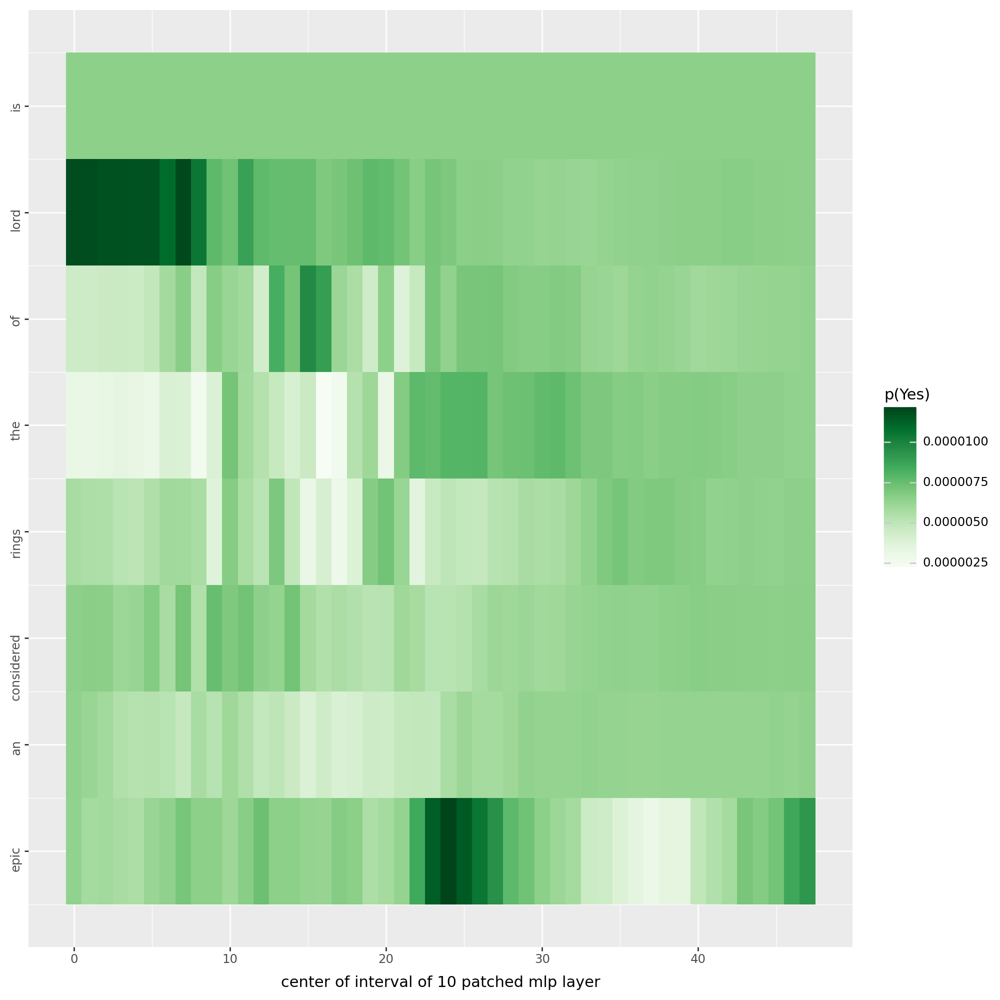

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_3_gpt2-xl_yes_attention_output.pdf


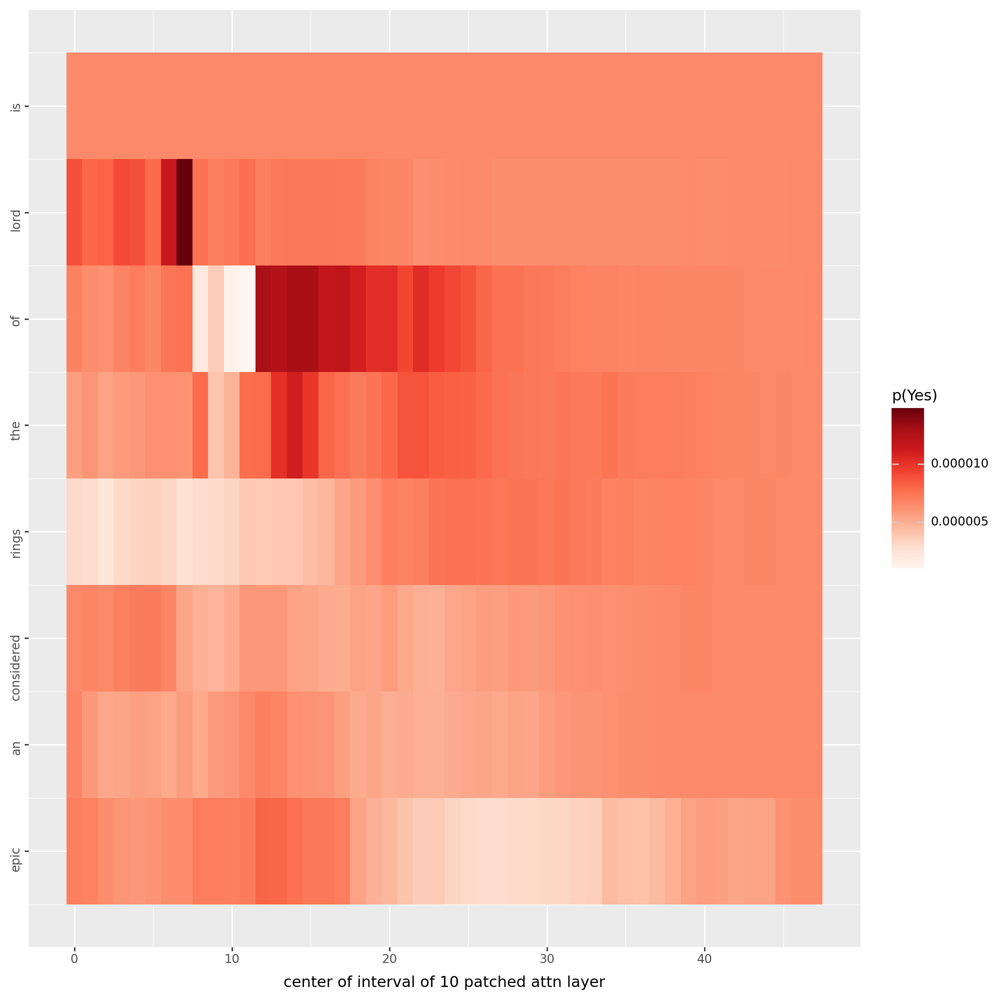

100%|██████████| 48/48 [02:26<00:00,  3.06s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_3_gpt2-xl_no_block_output.pdf


[0, 1, 2, 3, 4, 5, 6, 7]


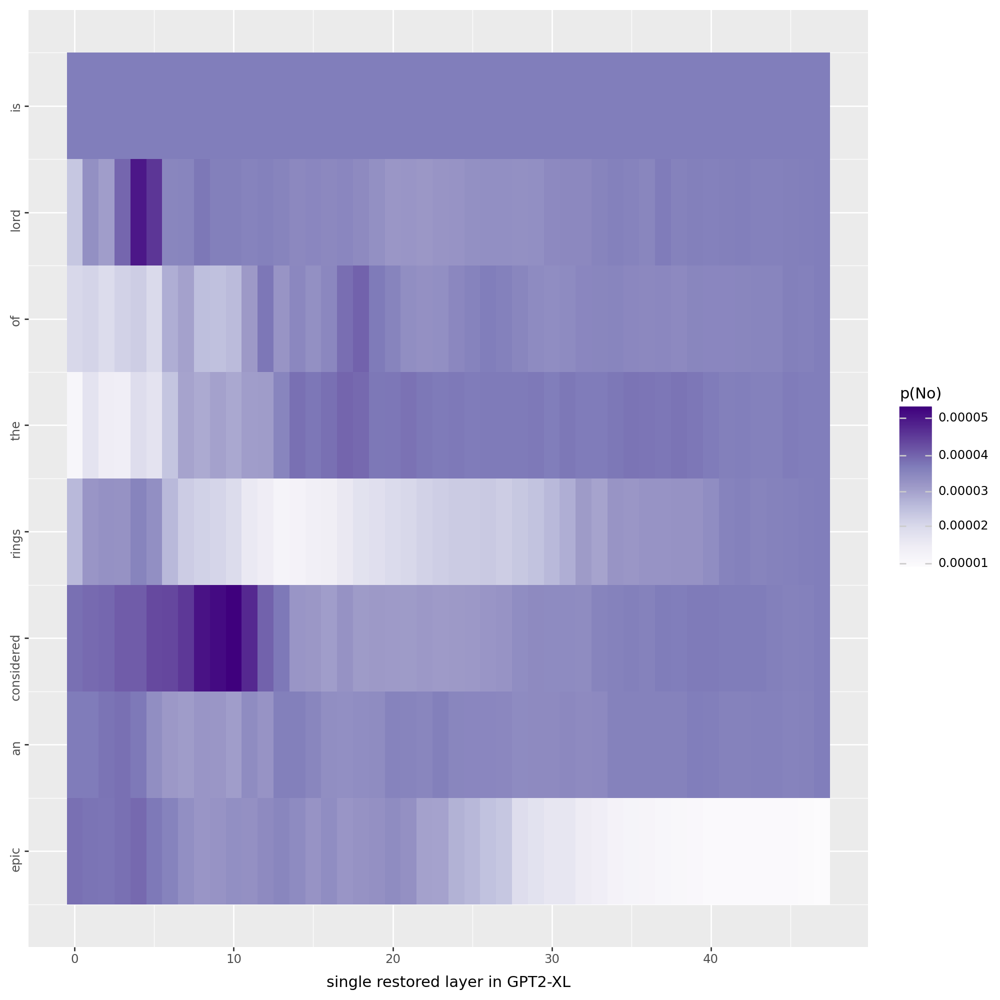

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_3_gpt2-xl_no_mlp_activation.pdf


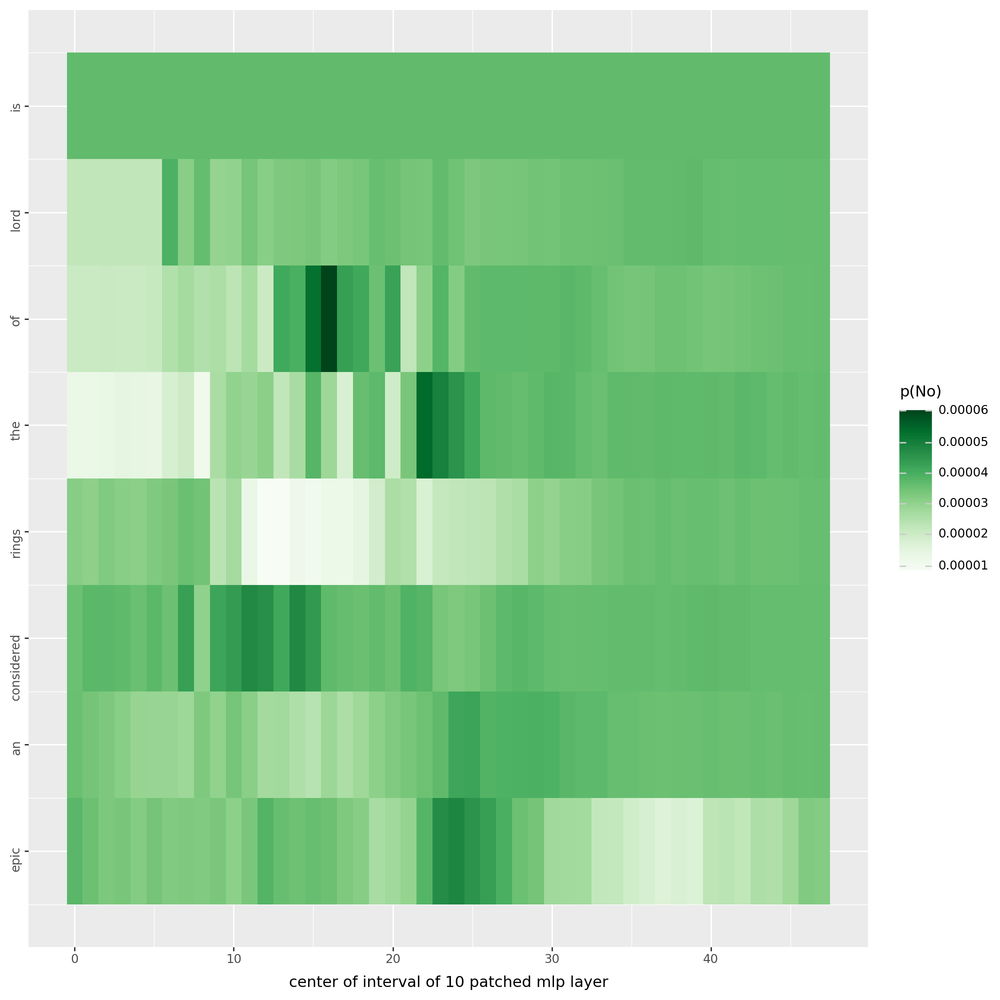

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_3_gpt2-xl_no_attention_output.pdf


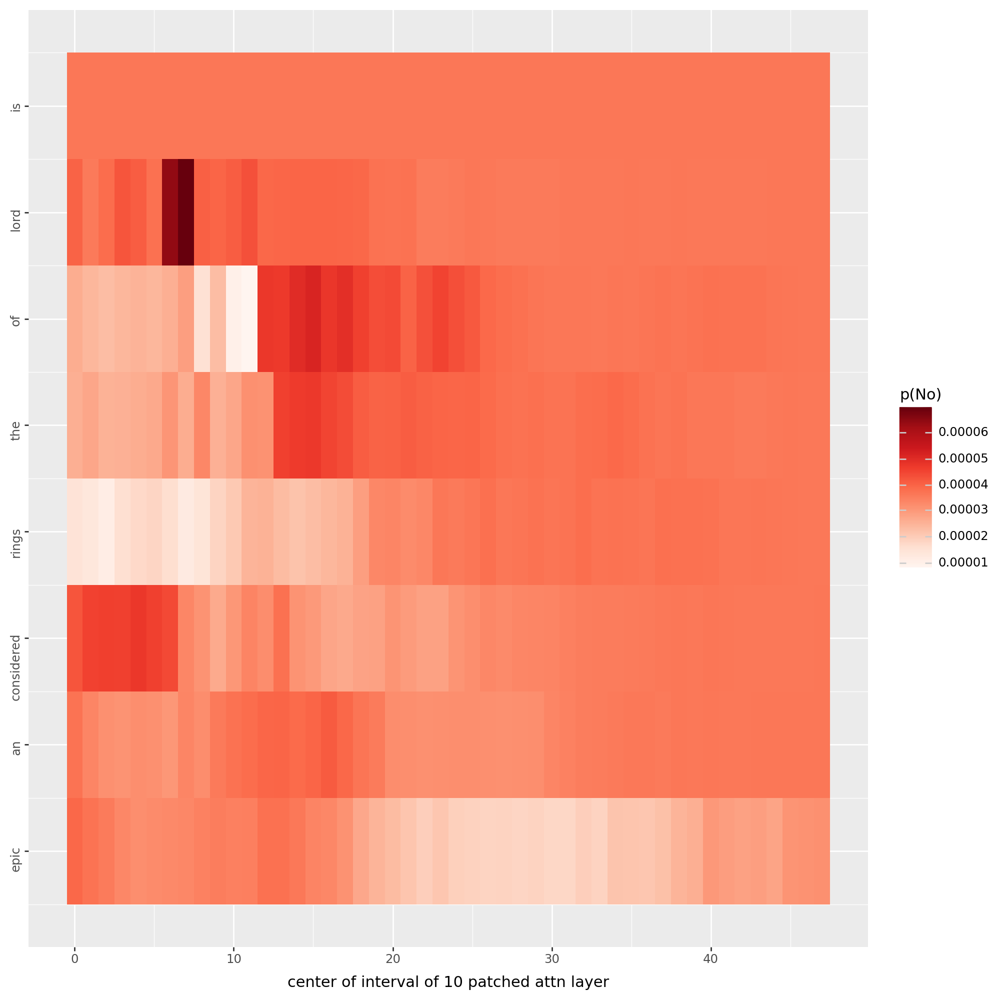

is lord of the rings considered an epic
Przed zaszumieniem
?                    0.3885519802570343
,                    0.06659720838069916
_film                0.06194779649376869
_story               0.04875721037387848
_novel               0.045864395797252655
_or                  0.03984133154153824
_fantasy             0.037367016077041626
_poem                0.035642463713884354
_movie               0.027813468128442764
_by                  0.016273628920316696
Po zaszumieniu
?                    0.652490496635437
,                    0.05351955071091652
_moment              0.025514530017971992
_poem                0.009789164178073406
_and                 0.009564805775880814
_or                  0.00946895033121109
.                    0.008150214329361916
_in                  0.006133773364126682
_story               0.006038879510015249
_rather              0.005686500575393438
['is', 'lord', 'of', 'the', 'rings', 'considered', 'an', 'epic']


100%|██████████| 48/48 [02:27<00:00,  3.07s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_3_boolq_gpt2-xl_seed-1_yes_block_output.pdf


[0, 1, 2, 3, 4, 5, 6, 7]


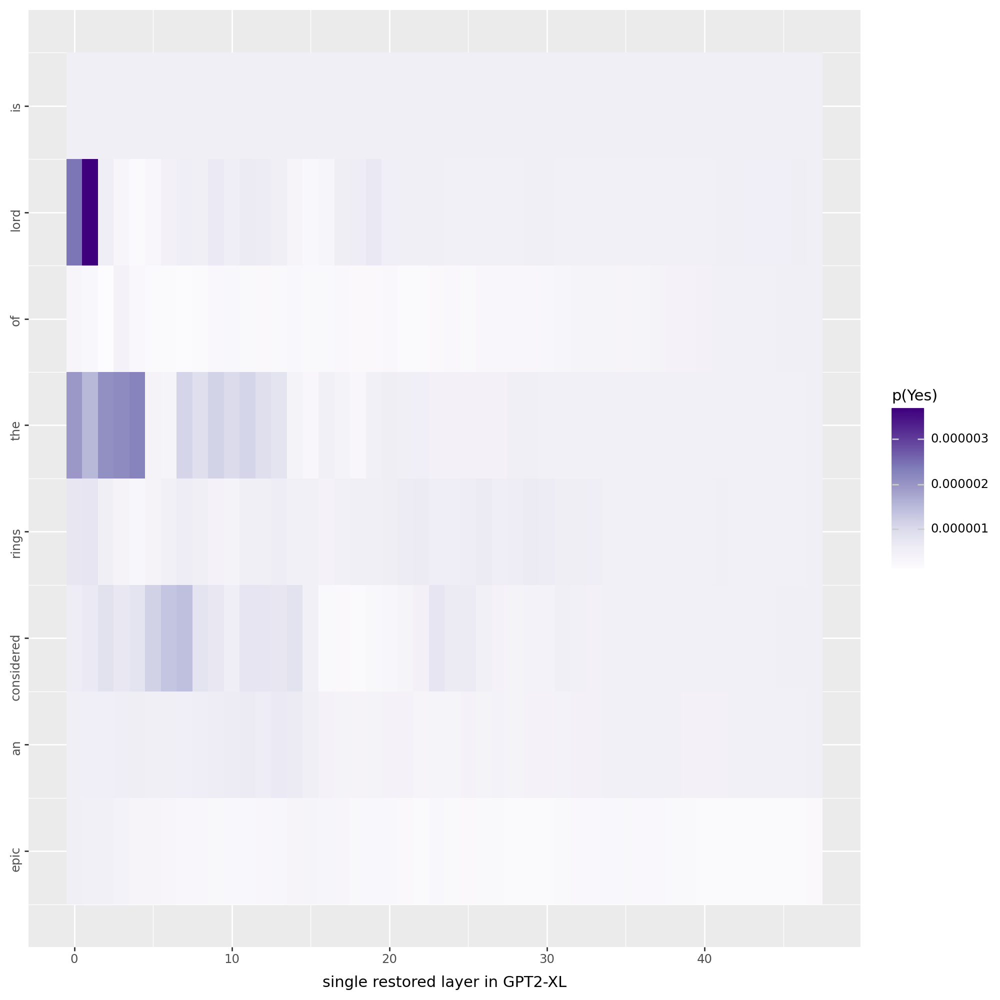

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_3_boolq_gpt2-xl_seed-1_yes_mlp_activation.pdf


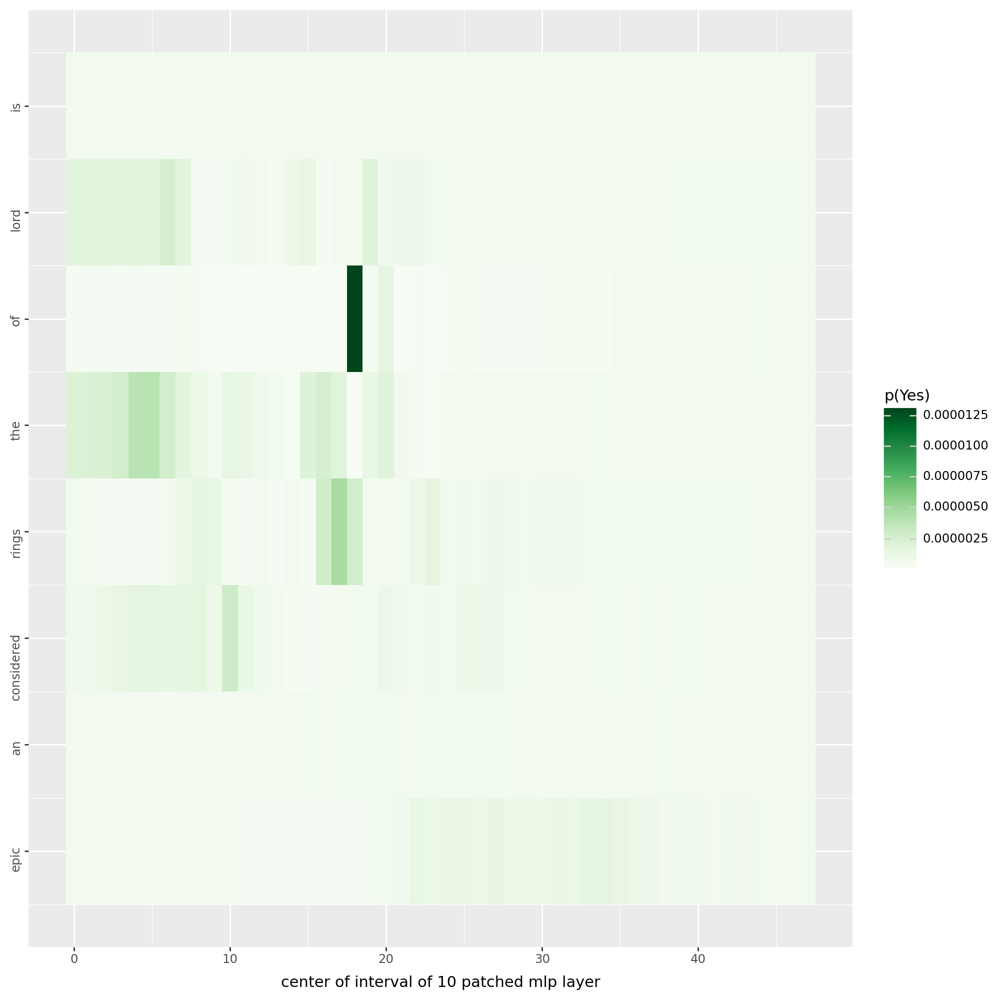

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_3_boolq_gpt2-xl_seed-1_yes_attention_output.pdf


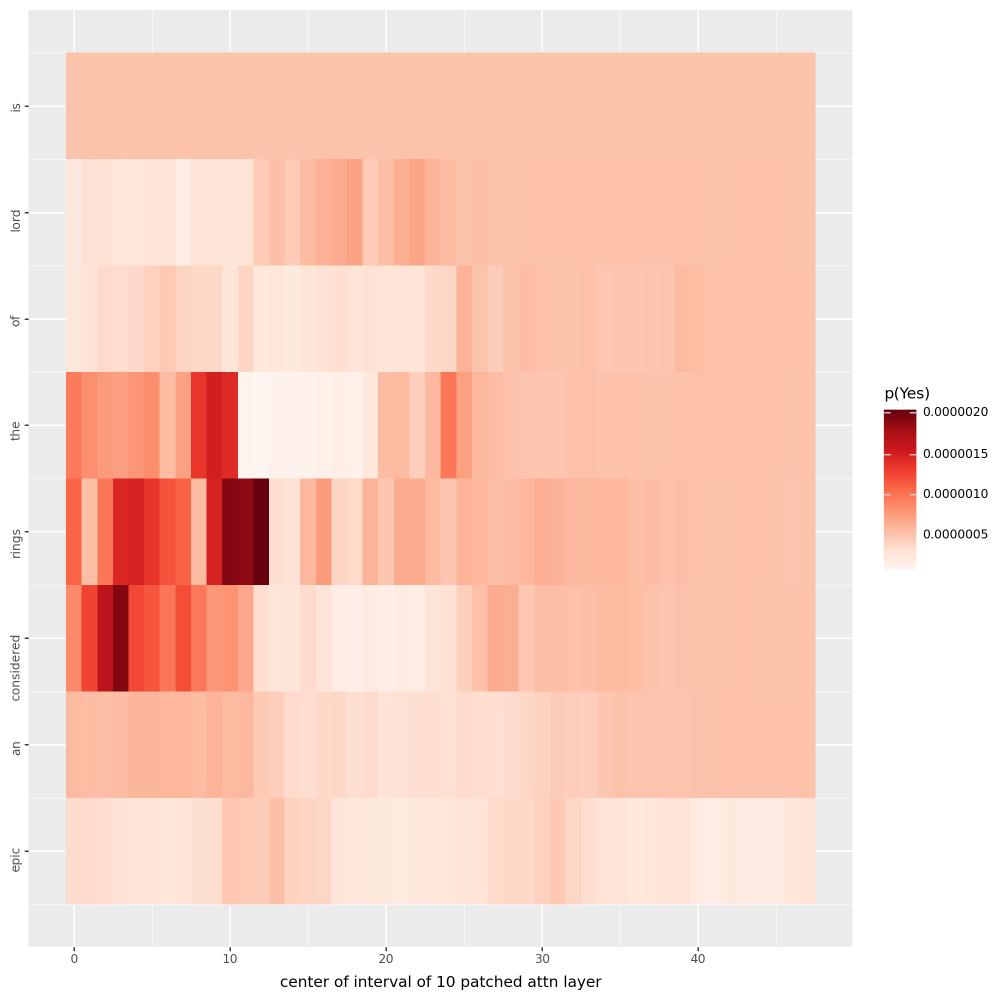

100%|██████████| 48/48 [02:26<00:00,  3.05s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_3_boolq_gpt2-xl_seed-1_no_block_output.pdf


[0, 1, 2, 3, 4, 5, 6, 7]


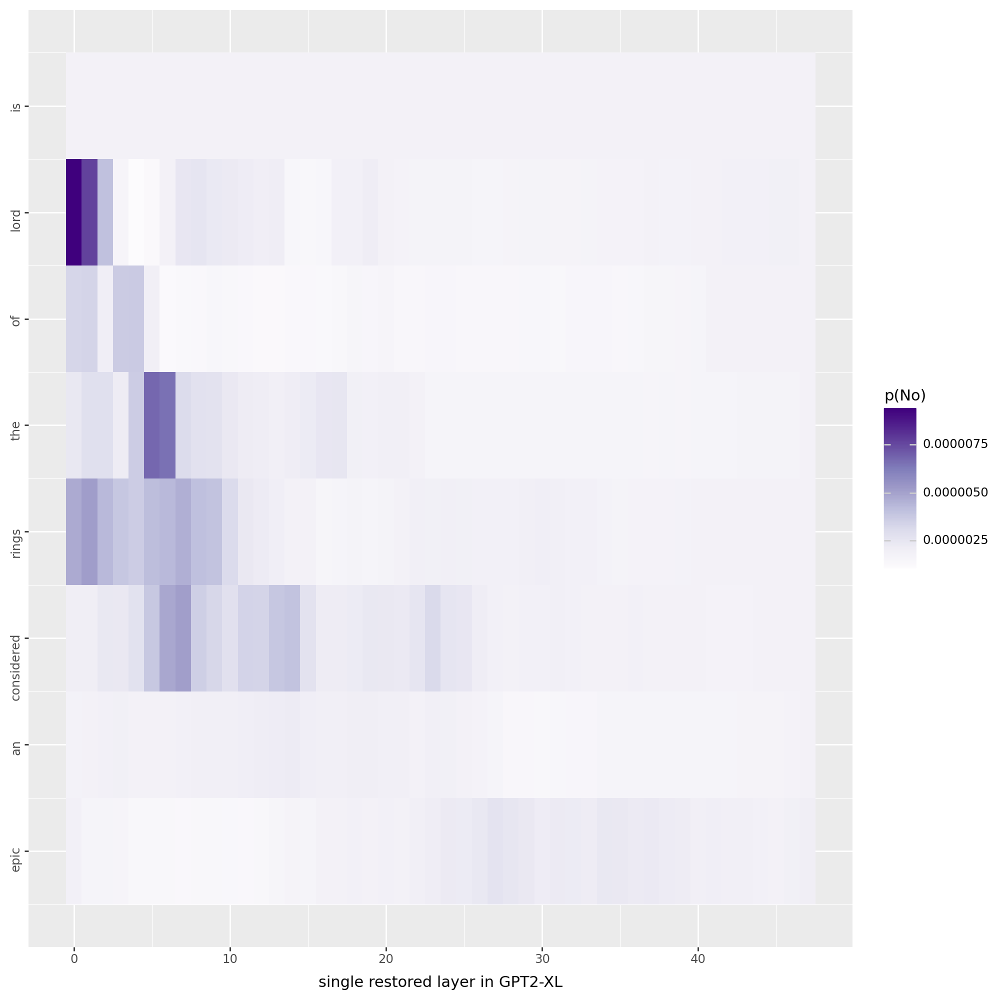

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_3_boolq_gpt2-xl_seed-1_no_mlp_activation.pdf


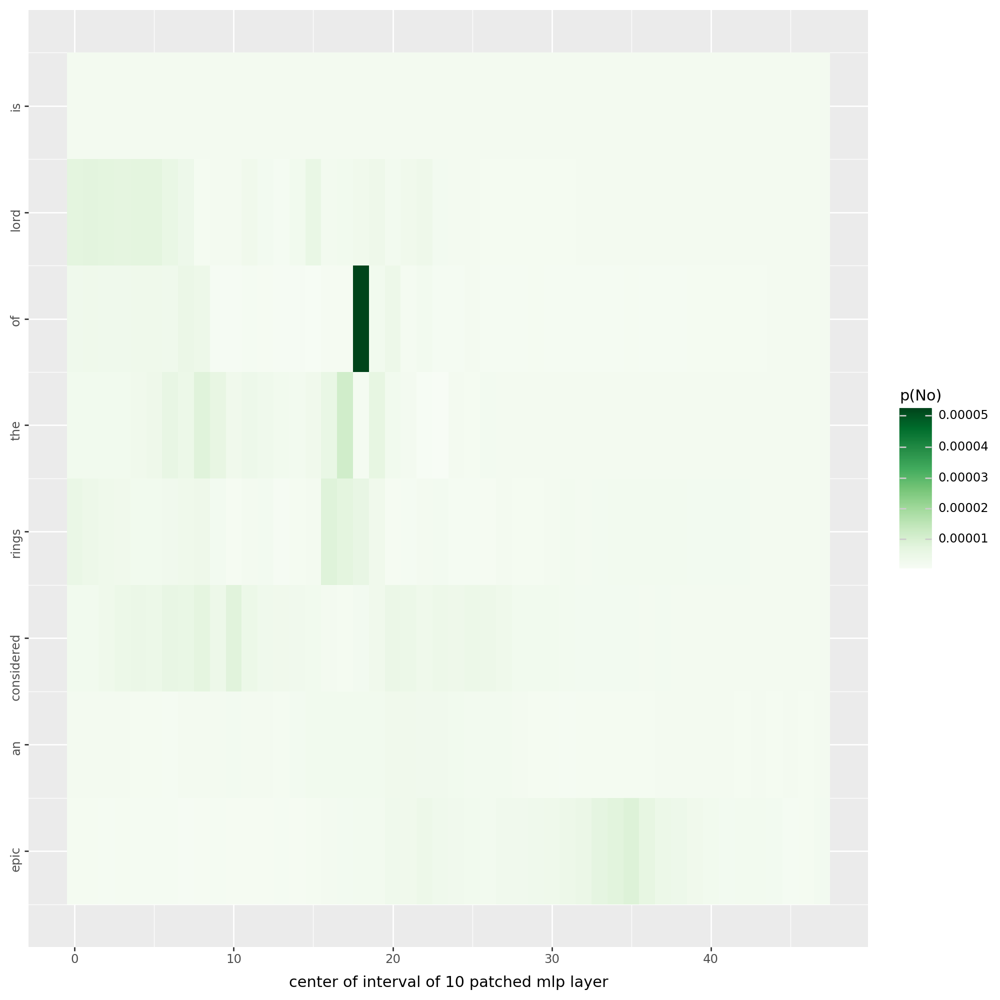

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_3_boolq_gpt2-xl_seed-1_no_attention_output.pdf


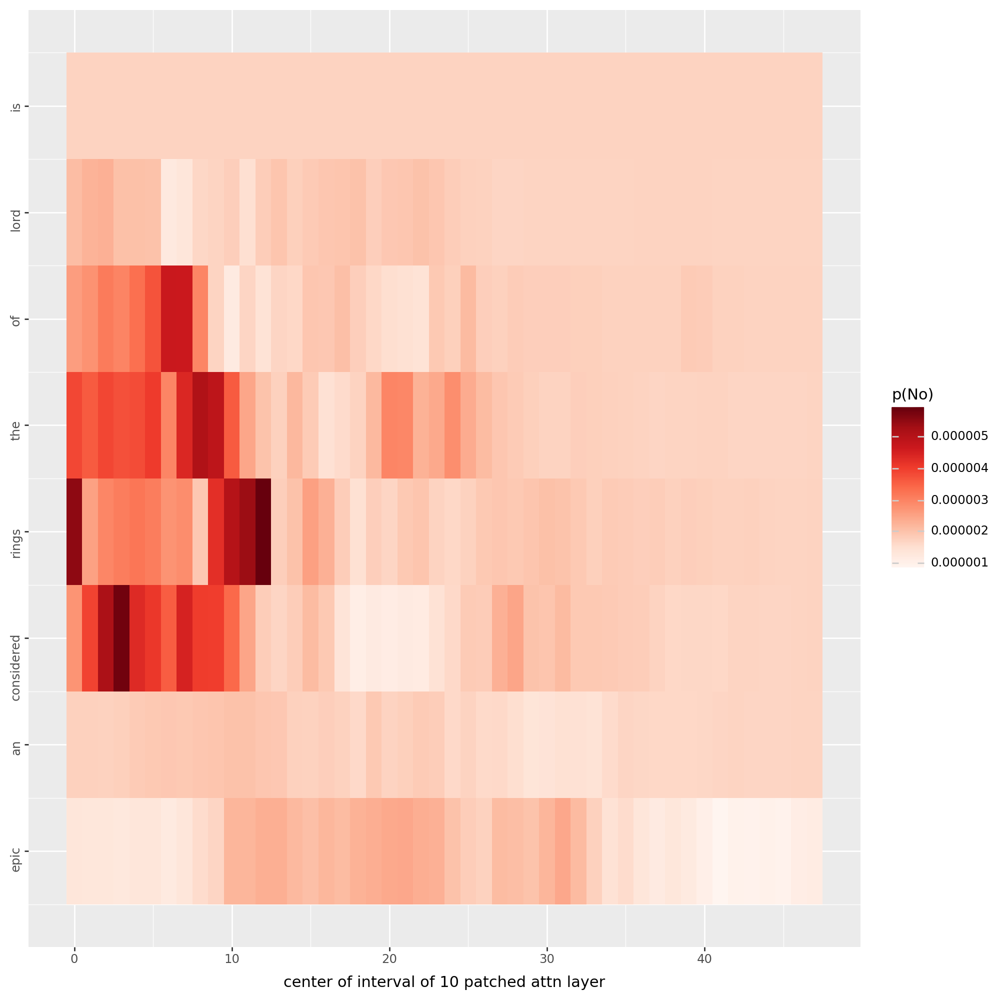

In [20]:
run(example_3['question'][0], units_locations, models_dict, 3)

In [38]:
question = 'Ouestion: ' + example_3['question'][0] + ' ?' + ' Answer:'
tok = tokenizer(question, return_tensors='pt').to(device)
tokens = tokenizer.convert_ids_to_tokens(tok['input_ids'][0])
print(tokens)

['O', 'u', 'est', 'ion', ':', 'Ġis', 'Ġlord', 'Ġof', 'Ġthe', 'Ġrings', 'Ġconsidered', 'Ġan', 'Ġepic', 'Ġ?', 'ĠAnswer', ':']


In [39]:
unit_locations = [6, 7, 8, 9]

Ouestion: is lord of the rings considered an epic ? Answer:
Przed zaszumieniem
_yes                 0.11431757360696793
_no                  0.08282338082790375
_Yes                 0.06914900988340378
_No                  0.05739205330610275
_it                  0.04522661119699478
_It                  0.04250152409076691
\n                   0.042113181203603745
_I                   0.021529080346226692
_The                 0.020654290914535522
_not                 0.020632263273000717
Po zaszumieniu
_Yes                 0.12103579938411713
_yes                 0.05661840736865997
_The                 0.03849921002984047
_No                  0.034578148275613785
\n                   0.027824418619275093
_A                   0.02275095507502556
_It                  0.02203189581632614
_the                 0.016348950564861298
_a                   0.01617567241191864
_no                  0.015834858641028404
['Ouestion:', 'is', 'lord', 'of', 'the', 'rings', 'considered', 'an', 'epic', 

100%|██████████| 48/48 [05:27<00:00,  6.82s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_3_gpt2-xl_yes_block_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.


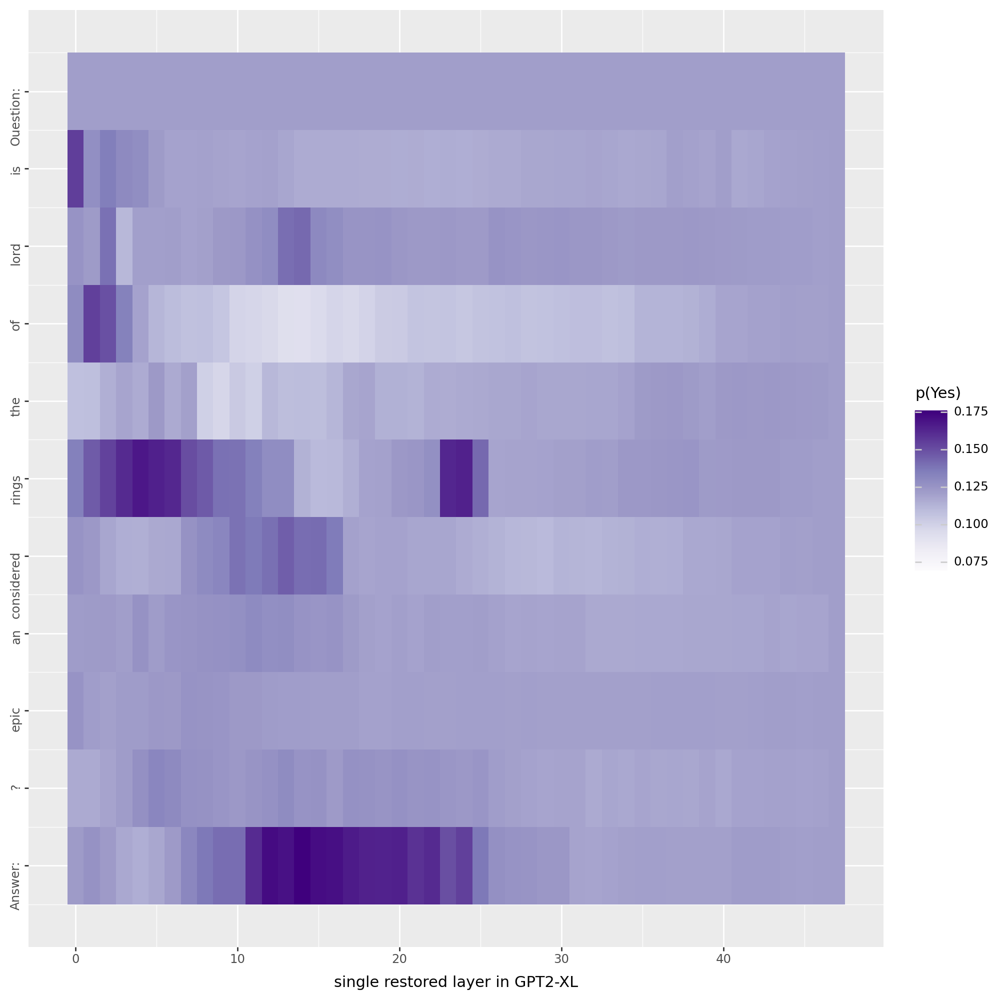

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_3_gpt2-xl_yes_mlp_activation.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.


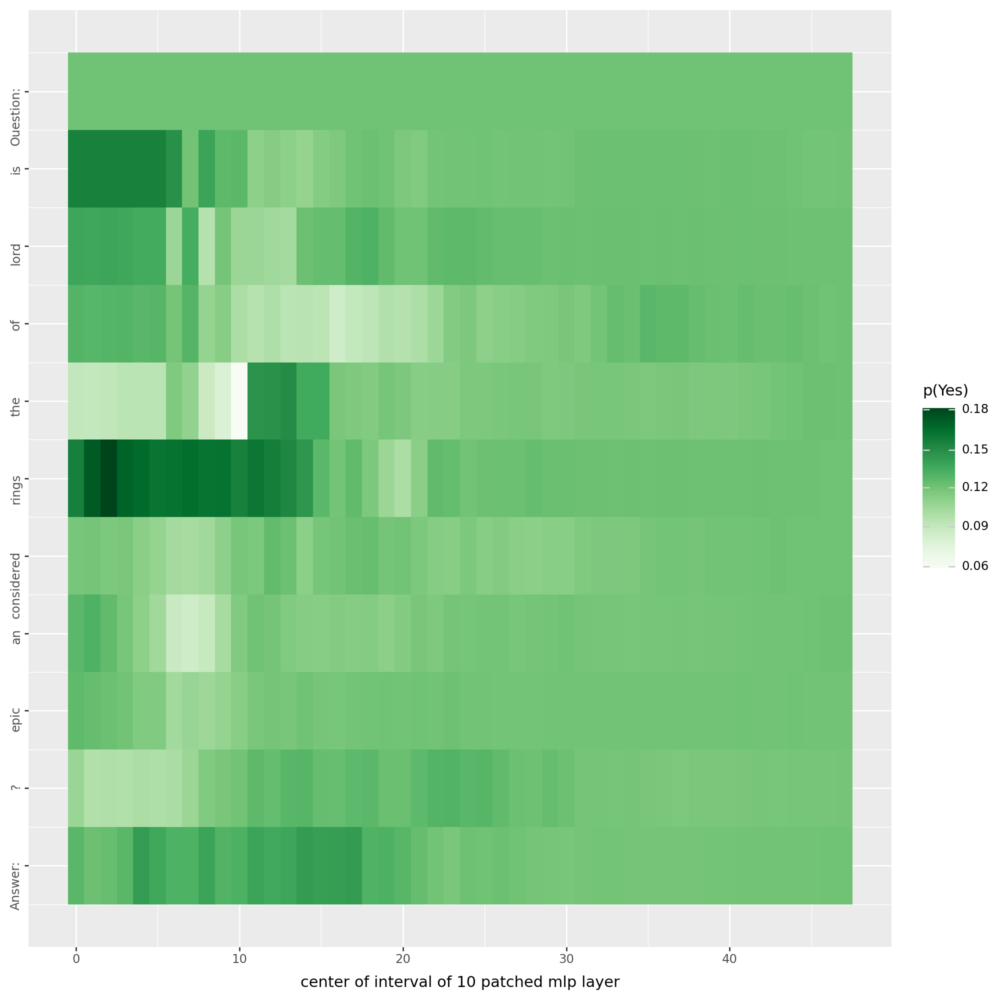

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_3_gpt2-xl_yes_attention_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.


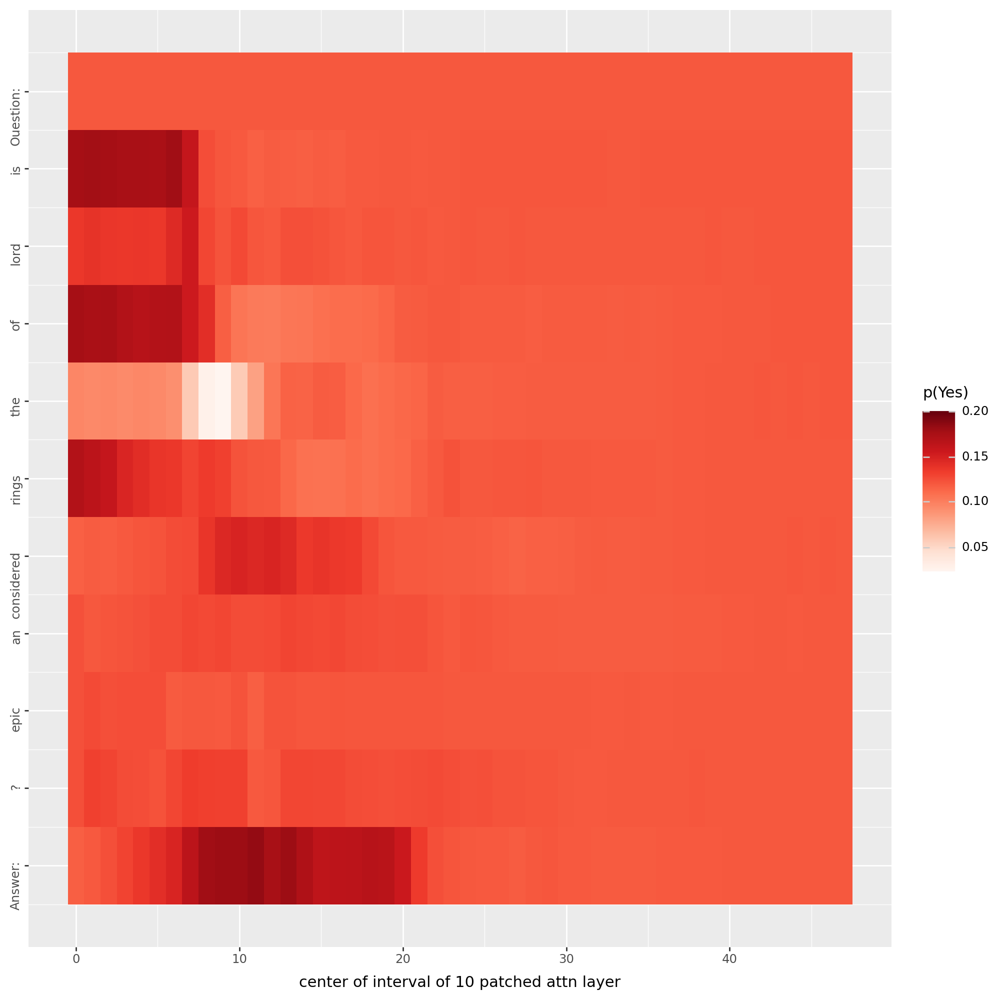

100%|██████████| 48/48 [05:26<00:00,  6.80s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_3_gpt2-xl_no_block_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.


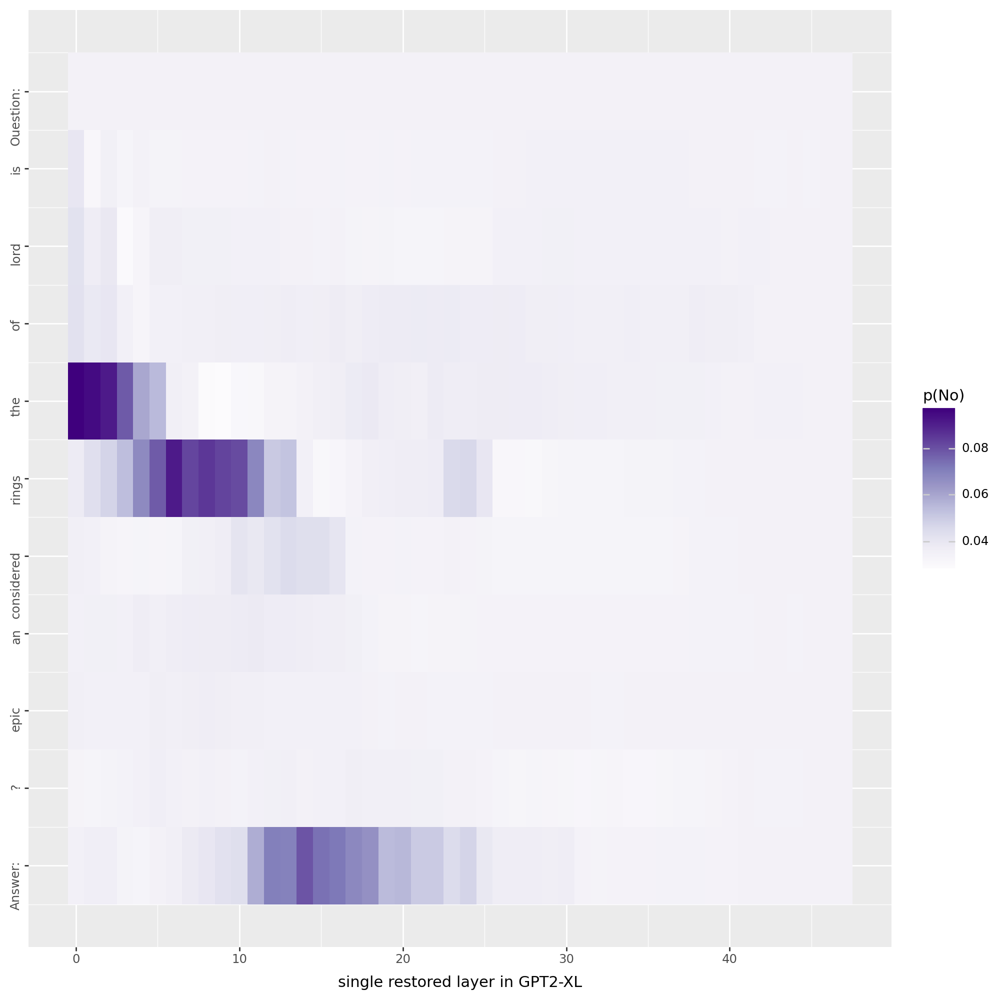

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_3_gpt2-xl_no_mlp_activation.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.


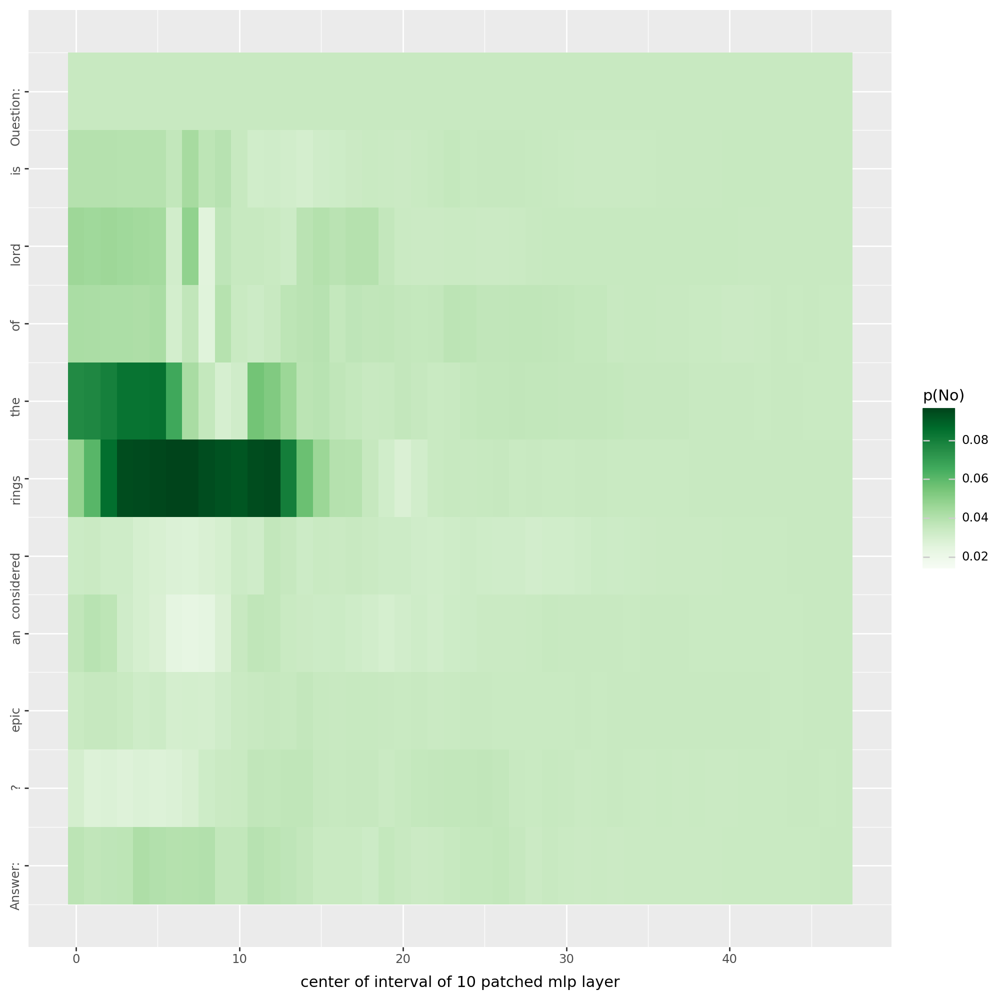

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_3_gpt2-xl_no_attention_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.


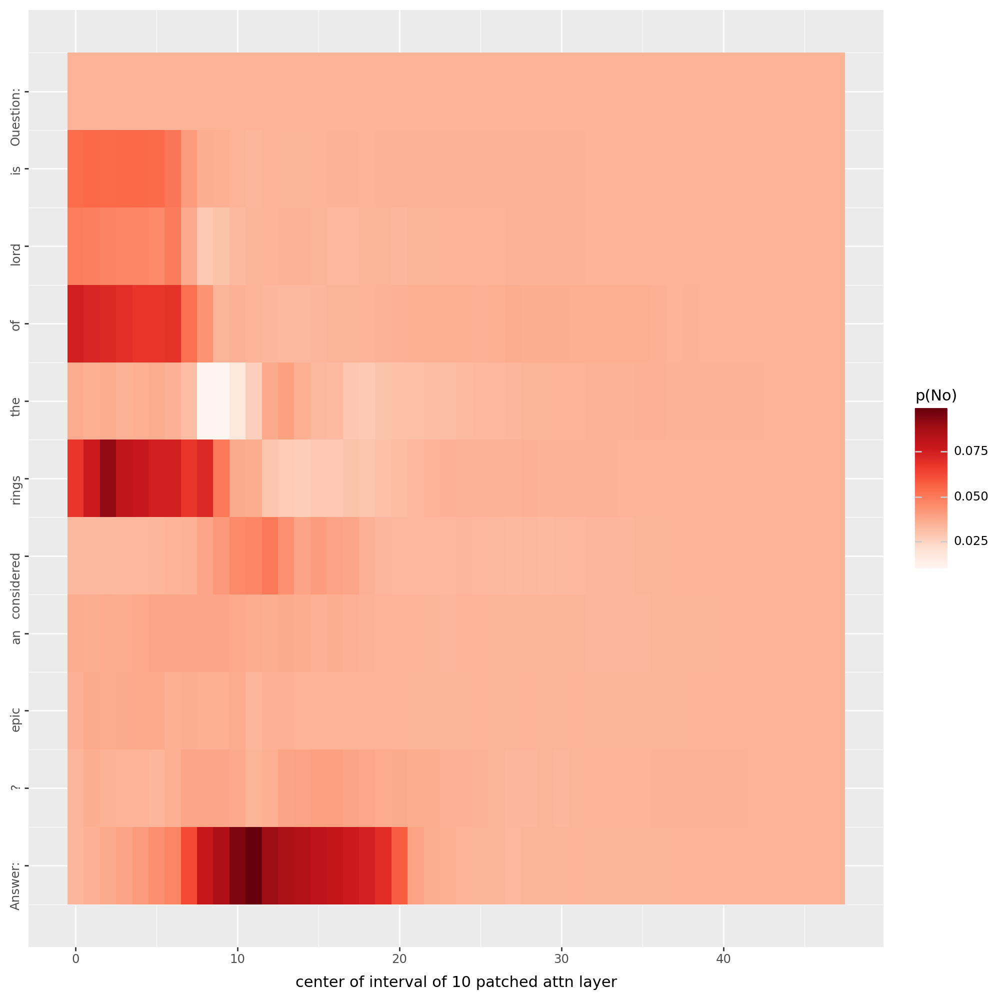

Ouestion: is lord of the rings considered an epic ? Answer:
Przed zaszumieniem
_yes                 0.3648625612258911
_no                  0.15195439755916595
_Yes                 0.08922533690929413
_No                  0.04232273995876312
_not                 0.02624441310763359
\n                   0.02623017504811287
_it                  0.019359057769179344
_I                   0.017199954017996788
_the                 0.008589542470872402
_It                  0.008543776348233223
Po zaszumieniu
_no                  0.1419718712568283
_No                  0.13247337937355042
_Yes                 0.11597002297639847
_yes                 0.09272312372922897
_not                 0.05149152874946594
_n                   0.05135049298405647
_Nope                0.05102323740720749
_it                  0.030122216790914536
_NO                  0.022910969331860542
_It                  0.022251054644584656
['Ouestion:', 'is', 'lord', 'of', 'the', 'rings', 'considered', 'an', 'epic', '?'

100%|██████████| 48/48 [05:27<00:00,  6.82s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_3_boolq_gpt2-xl_seed-1_yes_block_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.


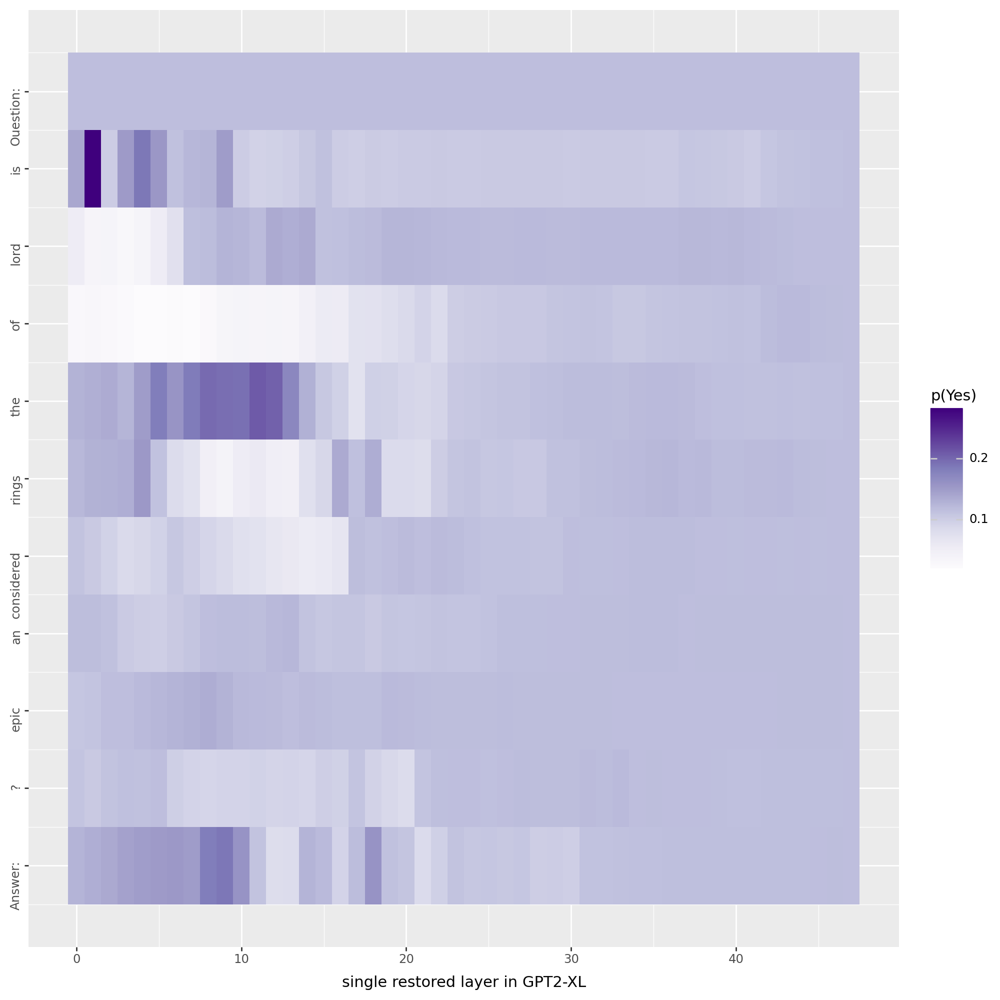

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_3_boolq_gpt2-xl_seed-1_yes_mlp_activation.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.


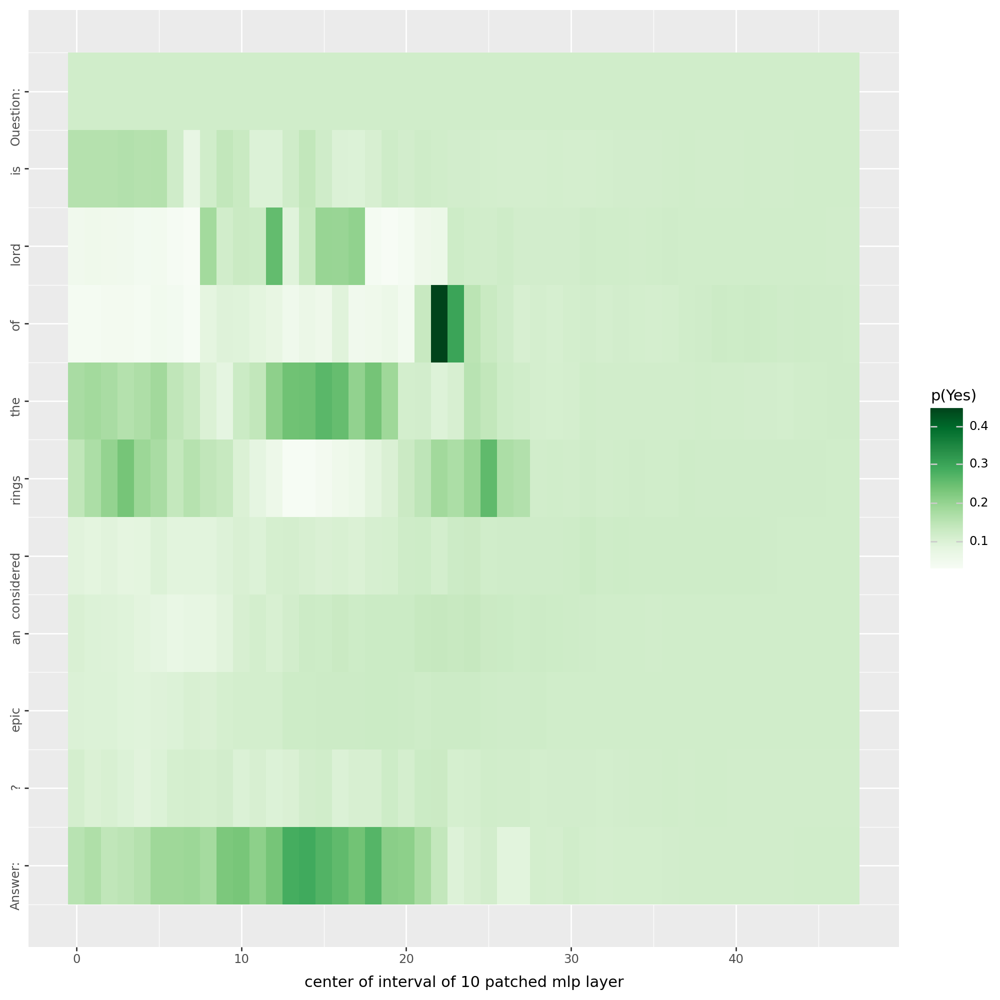

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_3_boolq_gpt2-xl_seed-1_yes_attention_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.


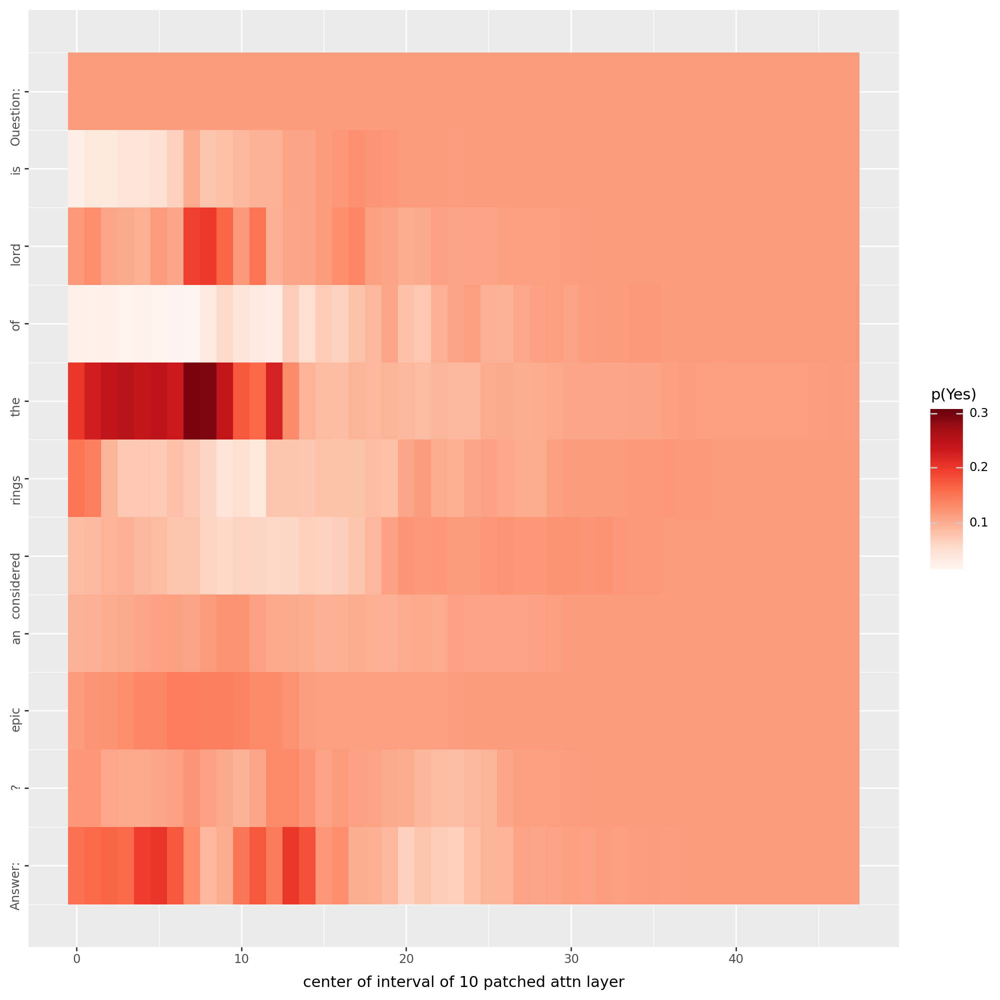

100%|██████████| 48/48 [05:26<00:00,  6.80s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_3_boolq_gpt2-xl_seed-1_no_block_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.


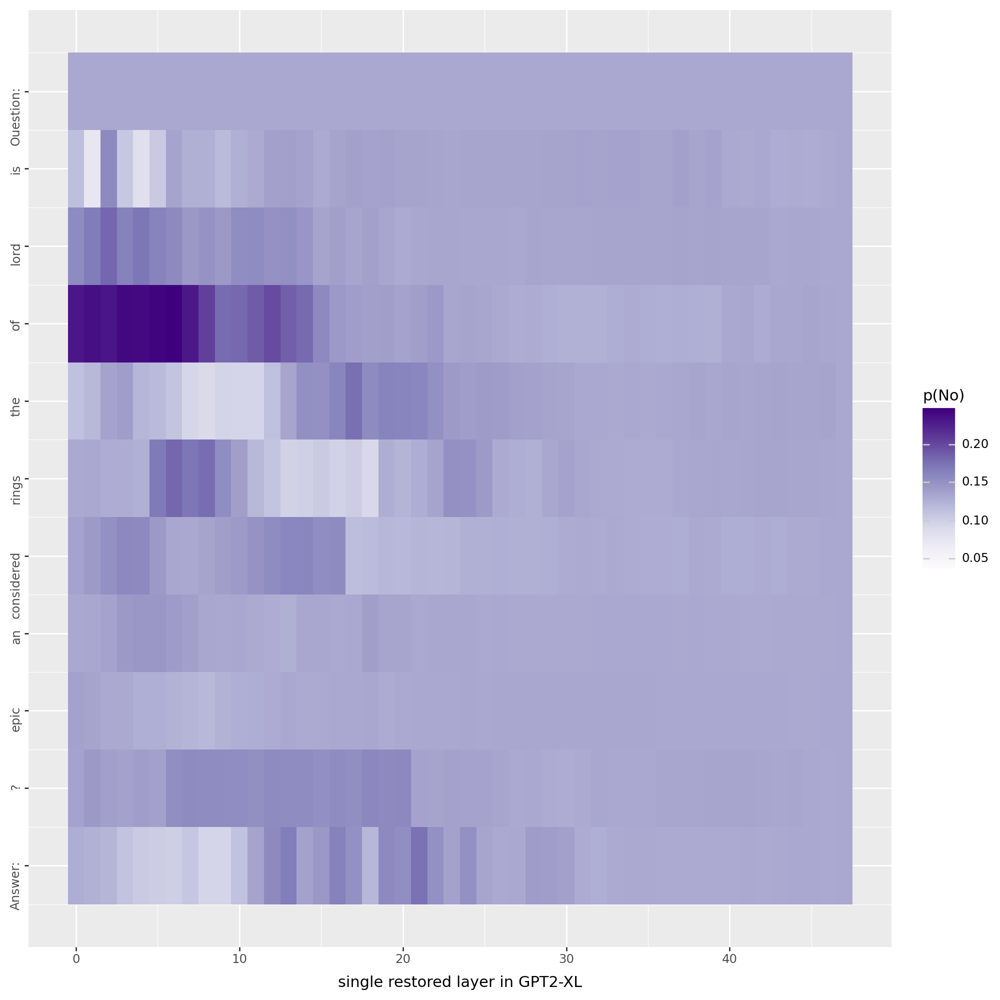

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_3_boolq_gpt2-xl_seed-1_no_mlp_activation.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.


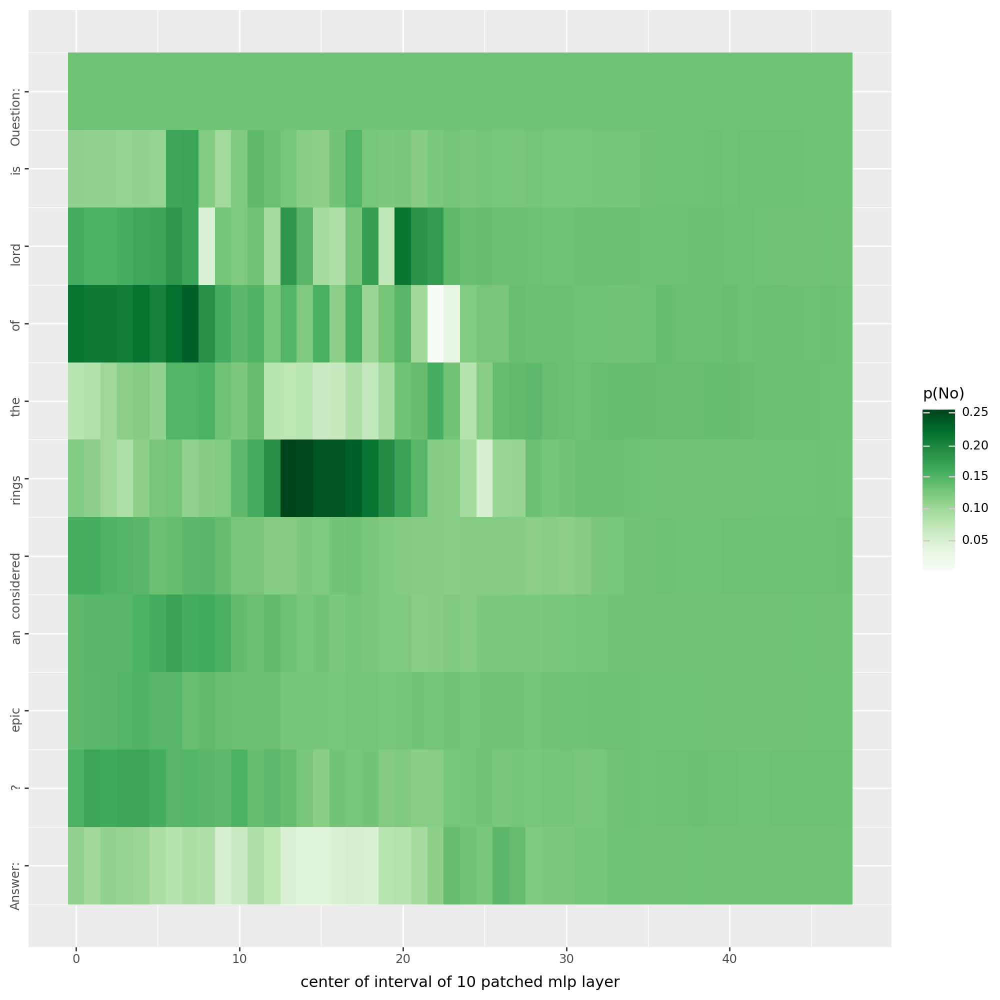

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_3_boolq_gpt2-xl_seed-1_no_attention_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 240 rows containing missing values.


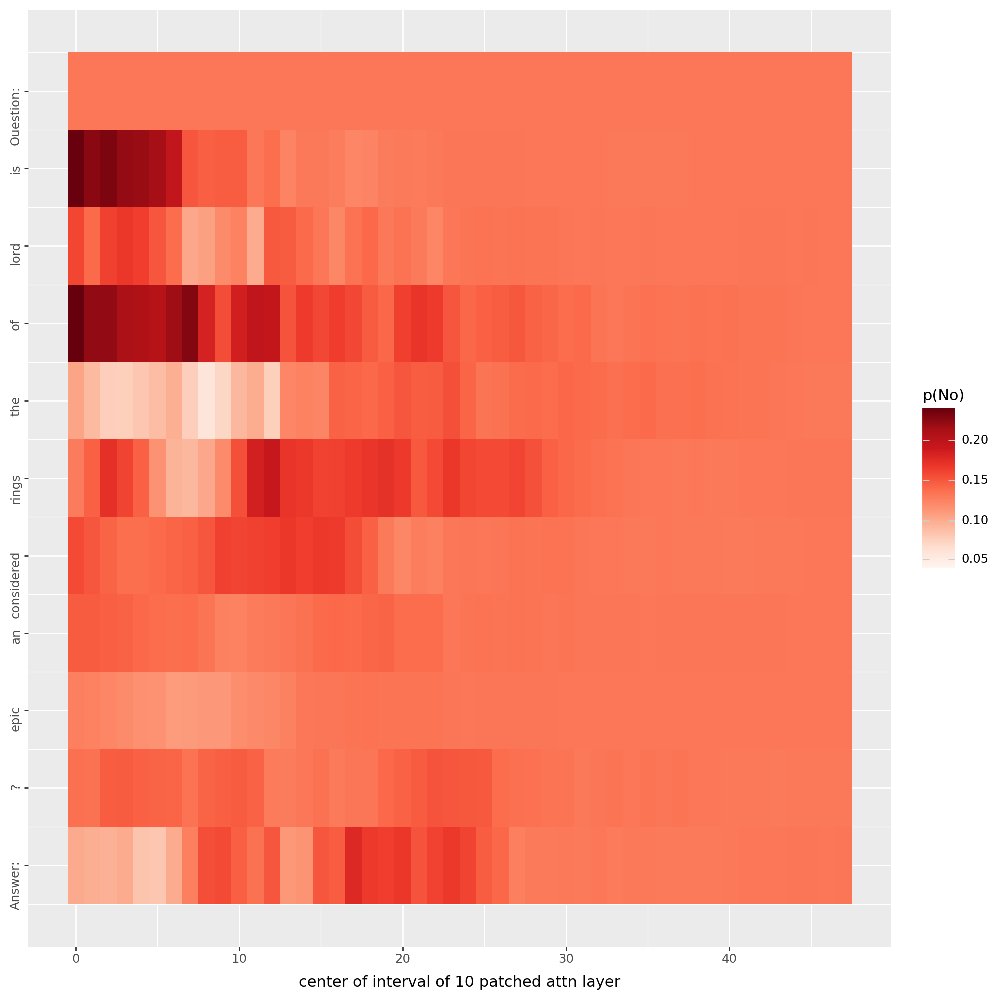

In [40]:
run(question, units_locations, models_dict, 3)

### Przykład 4

In [21]:
example_4 = ds['train'].select(range(5665, 5666))
print('QUESTION: {} \nANSWER: {}\nPASSAGE: {}\n'.format(example_4['question'], example_4['answer'], example_4['passage']))

QUESTION: ['article 1 of the constitution describes the powers of the president'] 
ANSWER: [False]
PASSAGE: ['Article One of the United States Constitution establishes the legislative branch of the federal government, the United States Congress. The Congress is a bicameral legislature consisting of a House of Representatives and a Senate.']



In [22]:
tok = tokenizer(example_4['question'], return_tensors='pt').to(device)
tokens = tokenizer.convert_ids_to_tokens(tok['input_ids'][0])
print(tokens)

['article', 'Ġ1', 'Ġof', 'Ġthe', 'Ġconstitution', 'Ġdescribes', 'Ġthe', 'Ġpowers', 'Ġof', 'Ġthe', 'Ġpresident']


In [23]:
unit_locations = [0, 1, 2, 3, 4]

article 1 of the constitution describes the powers of the president
Przed zaszumieniem
.                    0.20681768655776978
,                    0.1960853785276413
_and                 0.1777999997138977
_as                  0.08483362197875977
:                    0.08157070726156235
_of                  0.04906236007809639
_in                  0.048136357218027115
_to                  0.024673892185091972
_under               0.015481621026992798
_"                   0.013013391755521297
Po zaszumieniu
_and                 0.15483149886131287
_as                  0.1495169997215271
_in                  0.12146003544330597
,                    0.11862979829311371
.                    0.0715578943490982
_under               0.06700717657804489
_to                  0.06159975007176399
_of                  0.045084238052368164
_with                0.02516668289899826
:                    0.01640443317592144
['article', '1', 'of', 'the', 'constitution', 'describes', 'the', 'powers', '

100%|██████████| 48/48 [03:42<00:00,  4.63s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_4_gpt2-xl_yes_block_output.pdf


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


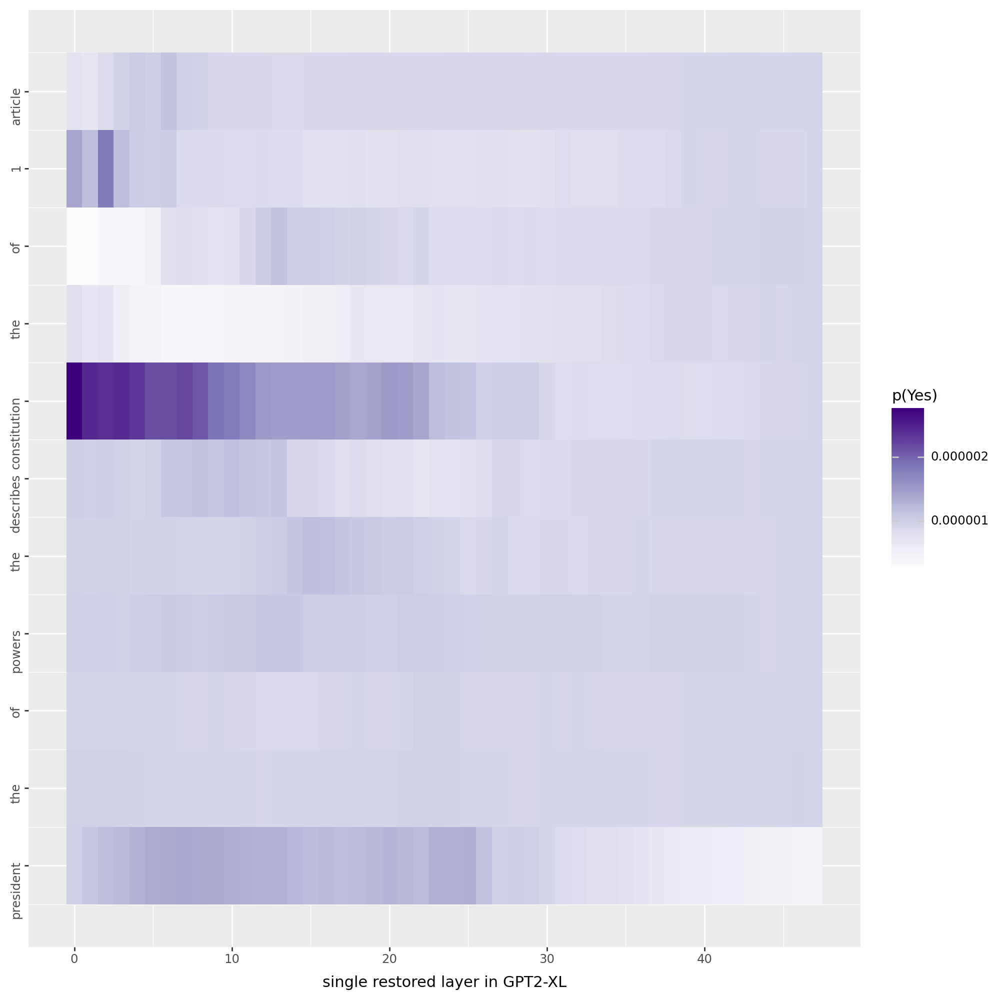

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_4_gpt2-xl_yes_mlp_activation.pdf


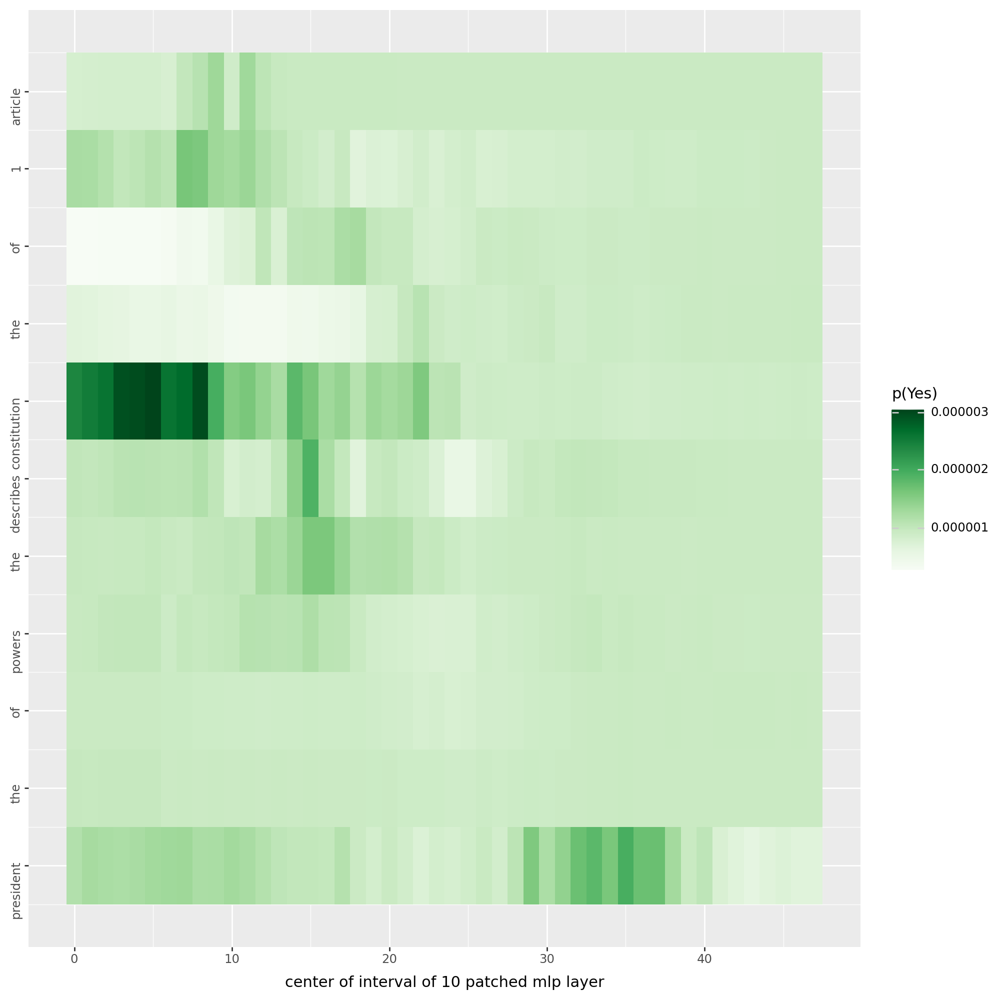

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_4_gpt2-xl_yes_attention_output.pdf


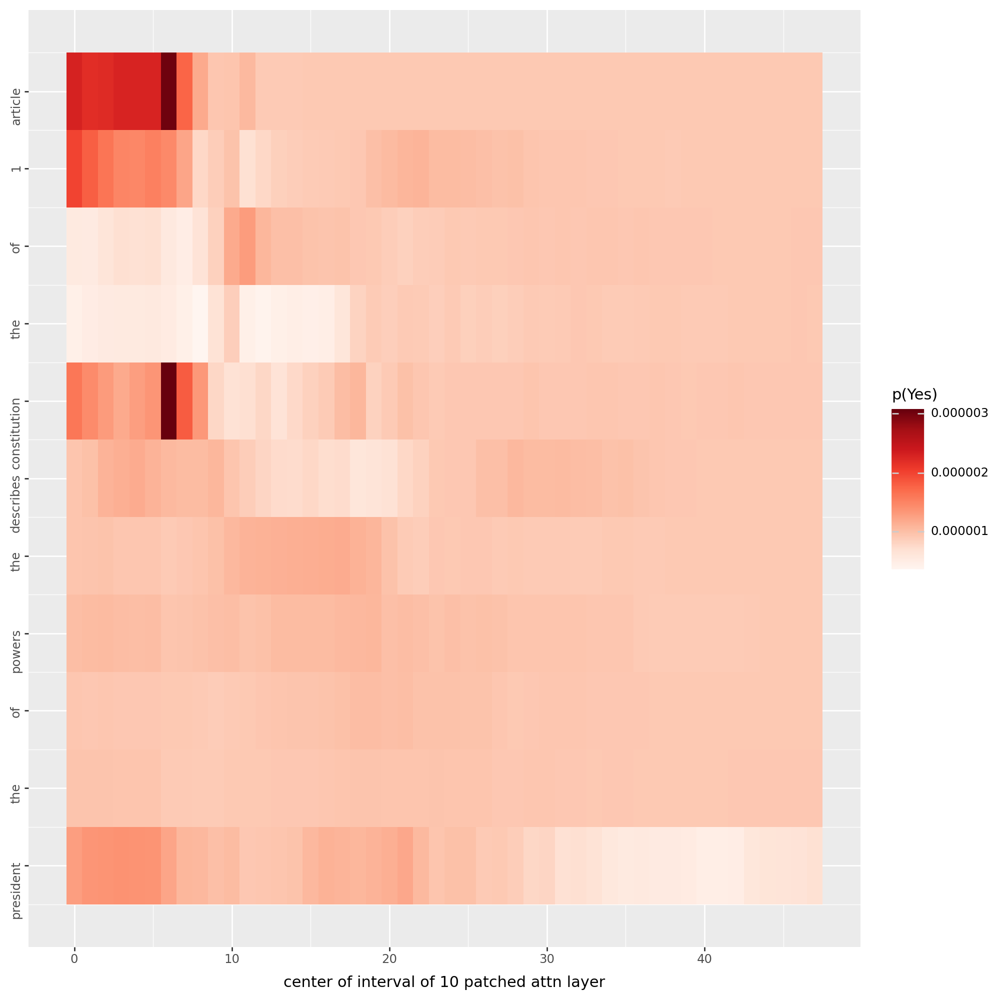

100%|██████████| 48/48 [03:41<00:00,  4.62s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_4_gpt2-xl_no_block_output.pdf


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


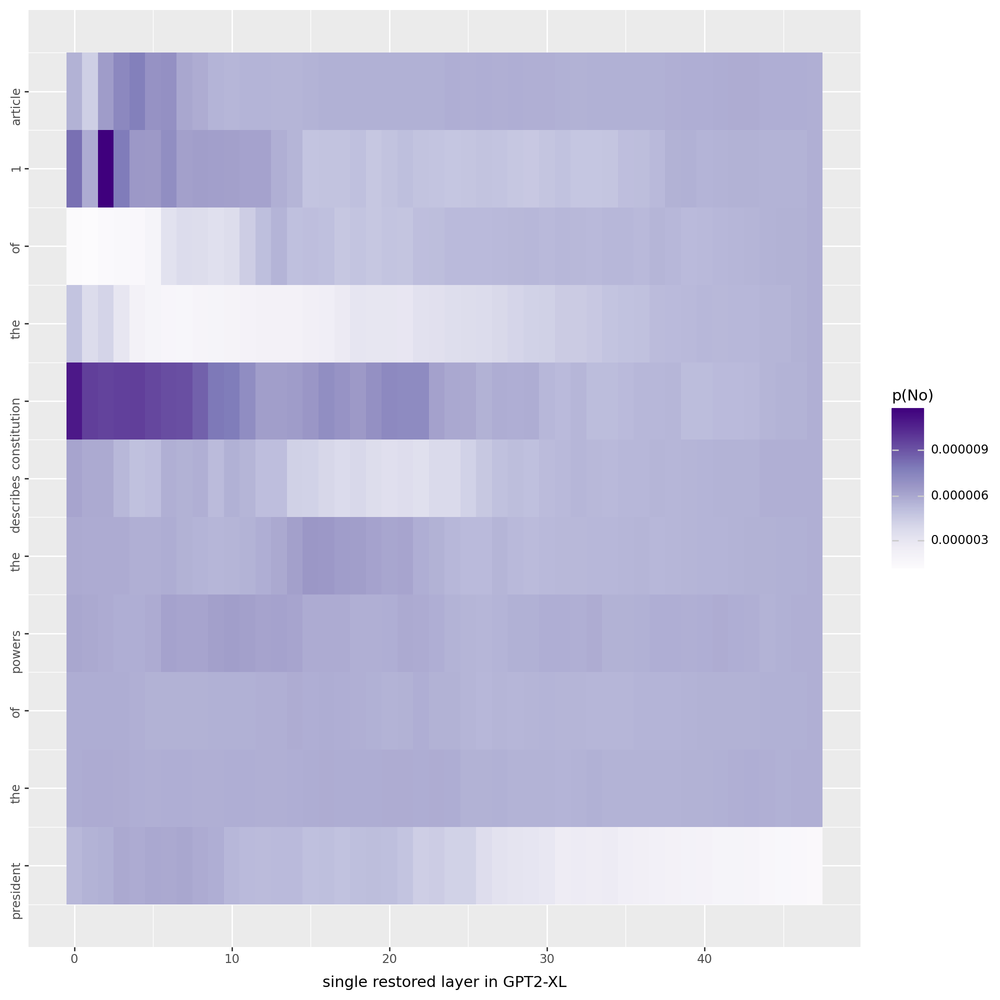

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_4_gpt2-xl_no_mlp_activation.pdf


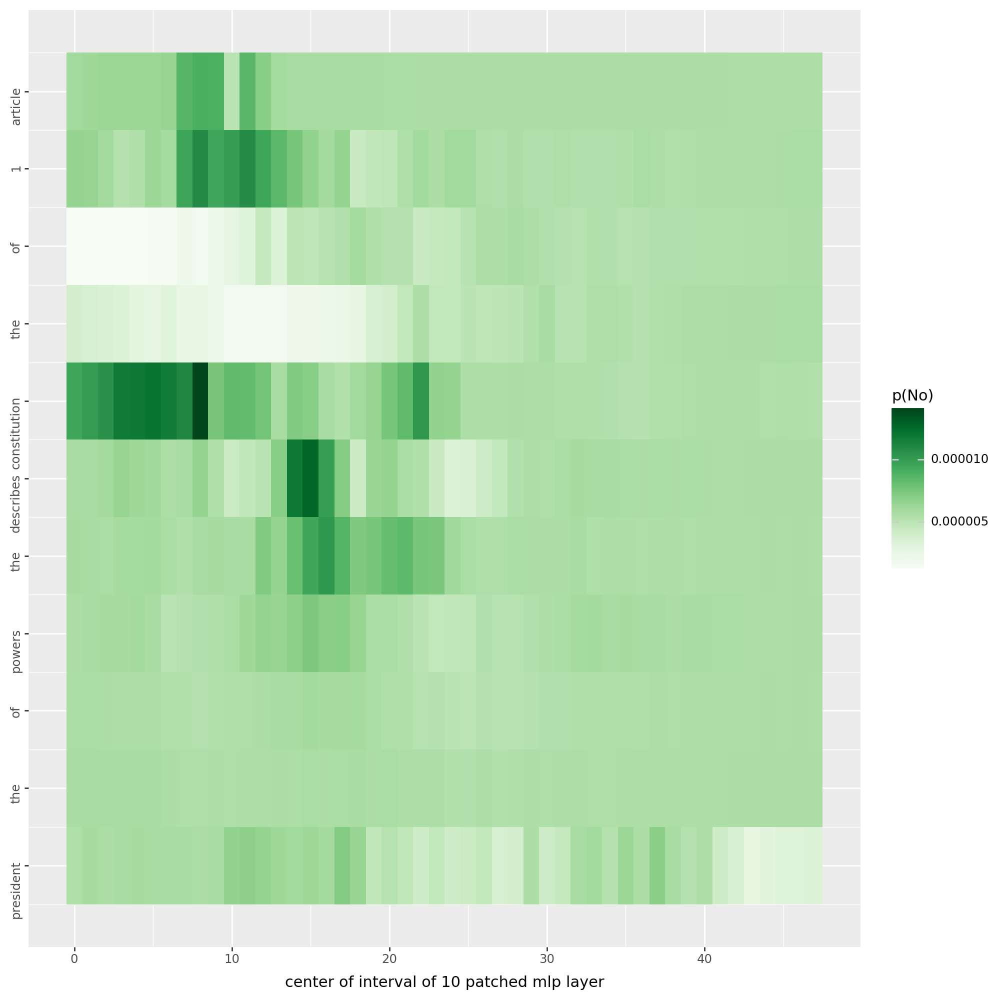

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_4_gpt2-xl_no_attention_output.pdf


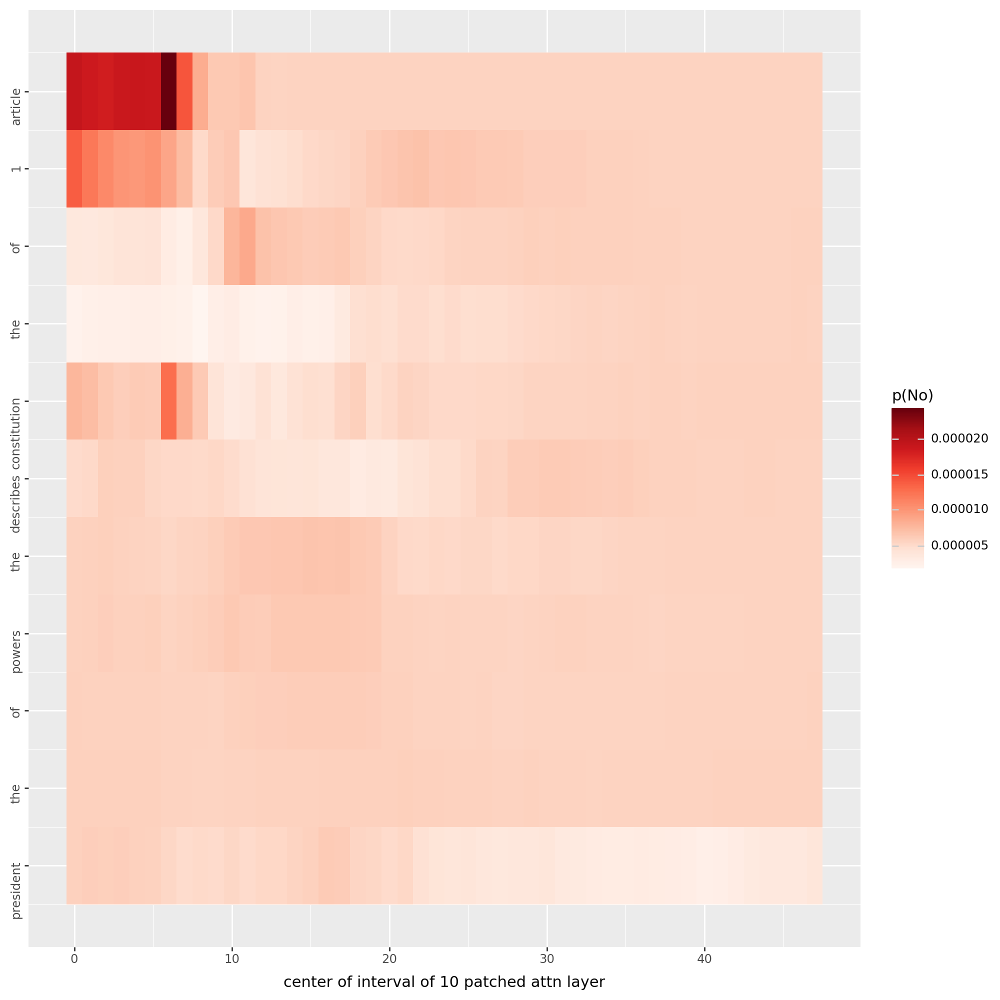

article 1 of the constitution describes the powers of the president
Przed zaszumieniem
_as                  0.47120508551597595
_in                  0.10319137573242188
:                    0.080246202647686
,                    0.06499266624450684
.                    0.054460443556308746
_and                 0.04876279830932617
_of                  0.022344427183270454
_this                0.01695595122873783
_"                   0.010835247114300728
_to                  0.00747241685166955
Po zaszumieniu
,                    0.18837247788906097
_in                  0.16205769777297974
_as                  0.13373199105262756
.                    0.10975133627653122
_and                 0.07245153188705444
_of                  0.054181527346372604
_that                0.03548925369977951
_to                  0.02212350256741047
_(                   0.014473496936261654
_which               0.013306889683008194
['article', '1', 'of', 'the', 'constitution', 'describes', 'the', 'powers'

100%|██████████| 48/48 [03:41<00:00,  4.61s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_4_boolq_gpt2-xl_seed-1_yes_block_output.pdf


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


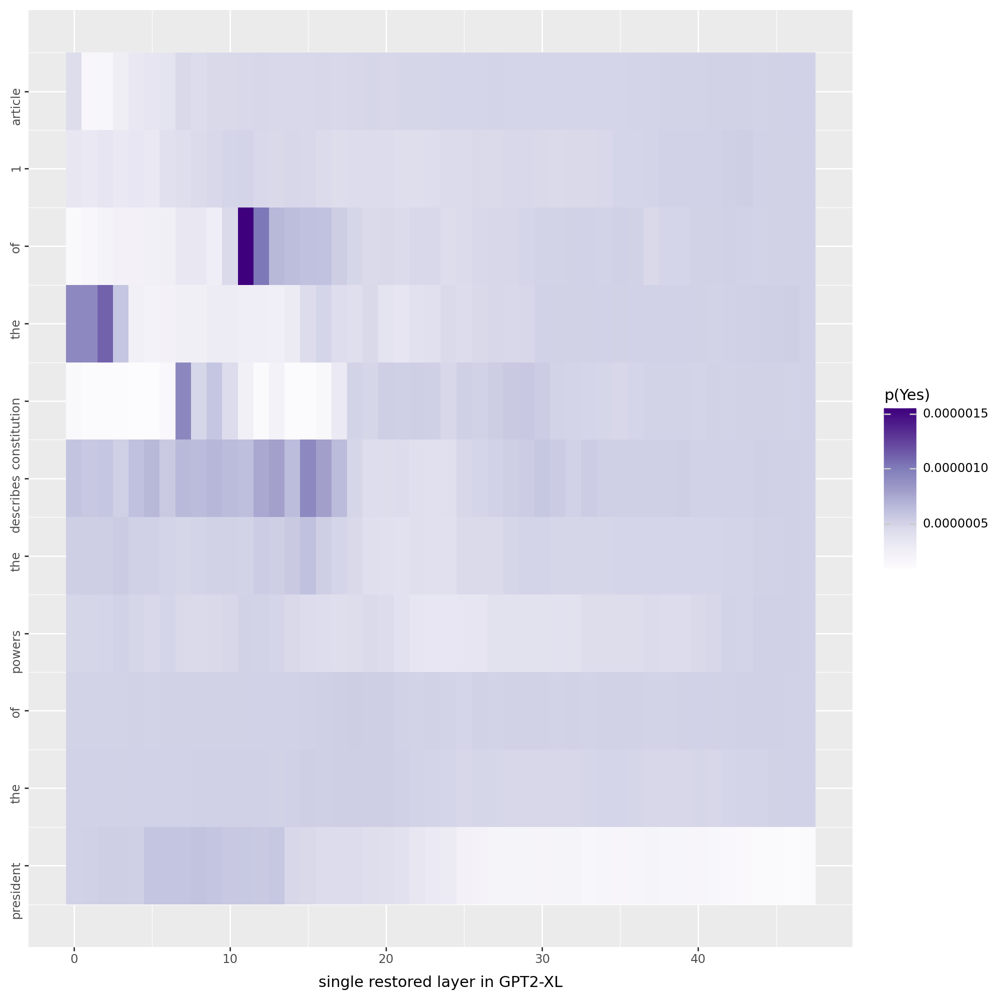

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_4_boolq_gpt2-xl_seed-1_yes_mlp_activation.pdf


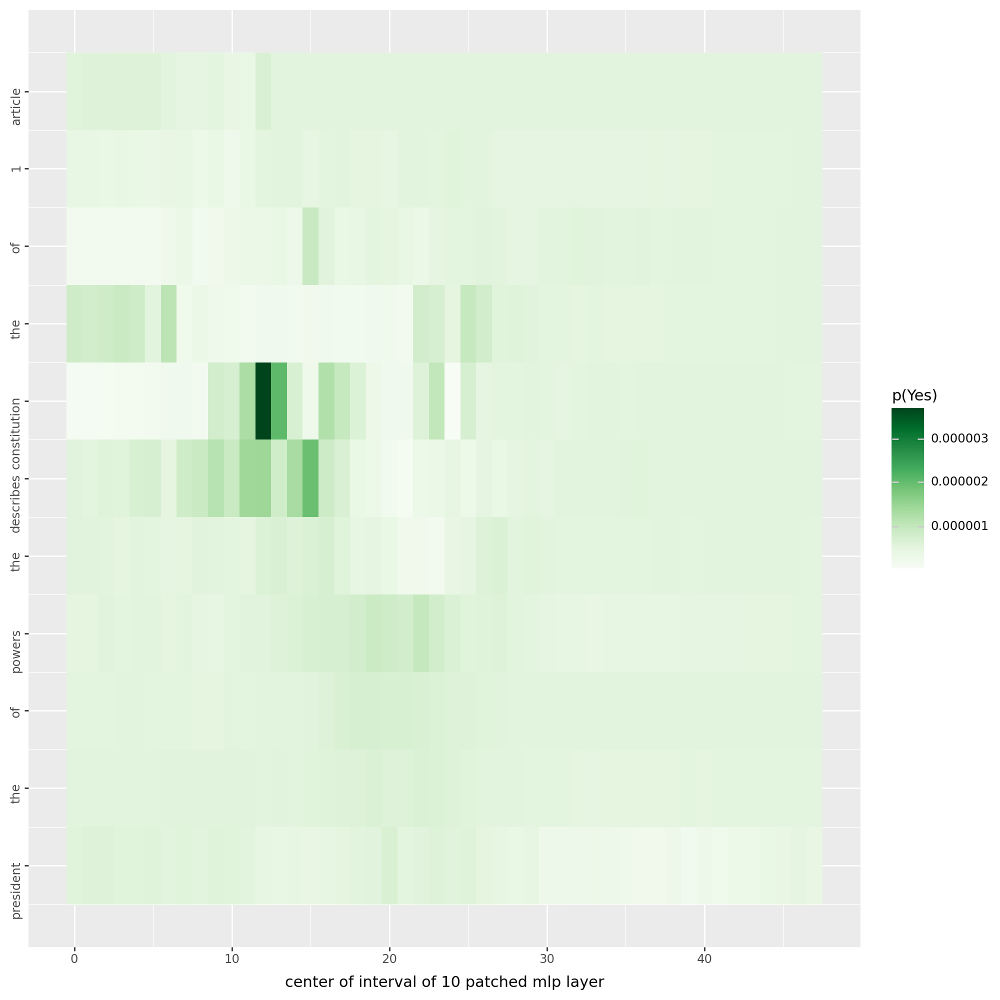

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_4_boolq_gpt2-xl_seed-1_yes_attention_output.pdf


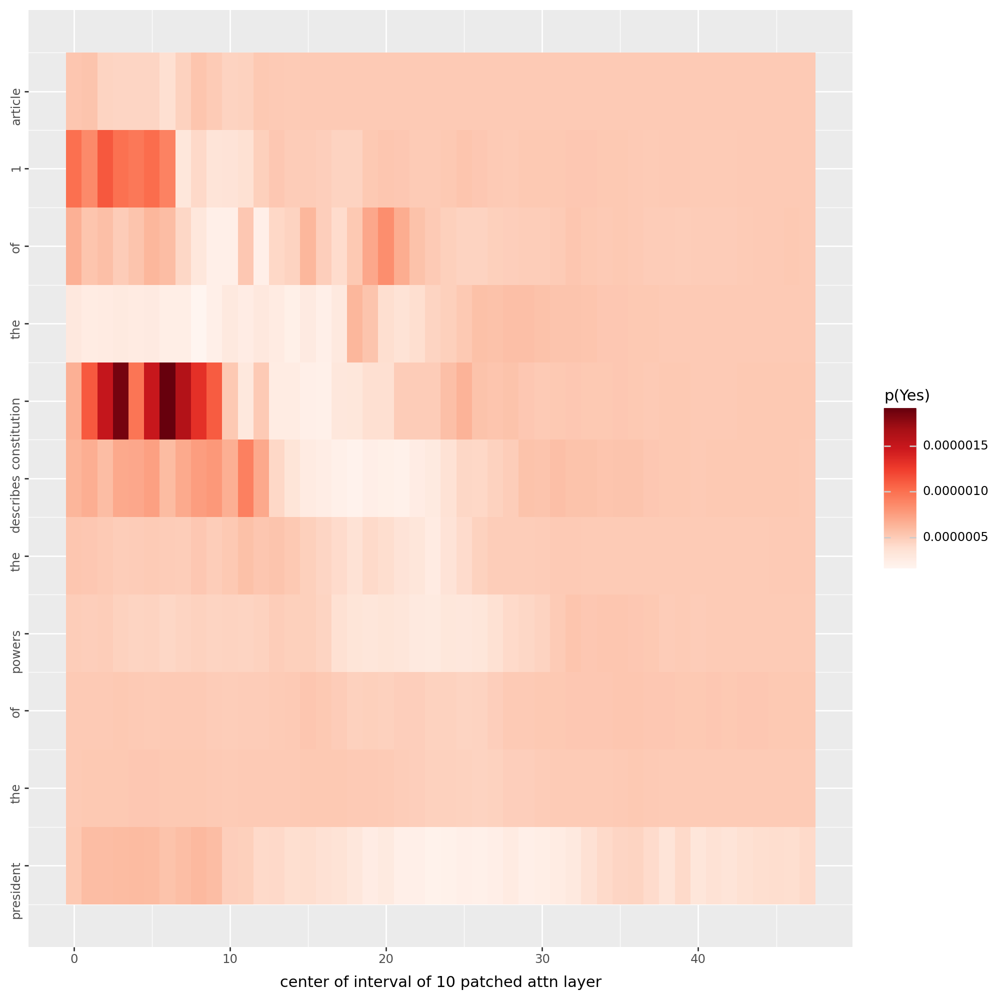

100%|██████████| 48/48 [03:41<00:00,  4.61s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_4_boolq_gpt2-xl_seed-1_no_block_output.pdf


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


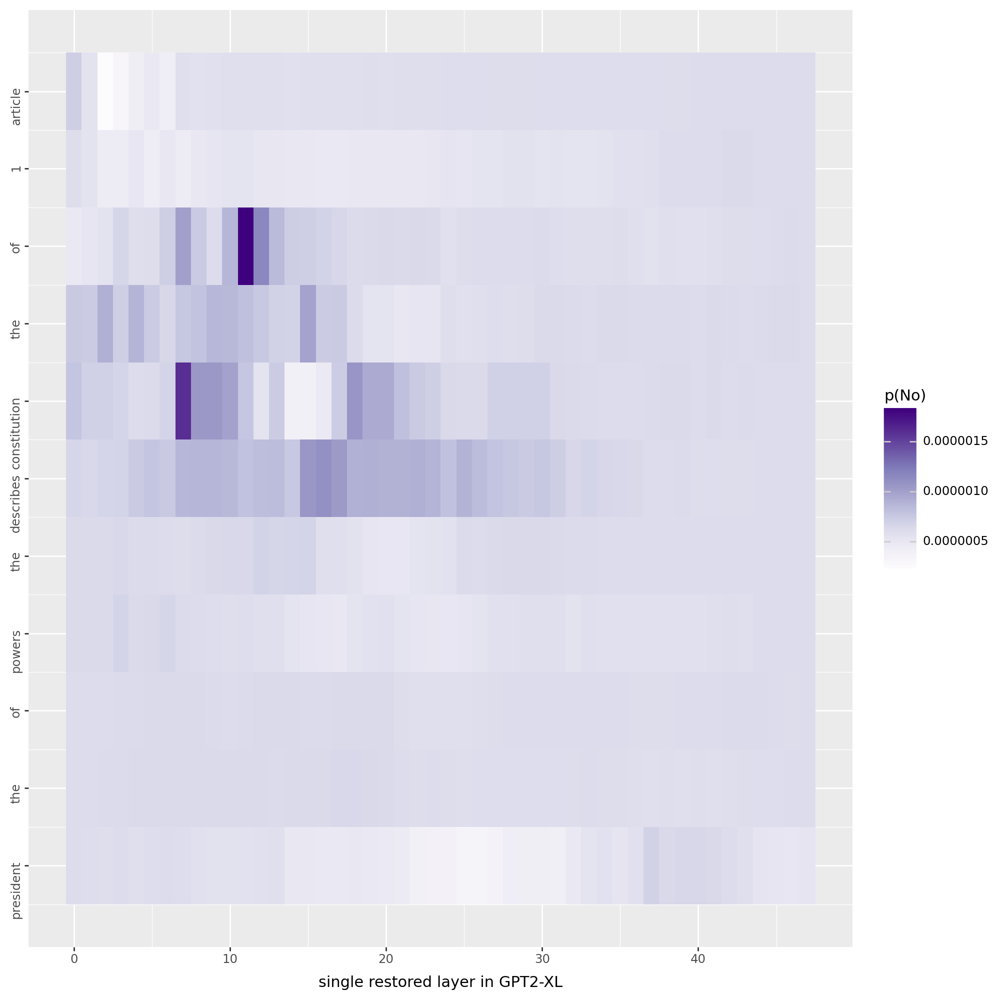

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_4_boolq_gpt2-xl_seed-1_no_mlp_activation.pdf


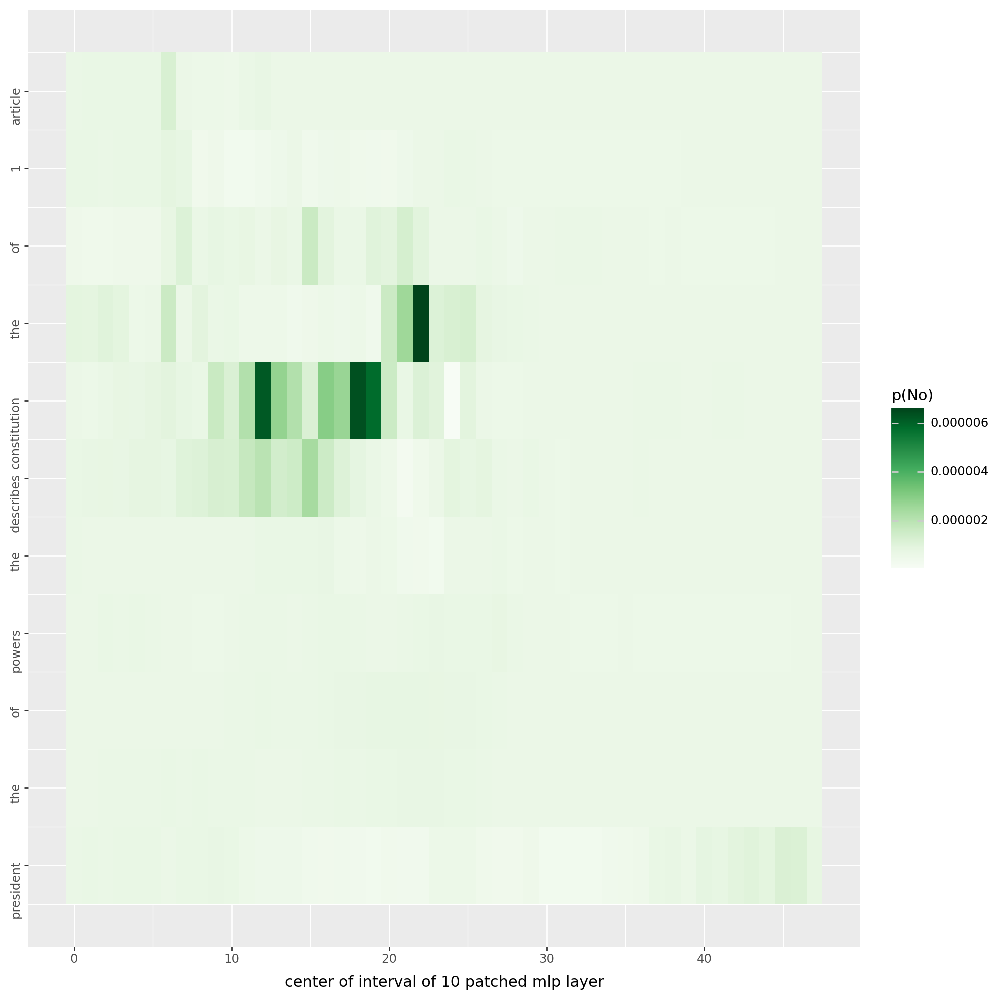

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_4_boolq_gpt2-xl_seed-1_no_attention_output.pdf


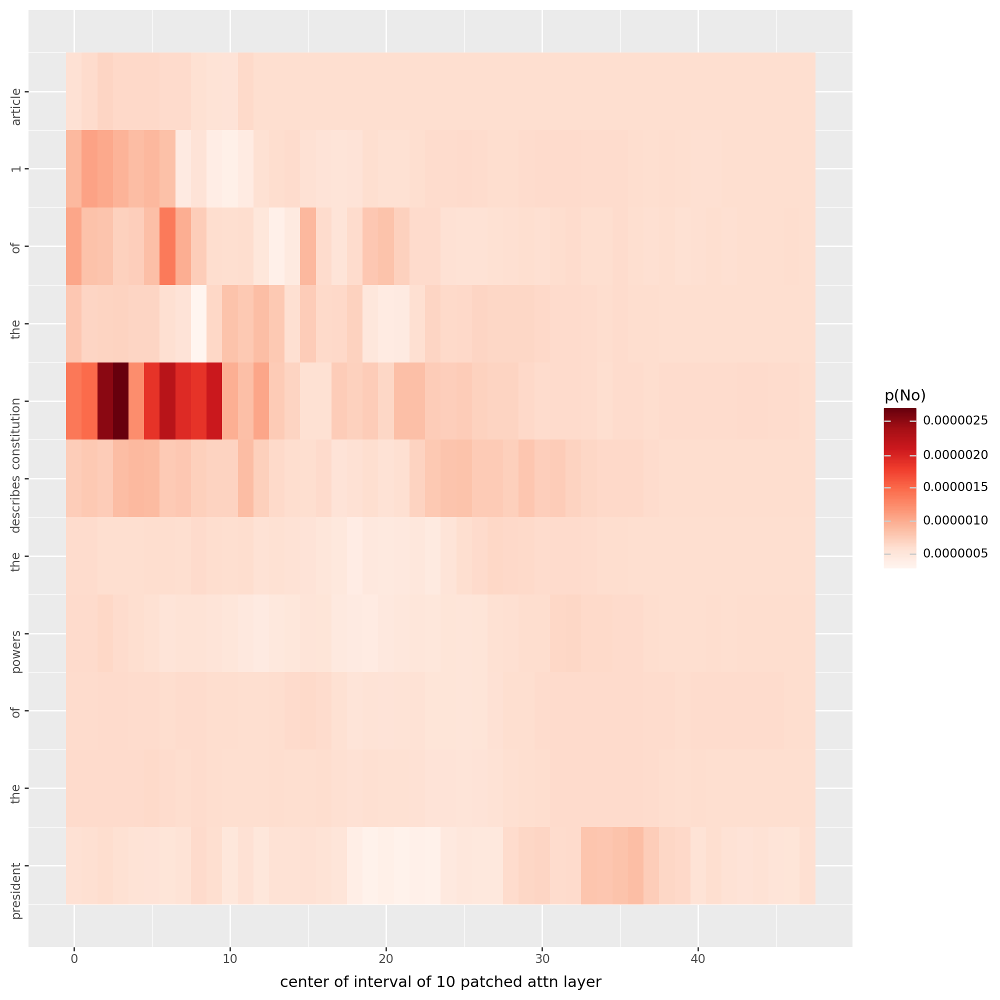

In [24]:
run(example_4['question'][0], unit_locations, models_dict, 4)

### Przykład 5

In [25]:
example_5 = ds['train'].select(range(5206, 5207))
print('QUESTION: {} \nANSWER: {}\nPASSAGE: {}\n'.format(example_5['question'], example_5['answer'], example_5['passage']))

QUESTION: ['does law and order still make new episodes'] 
ANSWER: [False]
PASSAGE: ['Law & Order is an American police procedural and legal drama television series, created by Dick Wolf and part of the Law & Order franchise. It originally aired on NBC and, in syndication, on various cable networks. Law & Order premiered on September 13, 1990, and completed its 20th and final season on May 24, 2010. At the time of its cancellation, Law & Order was the longest-running crime drama on American primetime television.']



In [26]:
tok = tokenizer(example_5['question'], return_tensors='pt').to(device)
tokens = tokenizer.convert_ids_to_tokens(tok['input_ids'][0])
print(tokens)

['does', 'Ġlaw', 'Ġand', 'Ġorder', 'Ġstill', 'Ġmake', 'Ġnew', 'Ġepisodes']


In [27]:
unit_locations = [1, 2, 3]

does law and order still make new episodes
Przed zaszumieniem
_of                  0.47460970282554626
_possible            0.06415087729692459
?                    0.056341495364904404
?"                   0.03131471574306488
,                    0.020704926922917366
_and                 0.01505421381443739
_in                  0.013990876264870167
_necessary           0.011522687040269375
_more                0.010715198703110218
_a                   0.009422452189028263
Po zaszumieniu
_of                  0.23335088789463043
.                    0.13396866619586945
,                    0.07284722477197647
_and                 0.03328491002321243
_every               0.028262559324502945
_in                  0.026061471551656723
_for                 0.025341404601931572
_on                  0.020992368459701538
!                    0.018556147813796997
\n                   0.01782403141260147
['does', 'law', 'and', 'order', 'still', 'make', 'new', 'episodes']


100%|██████████| 48/48 [03:39<00:00,  4.58s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_5_gpt2-xl_yes_block_output.pdf


[0, 1, 2, 3, 4, 5, 6, 7]


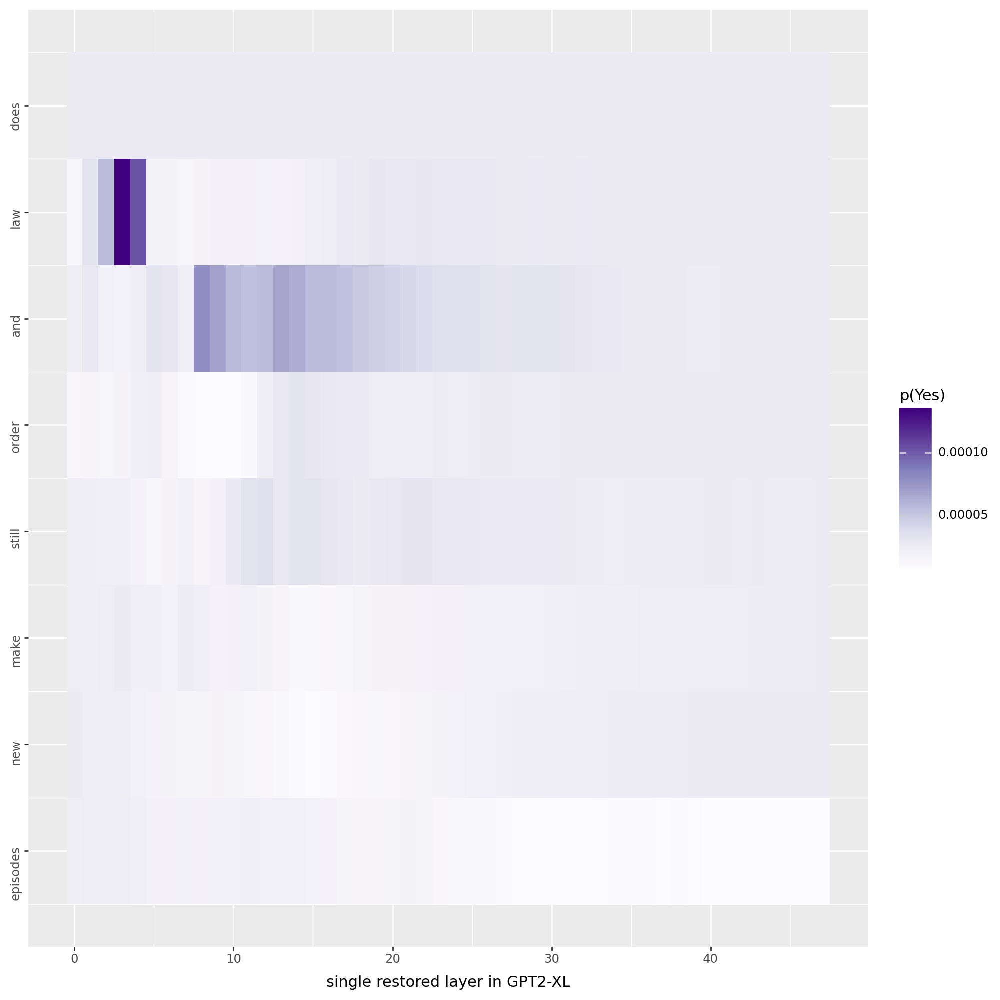

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_5_gpt2-xl_yes_mlp_activation.pdf


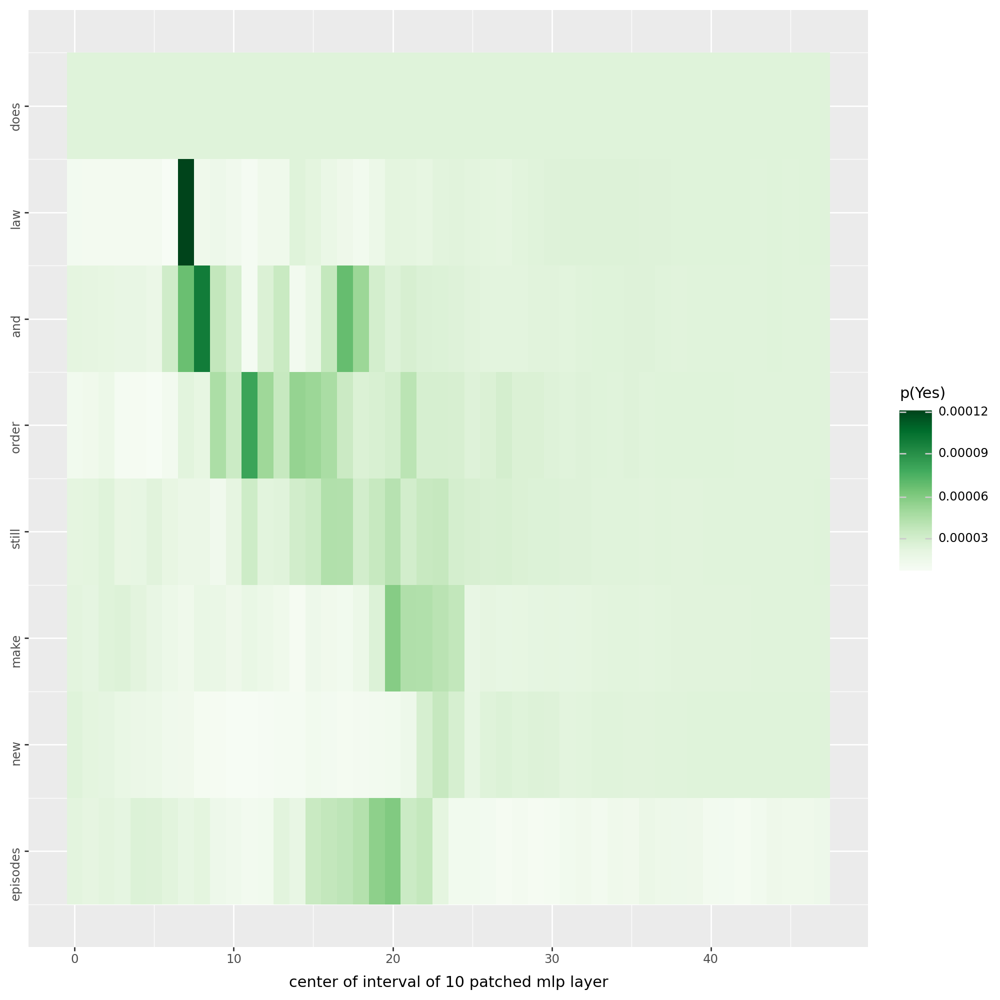

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_5_gpt2-xl_yes_attention_output.pdf


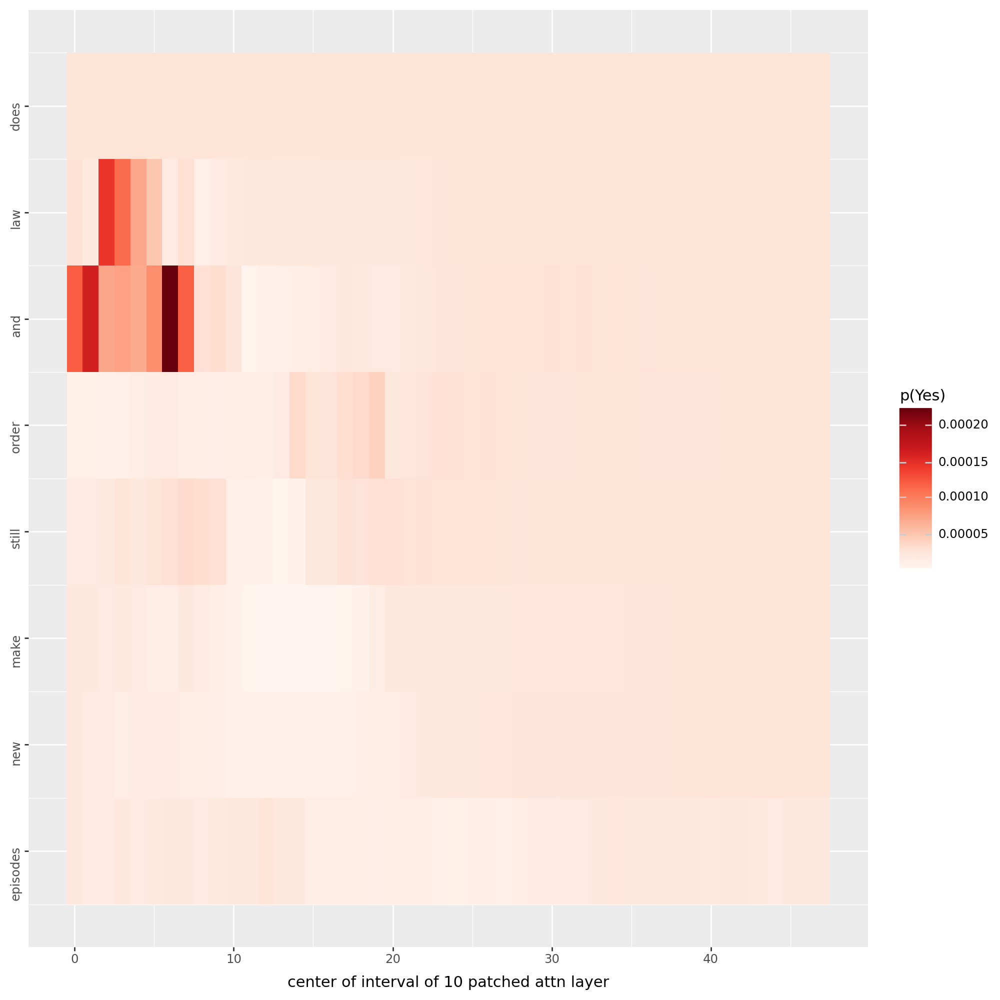

100%|██████████| 48/48 [02:29<00:00,  3.11s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_5_gpt2-xl_no_block_output.pdf


[0, 1, 2, 3, 4, 5, 6, 7]


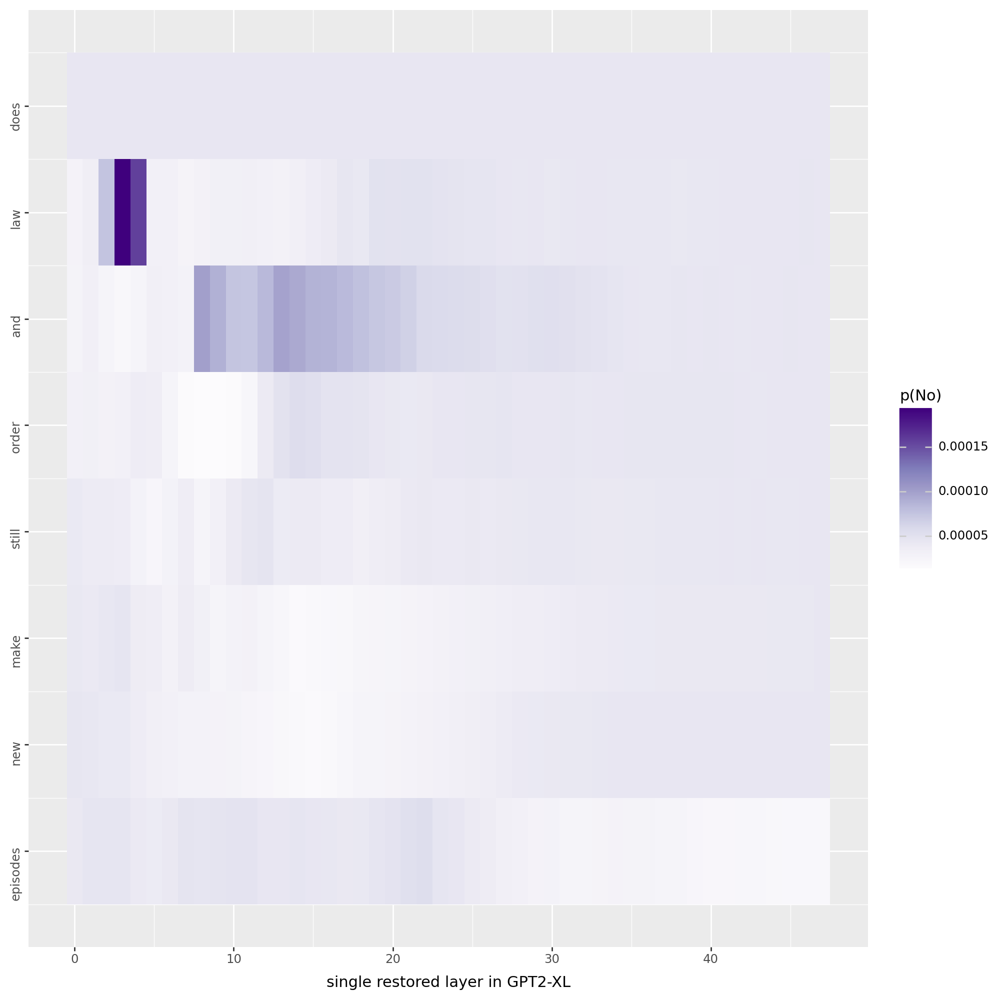

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_5_gpt2-xl_no_mlp_activation.pdf


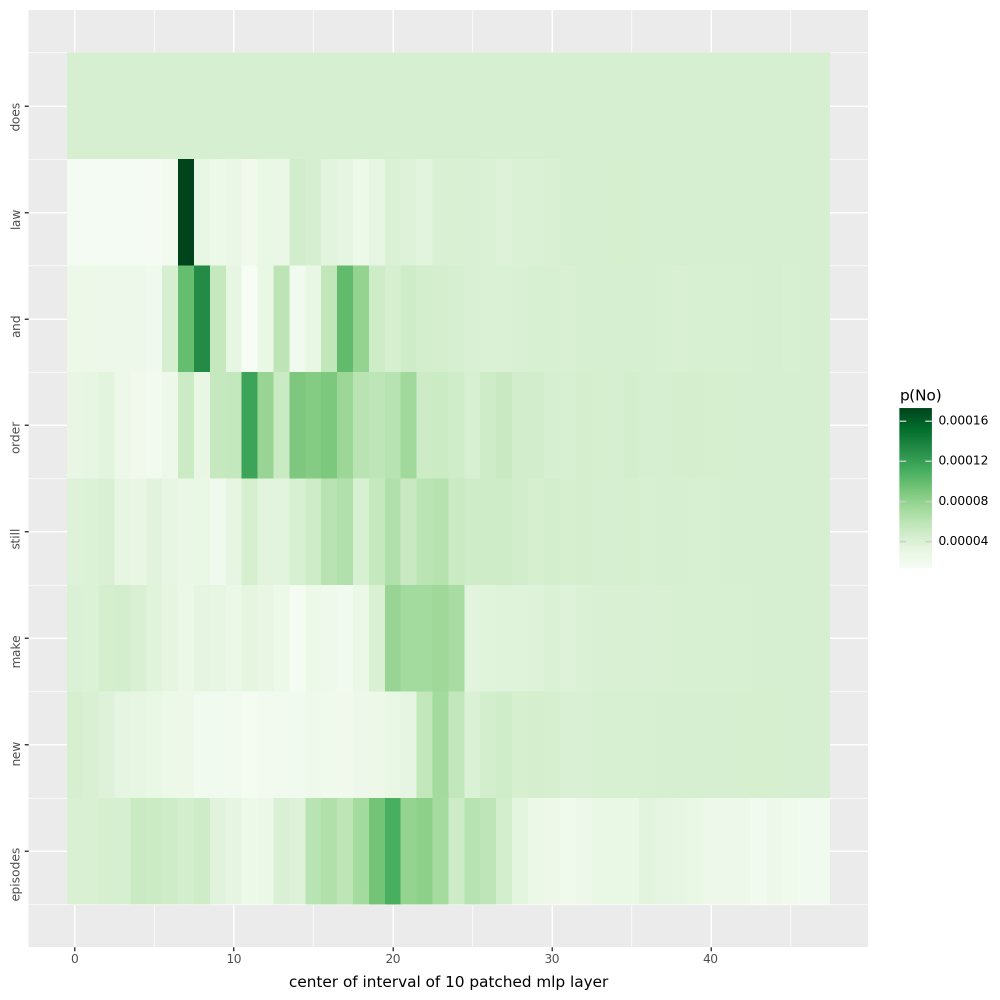

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_5_gpt2-xl_no_attention_output.pdf


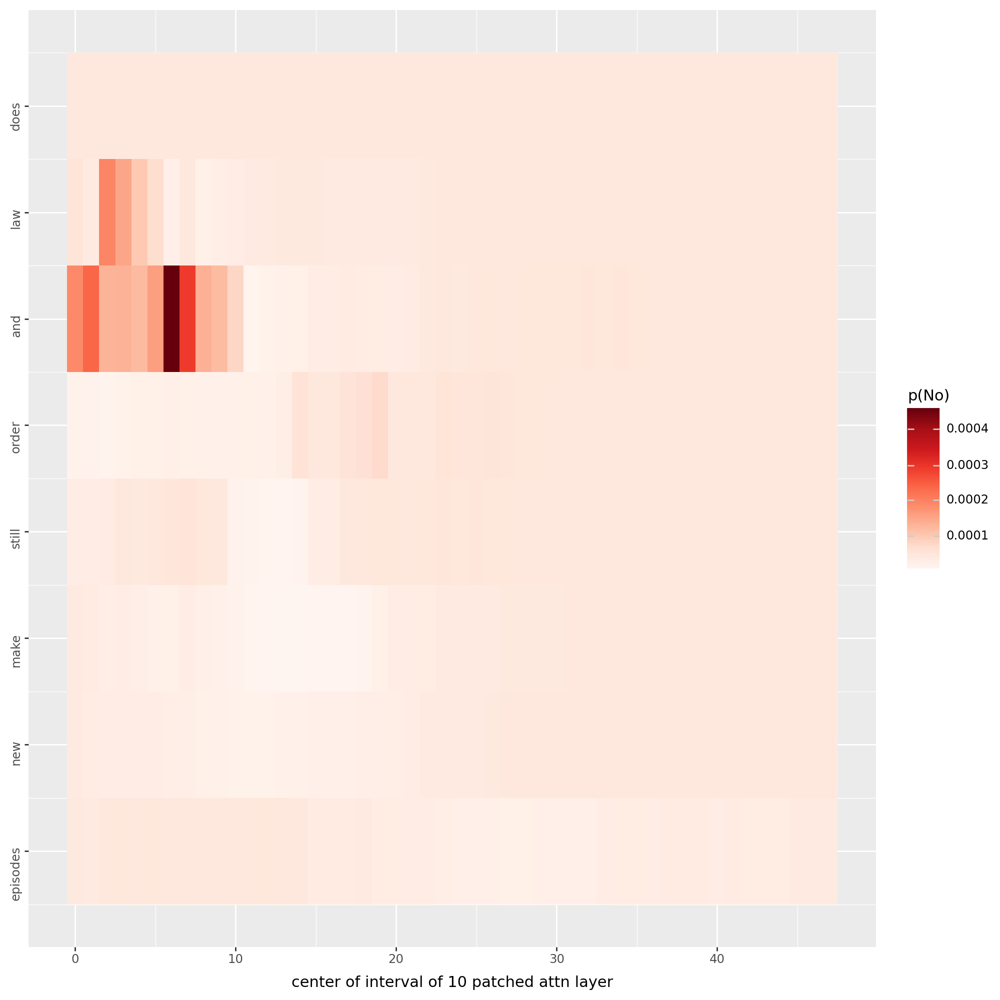

does law and order still make new episodes
Przed zaszumieniem
_of                  0.8818875551223755
?                    0.05709295719861984
_in                  0.010392244905233383
_for                 0.005886172875761986
,                    0.003942258656024933
_on                  0.0025794131215661764
_happen              0.002433494199067354
_possible            0.00228098314255476
_available           0.0018514592666178942
_worth               0.0018086504423990846
Po zaszumieniu
_of                  0.6812247037887573
?                    0.16245833039283752
_for                 0.06368297338485718
,                    0.01960119418799877
.                    0.011532986536622047
_after               0.004503715317696333
_even                0.0037052114494144917
_on                  0.0030438038520514965
_when                0.002955868374556303
_every               0.0029404107481241226
['does', 'law', 'and', 'order', 'still', 'make', 'new', 'episodes']


100%|██████████| 48/48 [02:26<00:00,  3.06s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_5_boolq_gpt2-xl_seed-1_yes_block_output.pdf


[0, 1, 2, 3, 4, 5, 6, 7]


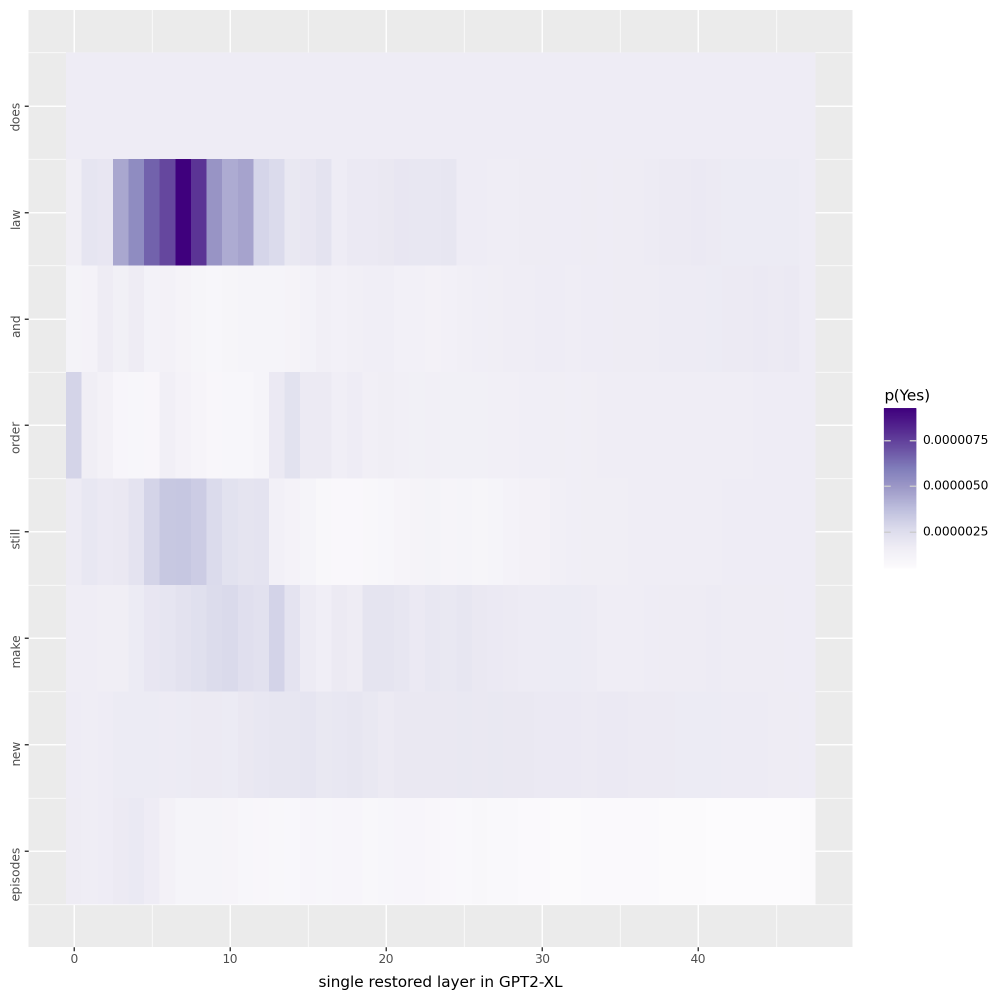

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_5_boolq_gpt2-xl_seed-1_yes_mlp_activation.pdf


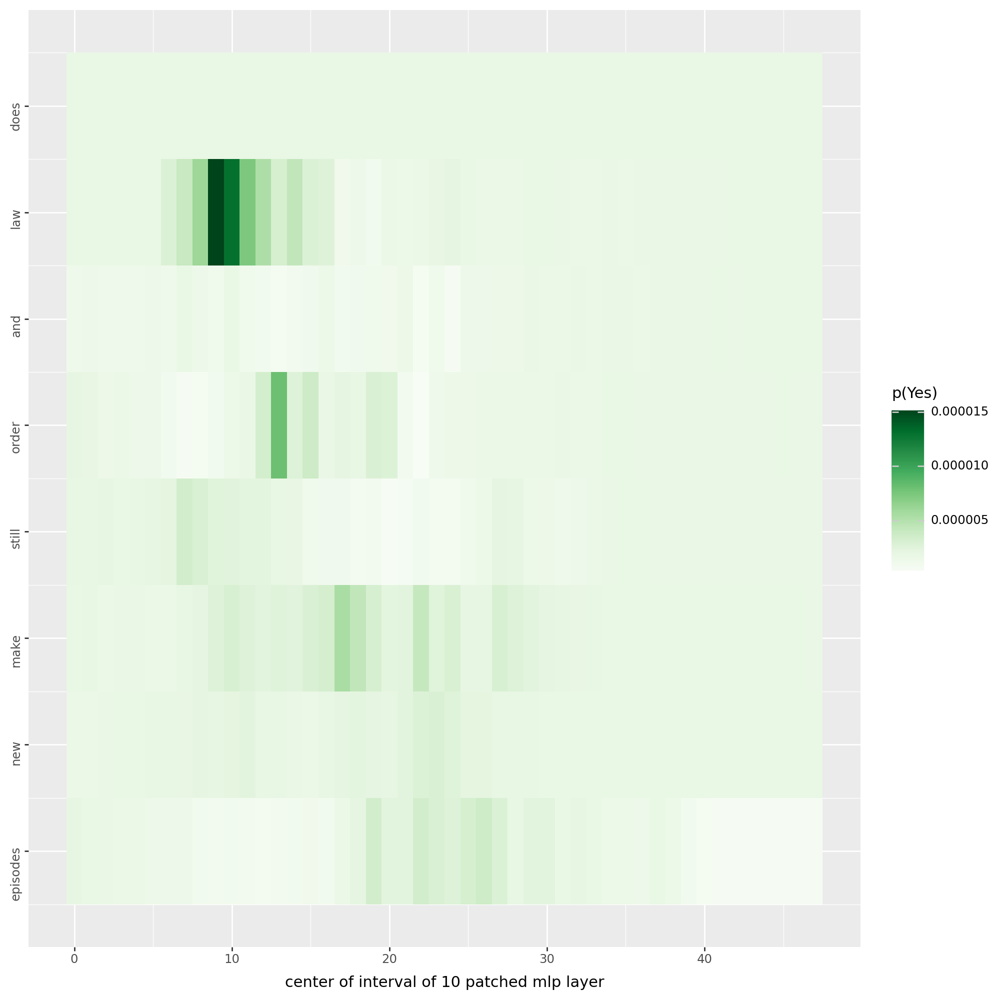

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_5_boolq_gpt2-xl_seed-1_yes_attention_output.pdf


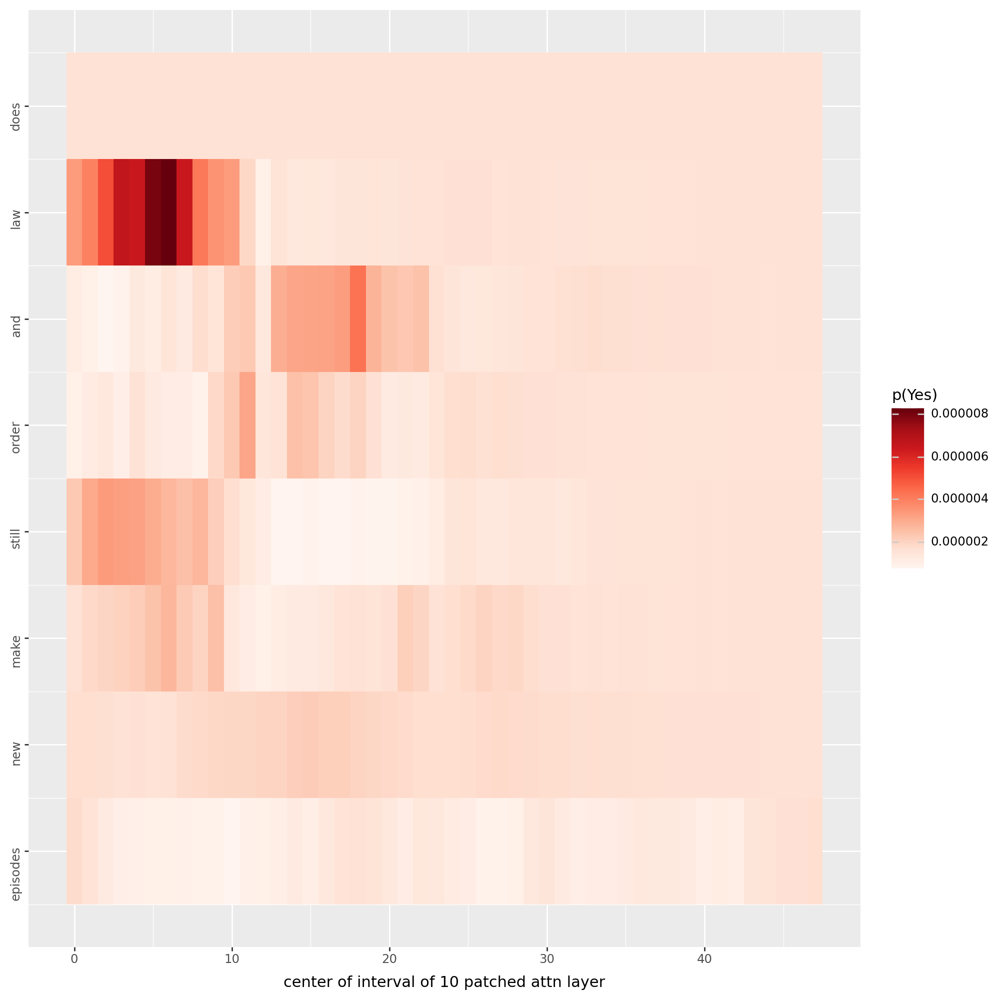

100%|██████████| 48/48 [02:28<00:00,  3.10s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_5_boolq_gpt2-xl_seed-1_no_block_output.pdf


[0, 1, 2, 3, 4, 5, 6, 7]


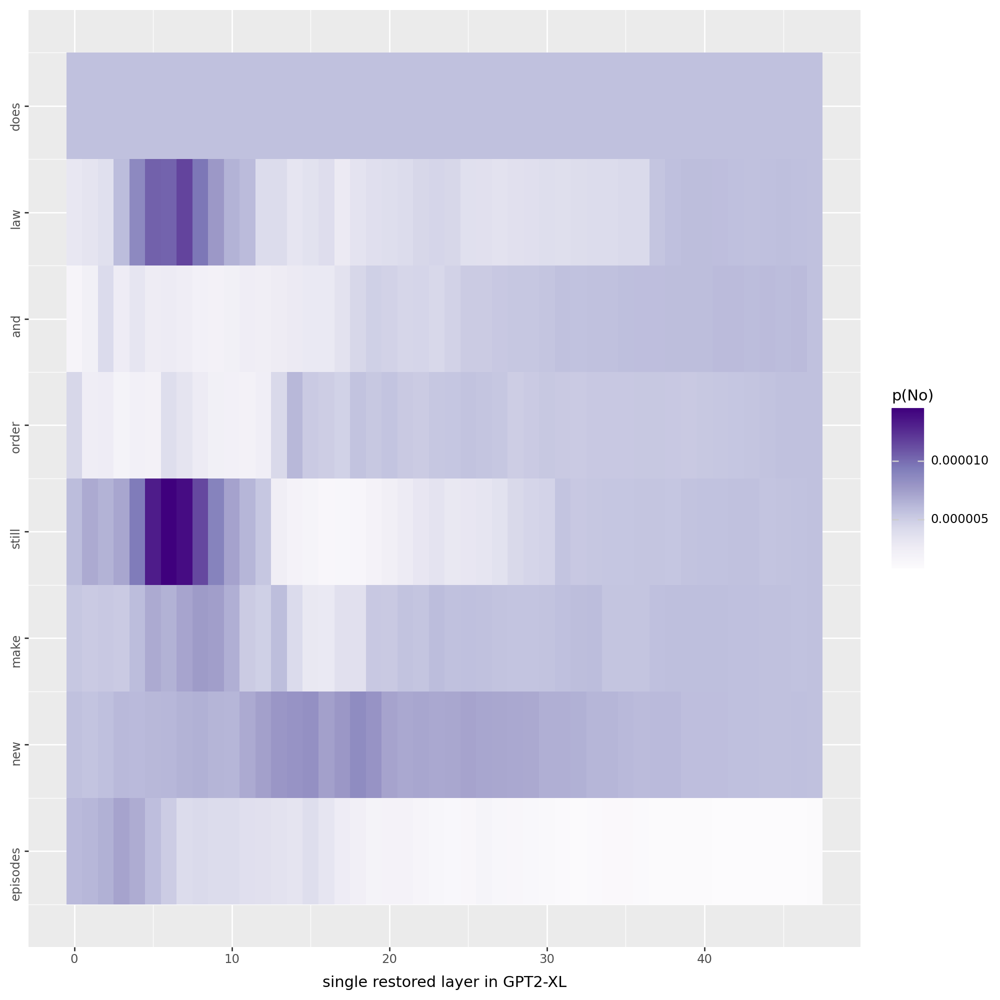

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_5_boolq_gpt2-xl_seed-1_no_mlp_activation.pdf


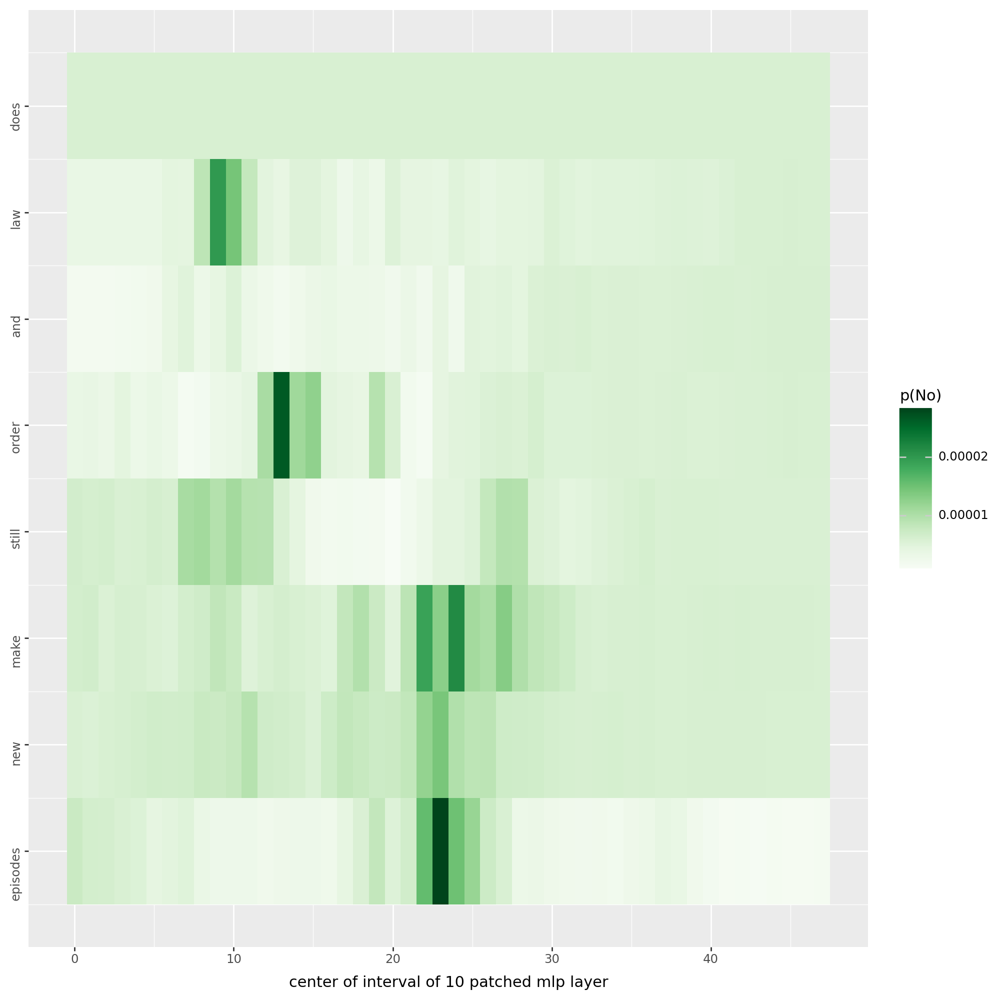

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_5_boolq_gpt2-xl_seed-1_no_attention_output.pdf


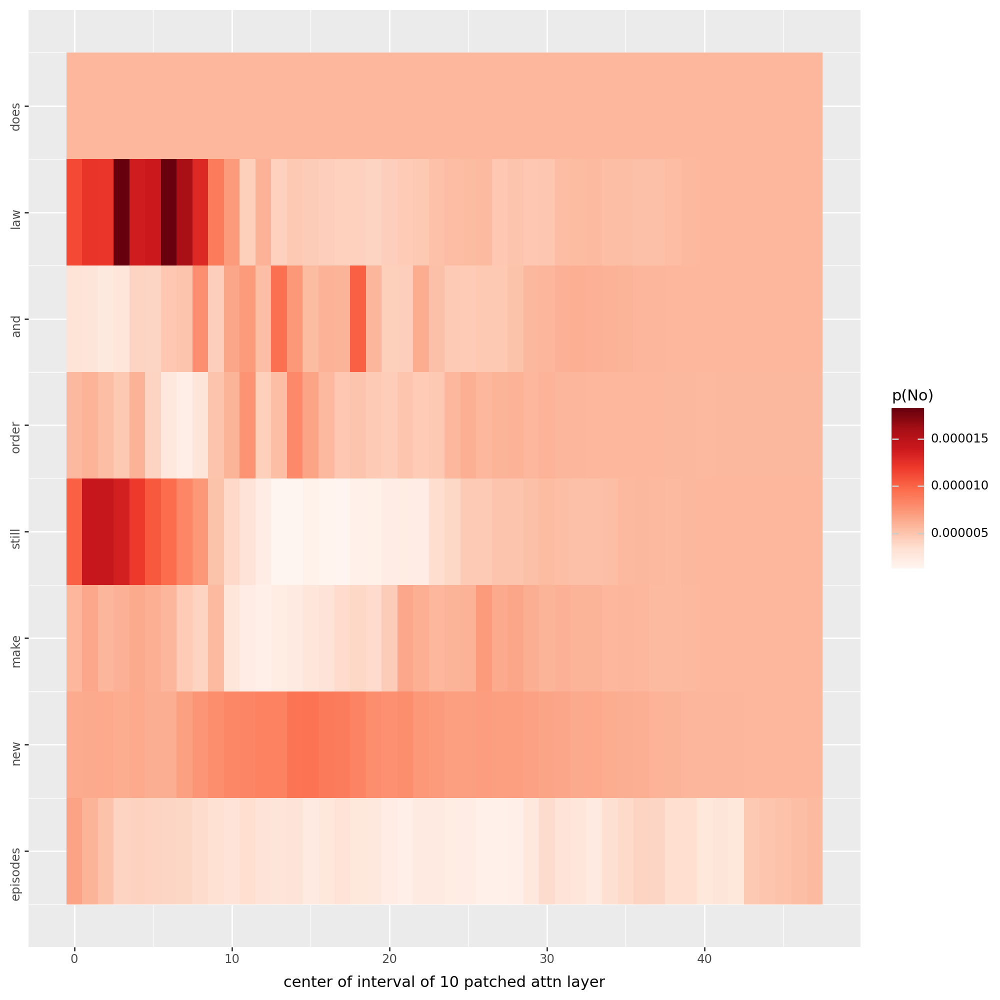

In [28]:
run(example_5['question'][0], unit_locations, models_dict, 5)

### Przykład 6

In [29]:
example_6 = ds['train'].select(range(3864, 3865))
print('QUESTION: {} \nANSWER: {}\nPASSAGE: {}\n'.format(example_6['question'], example_6['answer'], example_6['passage']))

QUESTION: ['is dark places based on a true story'] 
ANSWER: [False]
PASSAGE: ["Dark Places is a 2015 mystery thriller film directed by Gilles Paquet-Brenner. The screenplay, by Paquet-Brenner, is based on Gillian Flynn's 2009 novel of the same name. It stars Charlize Theron, Christina Hendricks, Nicholas Hoult, and Chloë Grace Moretz."]



In [31]:
tok = tokenizer(example_6['question'], return_tensors='pt').to(device)
tokens = tokenizer.convert_ids_to_tokens(tok['input_ids'][0])
tokens

['is', 'Ġdark', 'Ġplaces', 'Ġbased', 'Ġon', 'Ġa', 'Ġtrue', 'Ġstory']

In [32]:
unit_locations = [1, 2]

is dark places based on a true story
Przed zaszumieniem
.                    0.37863826751708984
,                    0.12166113406419754
_of                  0.04380596801638603
_about               0.04237040504813194
\n                   0.03263230249285698
_and                 0.03172801807522774
_that                0.029157904908061028
."                   0.020832113921642303
_from                0.020745042711496353
?                    0.017617730423808098
Po zaszumieniu
.                    0.3582408130168915
,                    0.09826251119375229
\n                   0.05508994683623314
_of                  0.03930779546499252
_about               0.038339417427778244
_and                 0.02865523286163807
_from                0.023558590561151505
:                    0.02200133167207241
_that                0.020291311666369438
_(                   0.015248926356434822
['is', 'dark', 'places', 'based', 'on', 'a', 'true', 'story']


100%|██████████| 48/48 [02:28<00:00,  3.10s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_6_gpt2-xl_yes_block_output.pdf


[0, 1, 2, 3, 4, 5, 6, 7]


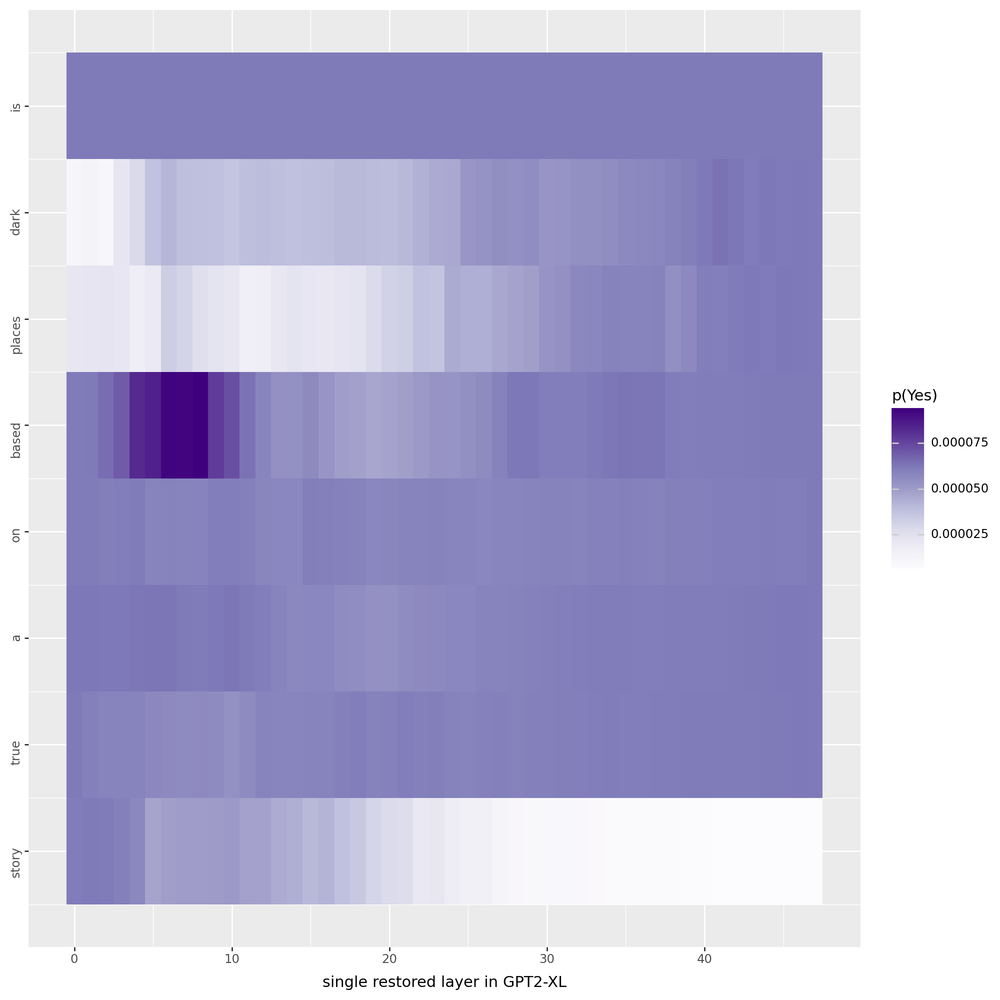

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_6_gpt2-xl_yes_mlp_activation.pdf


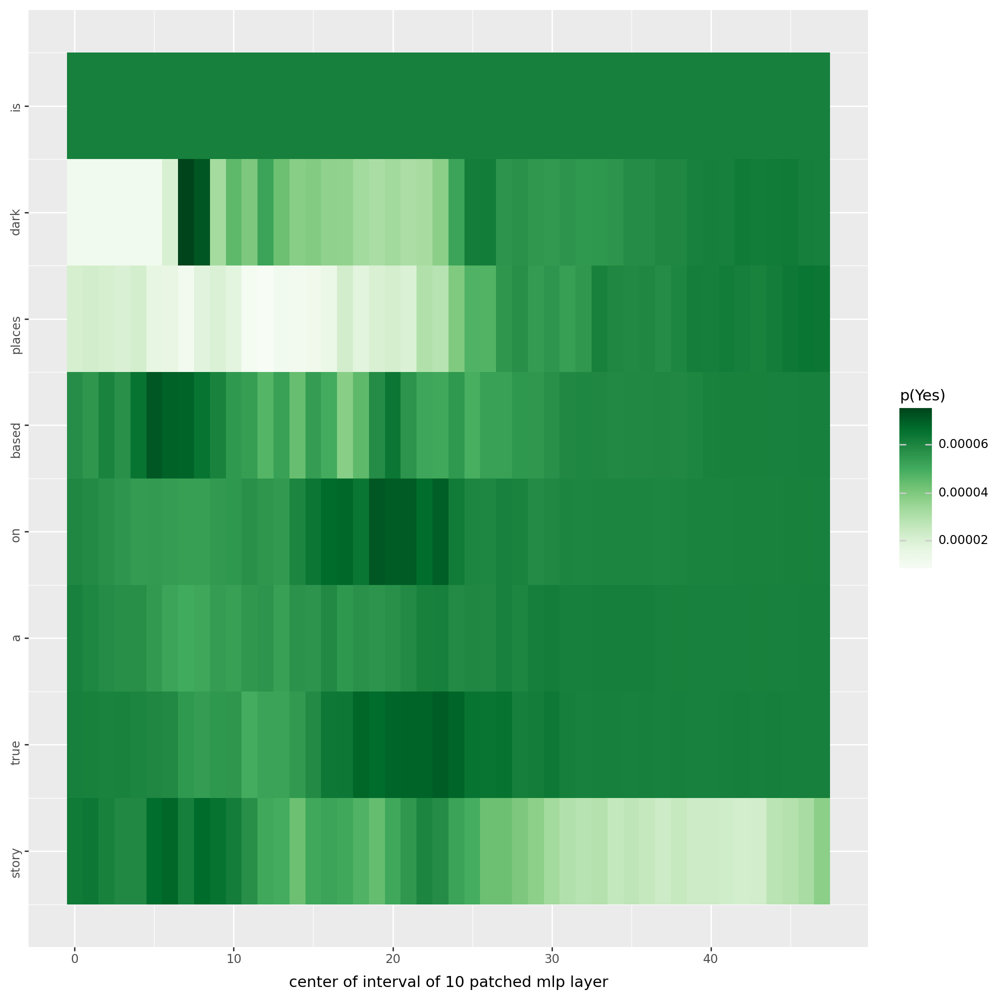

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_6_gpt2-xl_yes_attention_output.pdf


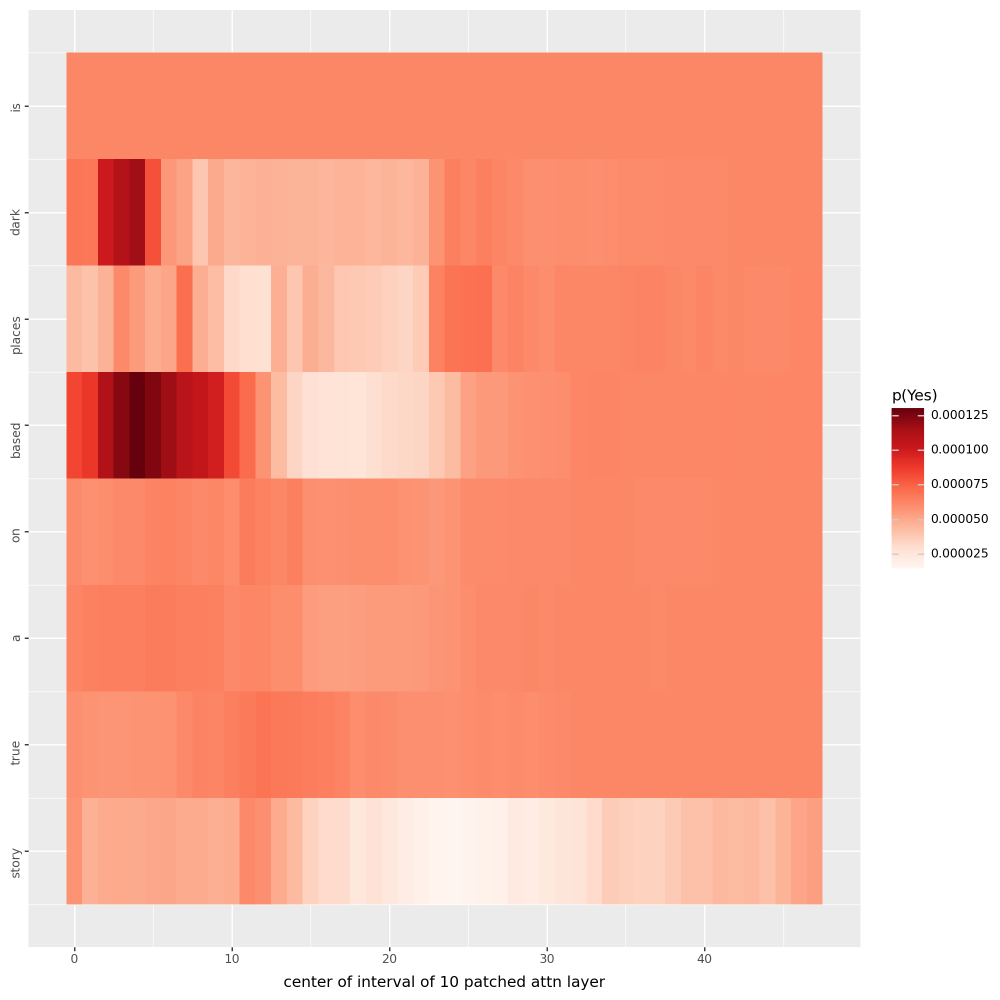

100%|██████████| 48/48 [02:28<00:00,  3.09s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_6_gpt2-xl_no_block_output.pdf


[0, 1, 2, 3, 4, 5, 6, 7]


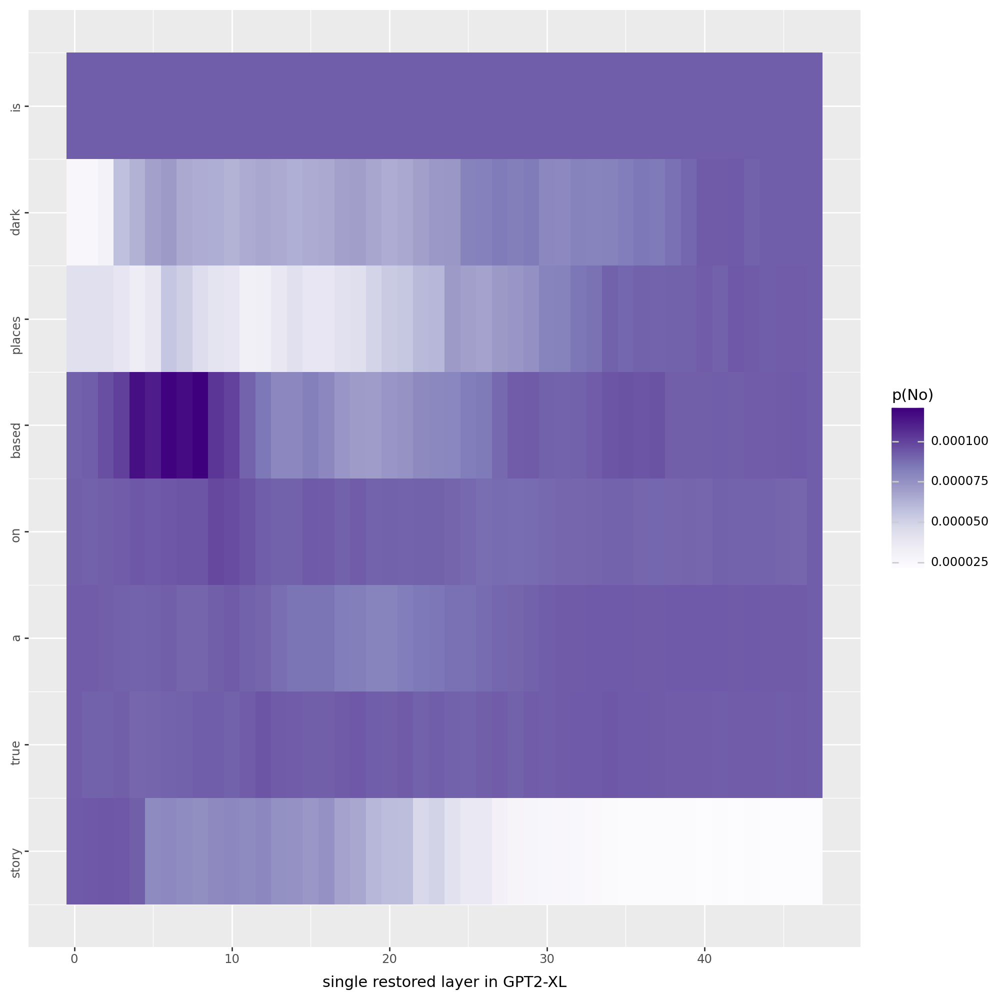

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_6_gpt2-xl_no_mlp_activation.pdf


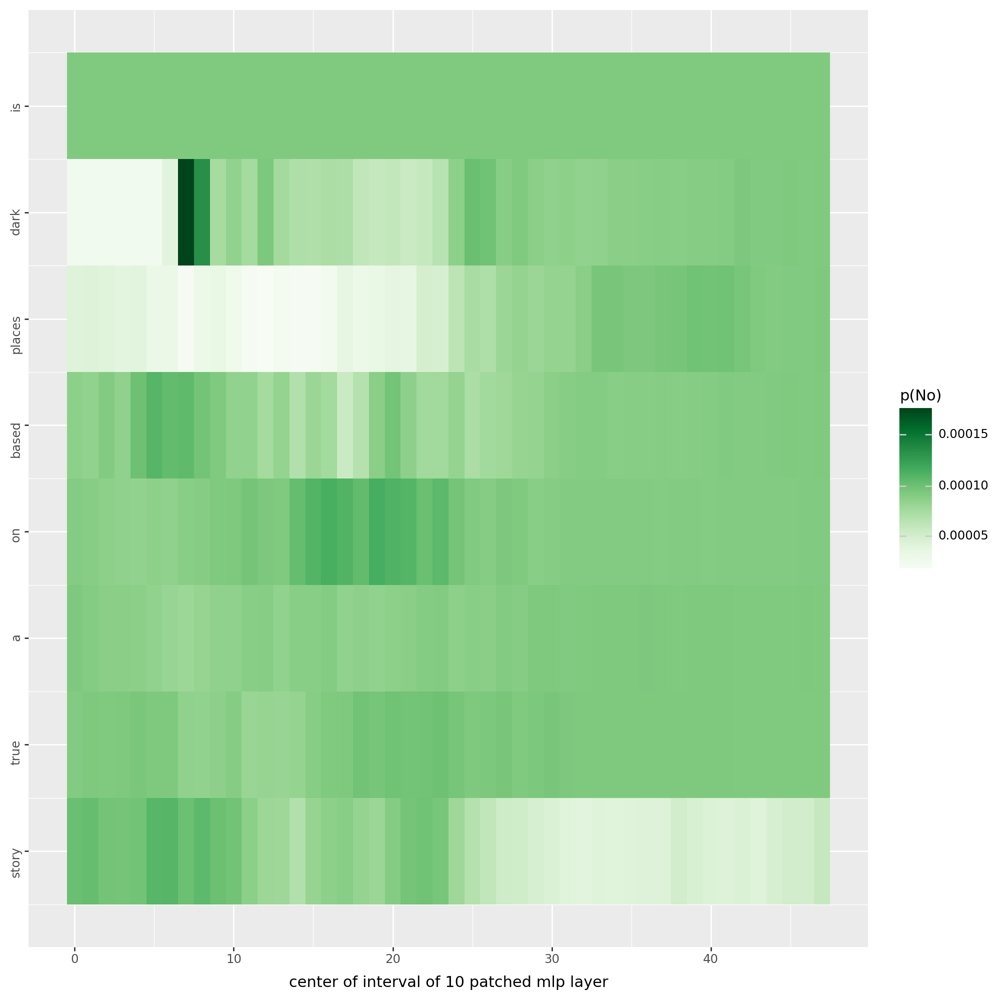

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_6_gpt2-xl_no_attention_output.pdf


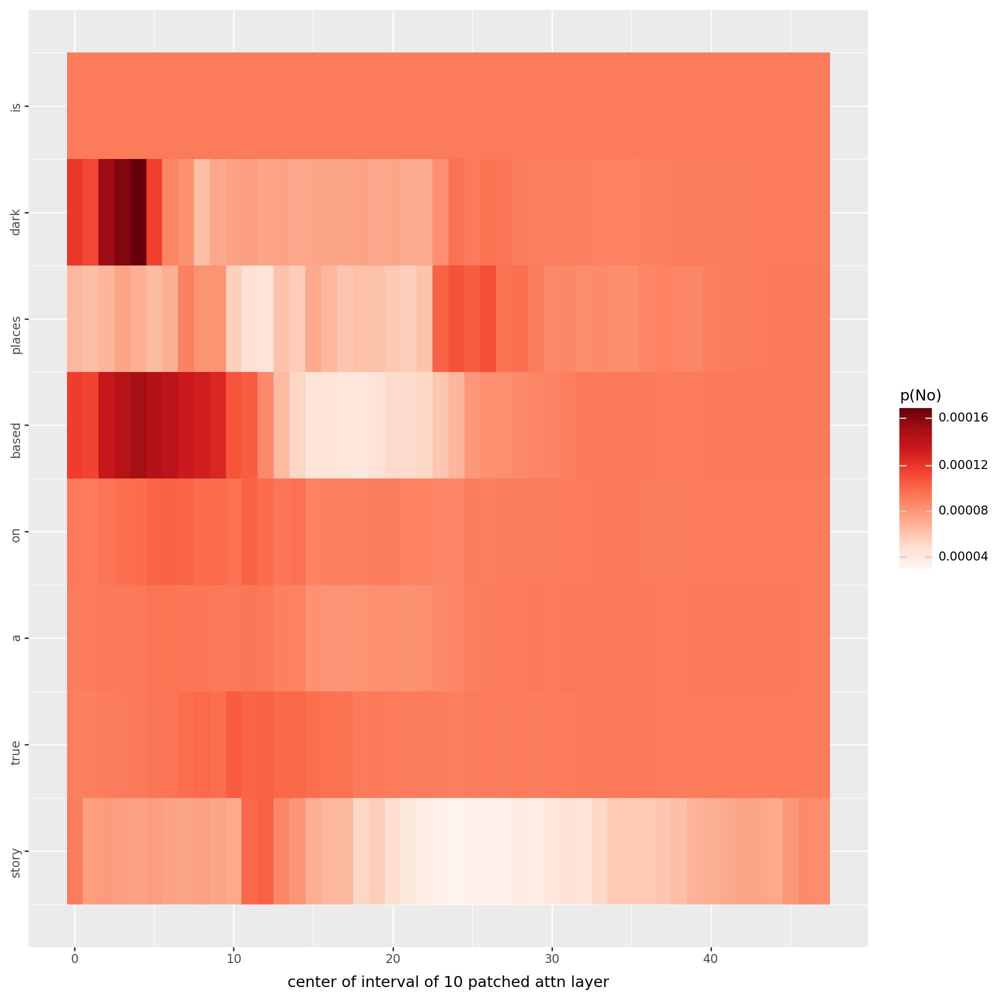

is dark places based on a true story
Przed zaszumieniem
?                    0.7119559645652771
,                    0.08599912375211716
.                    0.08422233164310455
_or                  0.012528769671916962
?"                   0.008385458961129189
_and                 0.007912329398095608
:                    0.00677703320980072
_–                   0.005682531278580427
;                    0.003704200265929103
_that                0.003376944689080119
Po zaszumieniu
?                    0.769571840763092
,                    0.08394820988178253
_or                  0.03211889788508415
.                    0.02463931404054165
_is                  0.012193633243441582
:                    0.006959713064134121
_and                 0.004543839488178492
?"                   0.003656970337033272
_–                   0.00289683579467237
?                    0.0027265818789601326
['is', 'dark', 'places', 'based', 'on', 'a', 'true', 'story']


100%|██████████| 48/48 [02:28<00:00,  3.09s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_6_boolq_gpt2-xl_seed-1_yes_block_output.pdf


[0, 1, 2, 3, 4, 5, 6, 7]


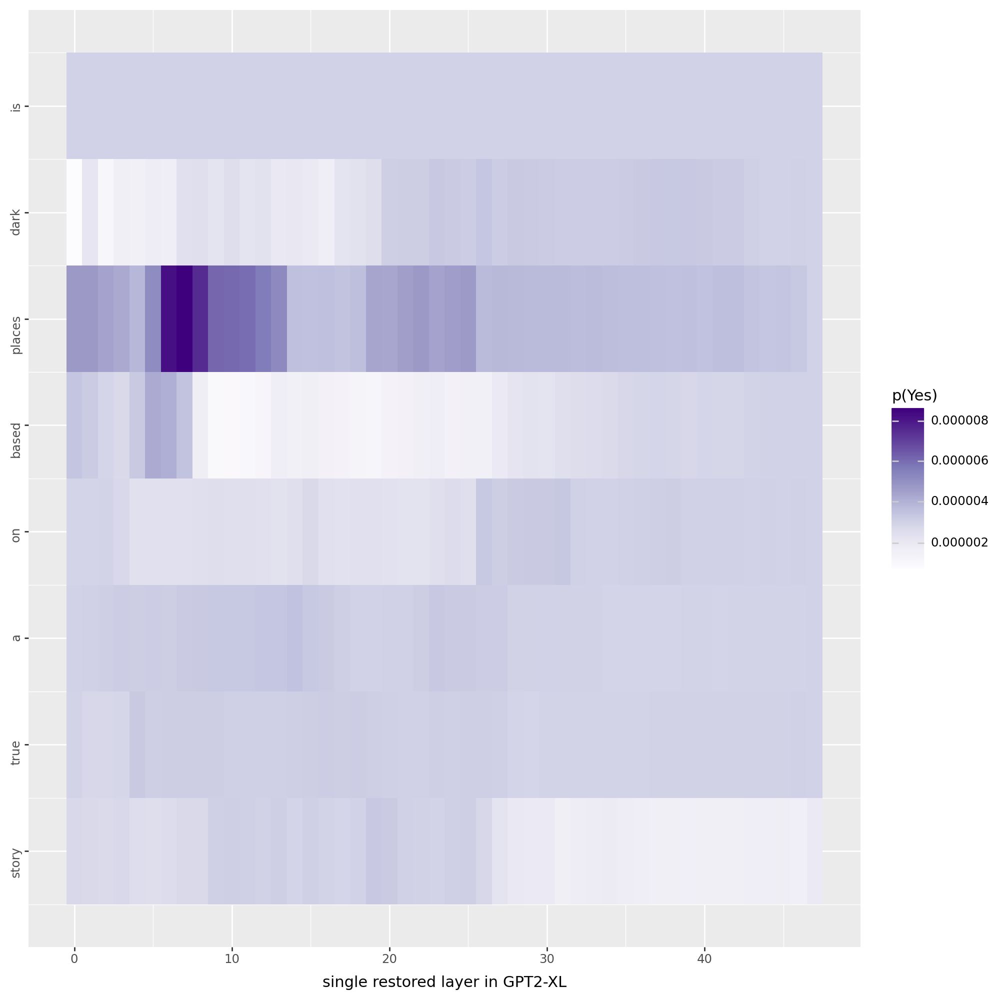

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_6_boolq_gpt2-xl_seed-1_yes_mlp_activation.pdf


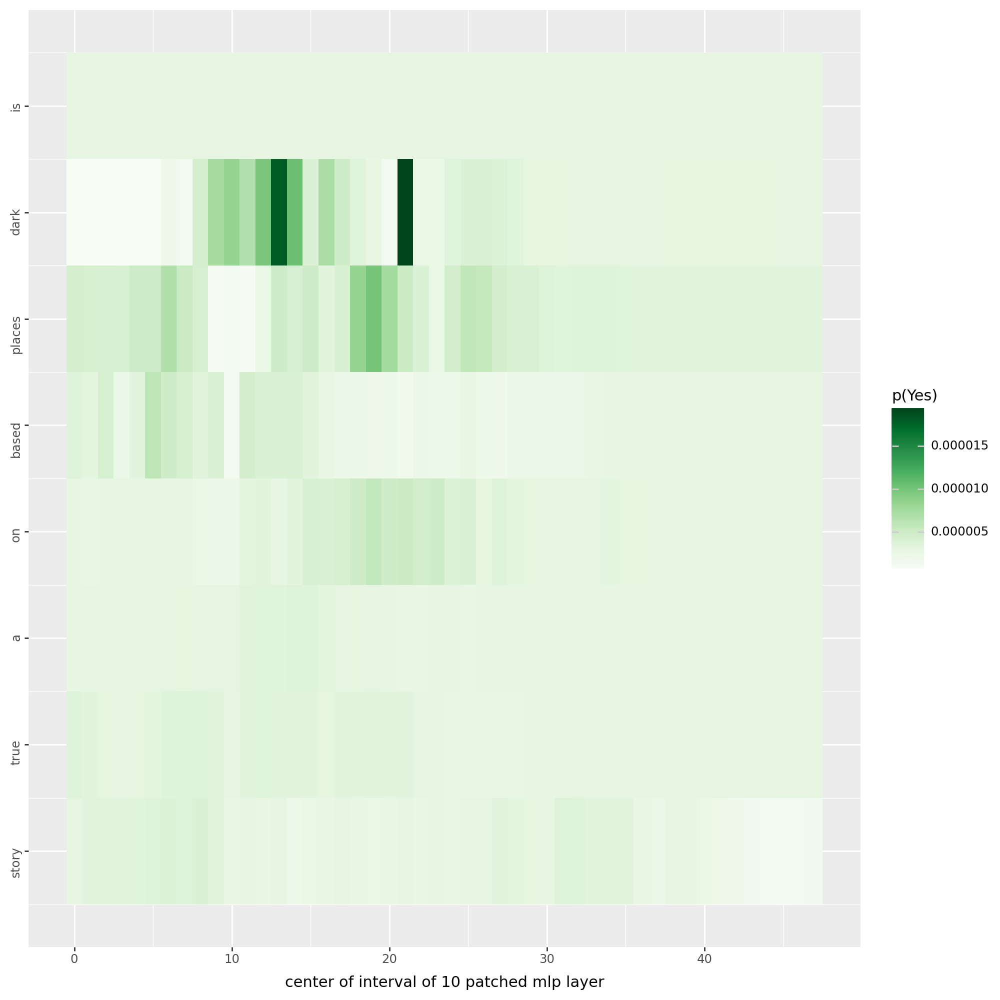

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_6_boolq_gpt2-xl_seed-1_yes_attention_output.pdf


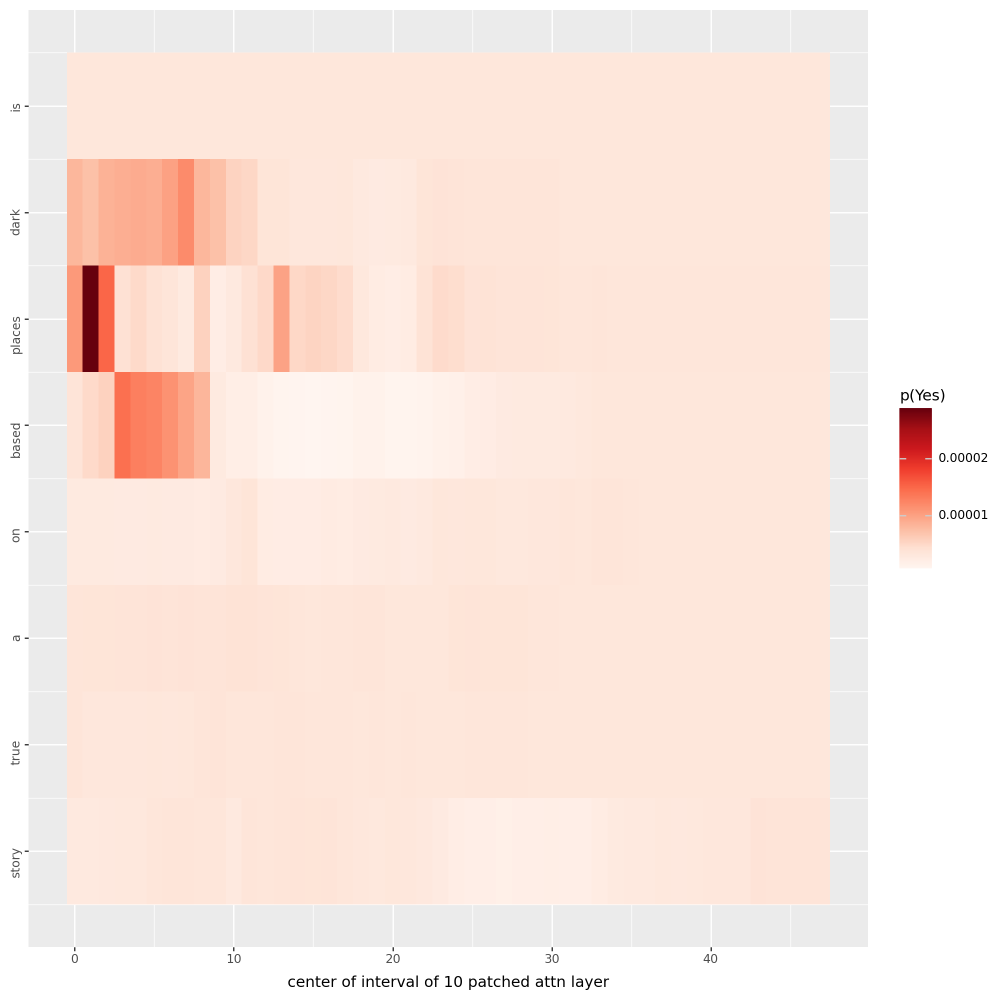

100%|██████████| 48/48 [02:29<00:00,  3.11s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_6_boolq_gpt2-xl_seed-1_no_block_output.pdf


[0, 1, 2, 3, 4, 5, 6, 7]


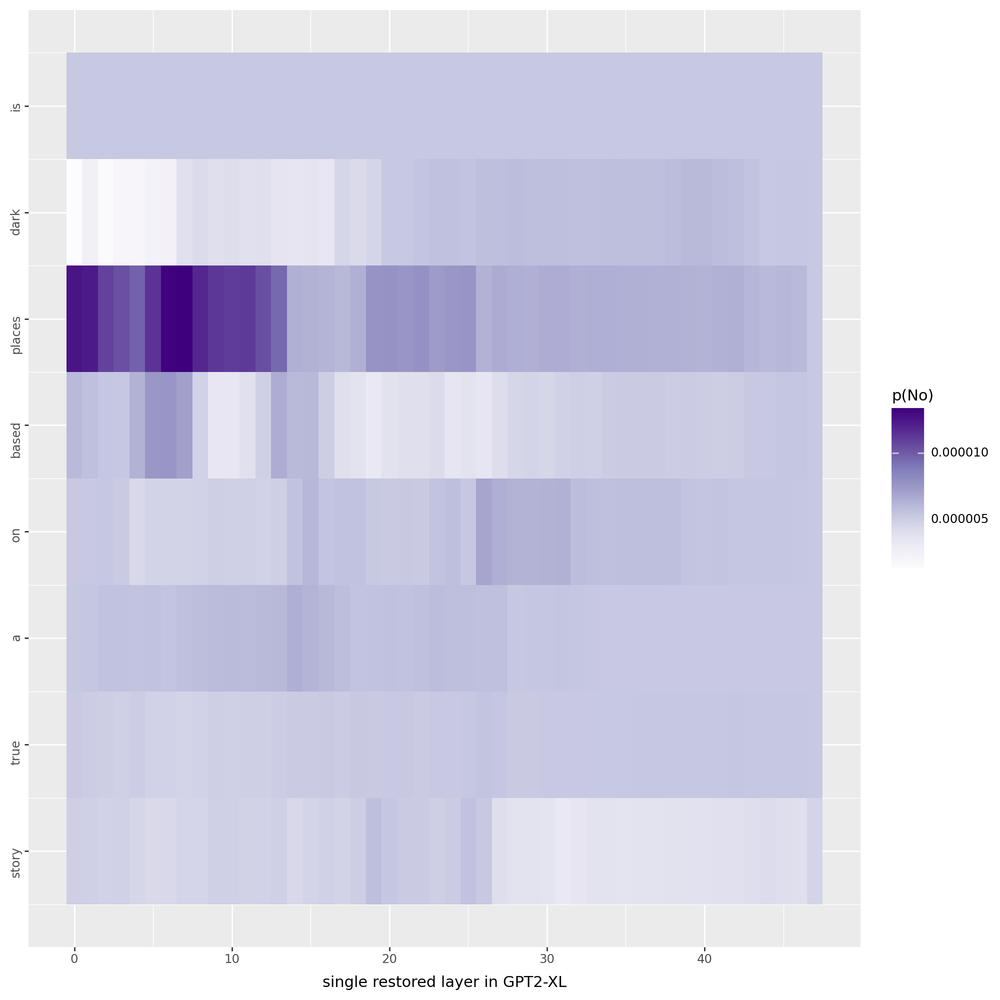

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_6_boolq_gpt2-xl_seed-1_no_mlp_activation.pdf


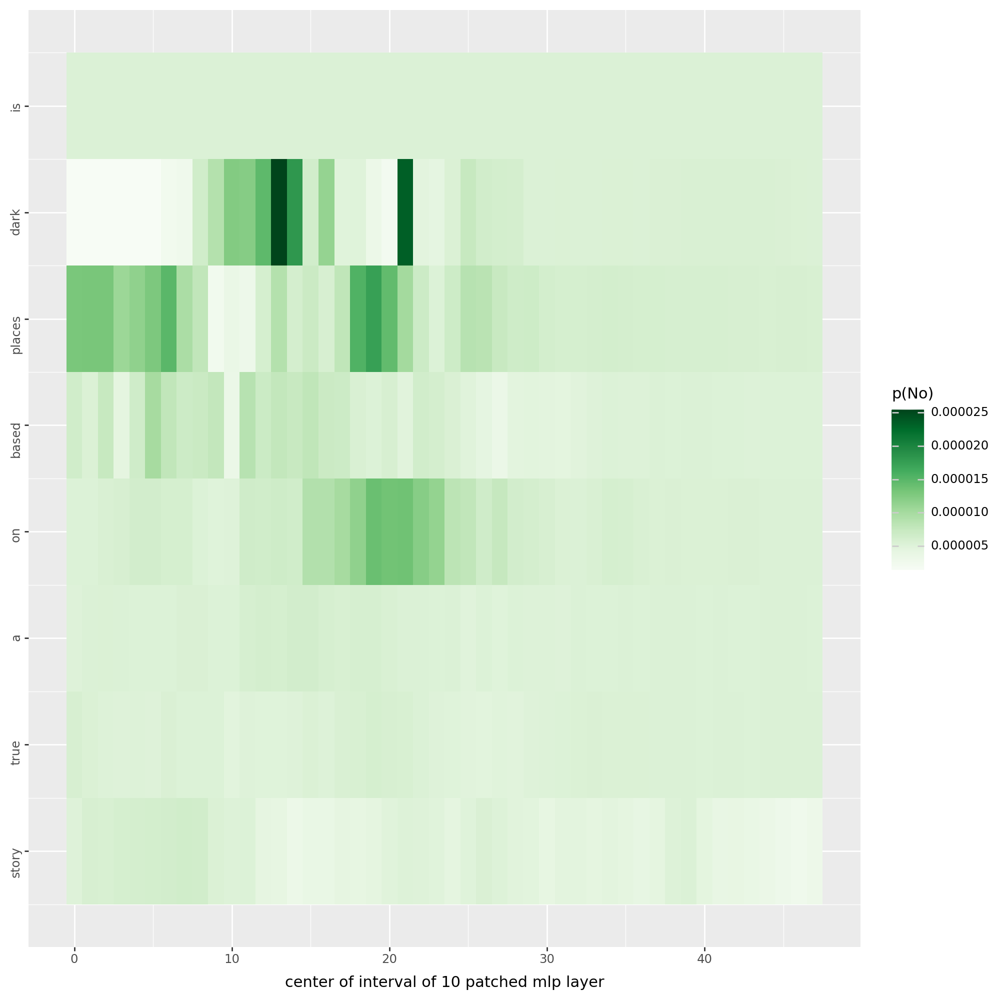

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_6_boolq_gpt2-xl_seed-1_no_attention_output.pdf


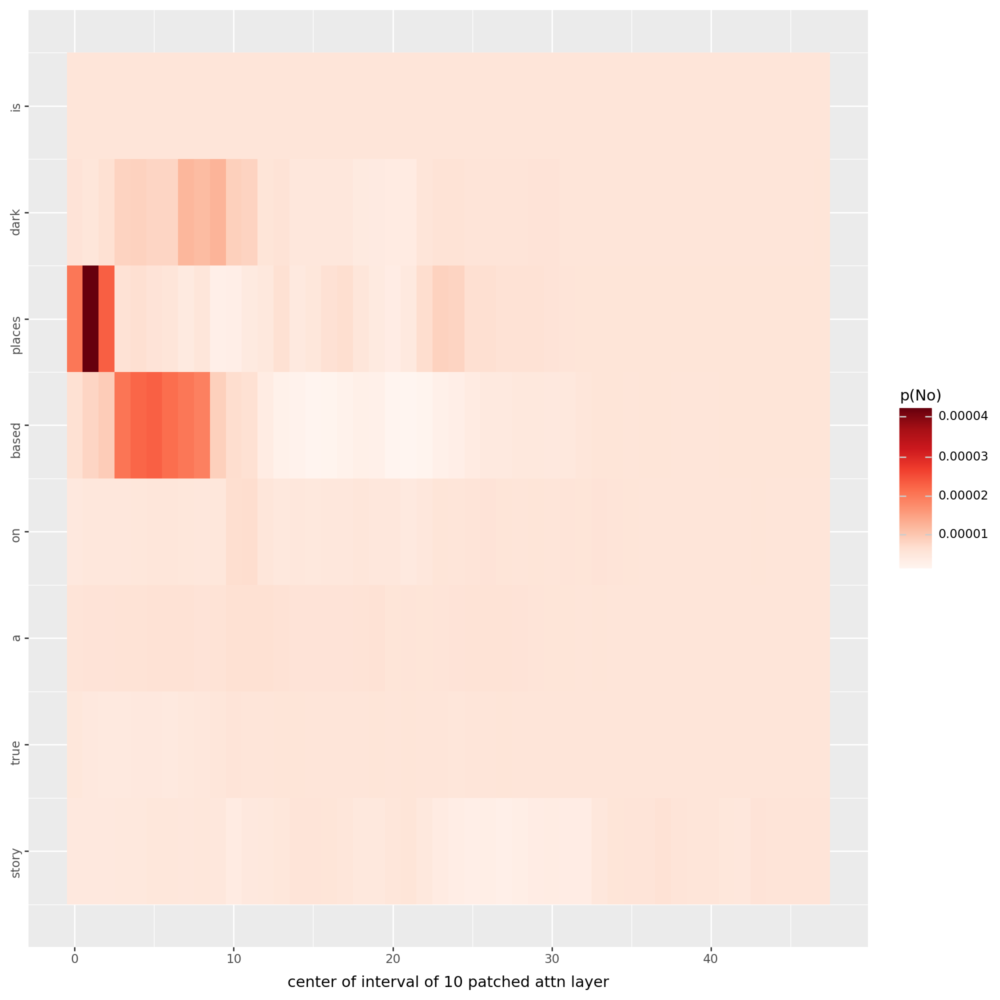

In [33]:
run(example_6['question'][0], unit_locations, models_dict, 6)

### Przykład 7

In [34]:
example_7 = ds['train'].select(range(253, 254))
print('QUESTION: {} \nANSWER: {}\nPASSAGE: {}\n'.format(example_7['question'], example_7['answer'], example_7['passage']))

QUESTION: ['does blow drying your hair kill lice eggs'] 
ANSWER: [True]
PASSAGE: ['A standard home blow dryer will kill 96.7% of eggs with proper technique. To be effective, the blow dryer must be used repeatedly (every 1 to 7 days since eggs hatch in 7 to 10 days) until the natural life cycle of the lice is over (about 4 weeks).']



In [35]:
tok = tokenizer(example_7['question'], return_tensors='pt').to(device)
tokens = tokenizer.convert_ids_to_tokens(tok['input_ids'][0])
tokens

['does', 'Ġblow', 'Ġdrying', 'Ġyour', 'Ġhair', 'Ġkill', 'Ġl', 'ice', 'Ġeggs']

In [36]:
unit_locations = [1, 2, 3, 4]

does blow drying your hair kill lice eggs
Przed zaszumieniem
?                    0.17111259698867798
_and                 0.10181590169668198
.                    0.0838654488325119
,                    0.057406291365623474
?"                   0.042075589299201965
_or                  0.03145629167556763
\n                   0.030552271753549576
_in                  0.02465563267469406
)                    0.022219525650143623
_on                  0.018689824268221855
Po zaszumieniu
_and                 0.04143853113055229
\n                   0.039310384541749954
.                    0.028483573347330093
,                    0.020982297137379646
"                    0.016176193952560425
)                    0.015554090030491352
_kill                0.014369236305356026
_l                   0.01401356142014265
_in                  0.013095246627926826
_eggs                0.01100760418921709
['does', 'blow', 'drying', 'your', 'hair', 'kill', 'lice', 'eggs']


100%|██████████| 48/48 [03:00<00:00,  3.76s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_7_gpt2-xl_yes_block_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 48 rows containing missing values.


[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 48 rows containing missing values.


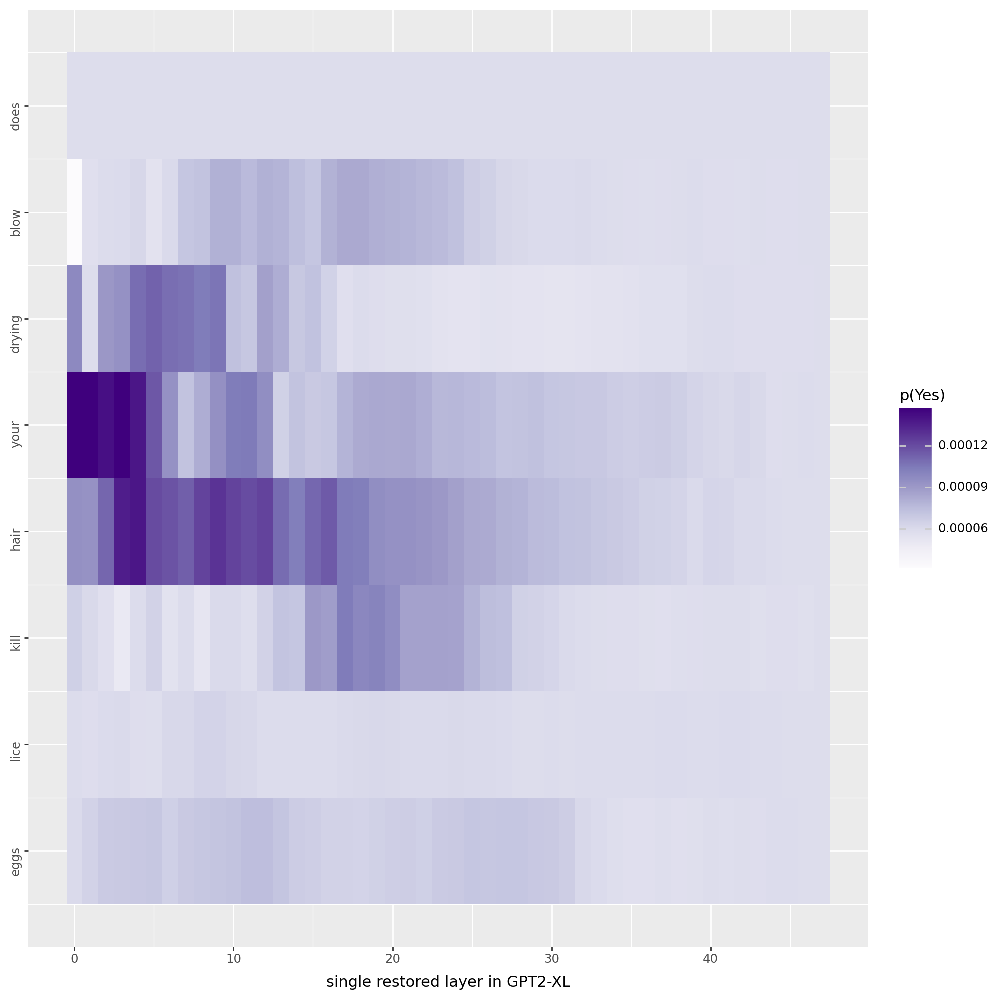

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_7_gpt2-xl_yes_mlp_activation.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 48 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 48 rows containing missing values.


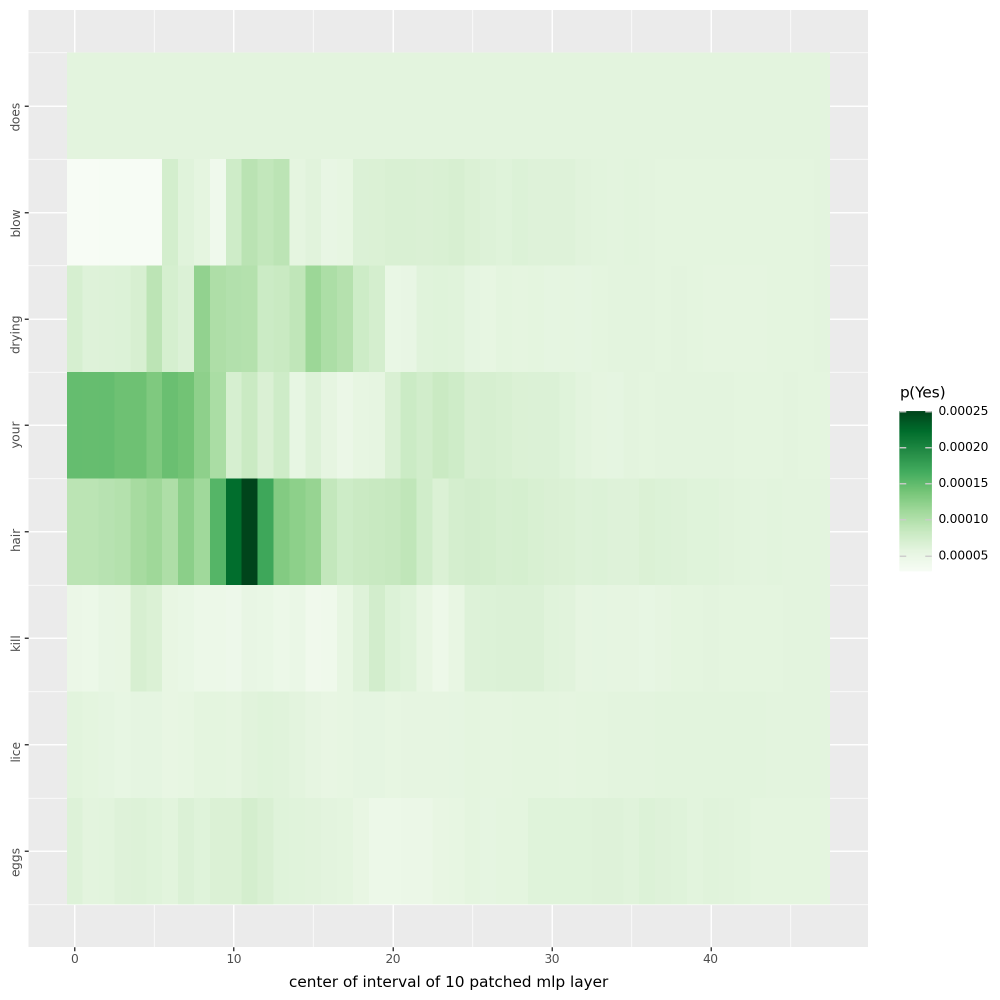

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_7_gpt2-xl_yes_attention_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 48 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 48 rows containing missing values.


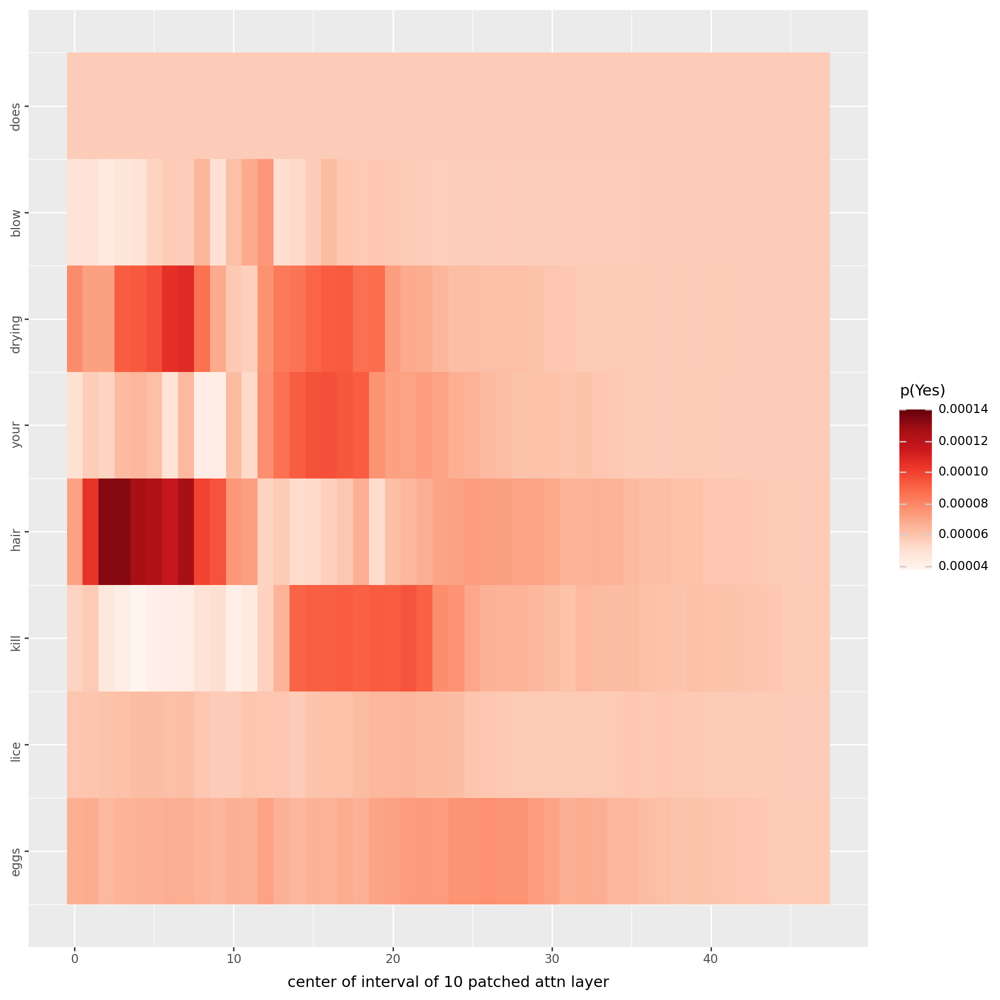

100%|██████████| 48/48 [03:00<00:00,  3.75s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_7_gpt2-xl_no_block_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 48 rows containing missing values.


[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 48 rows containing missing values.


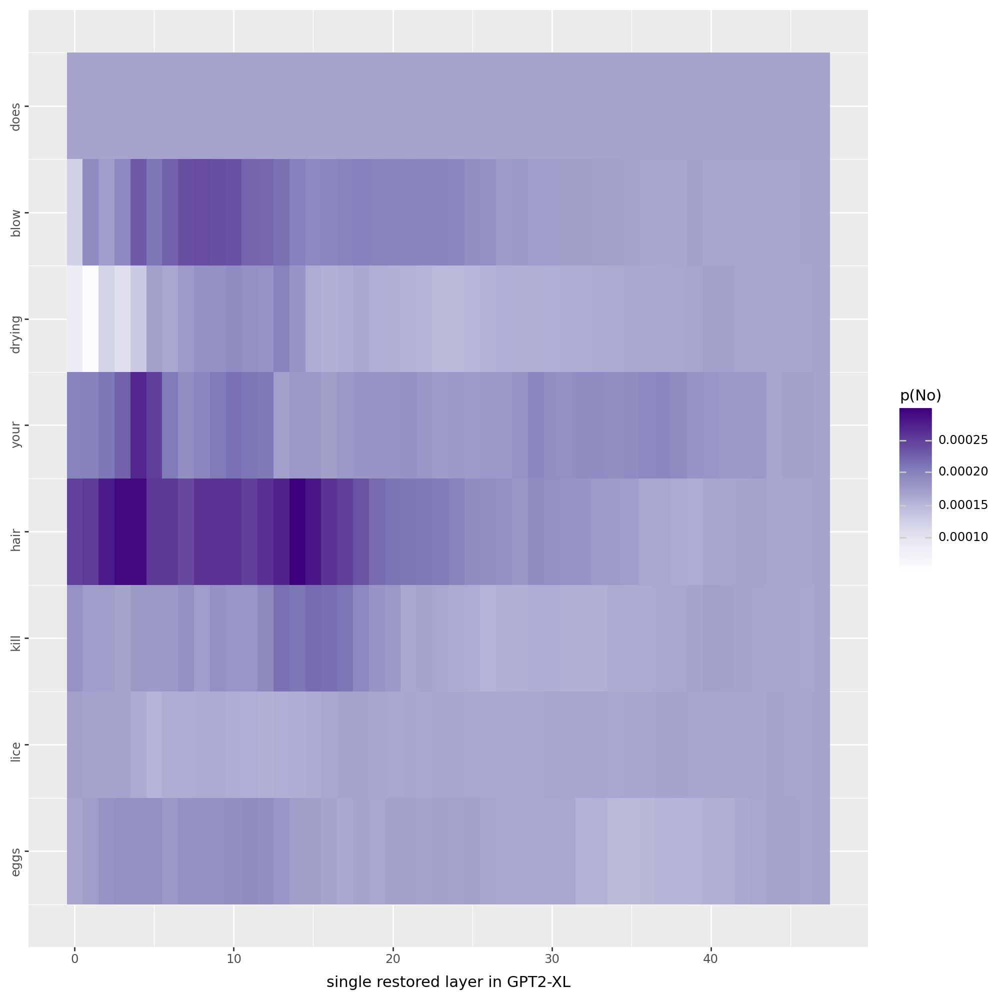

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_7_gpt2-xl_no_mlp_activation.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 48 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 48 rows containing missing values.


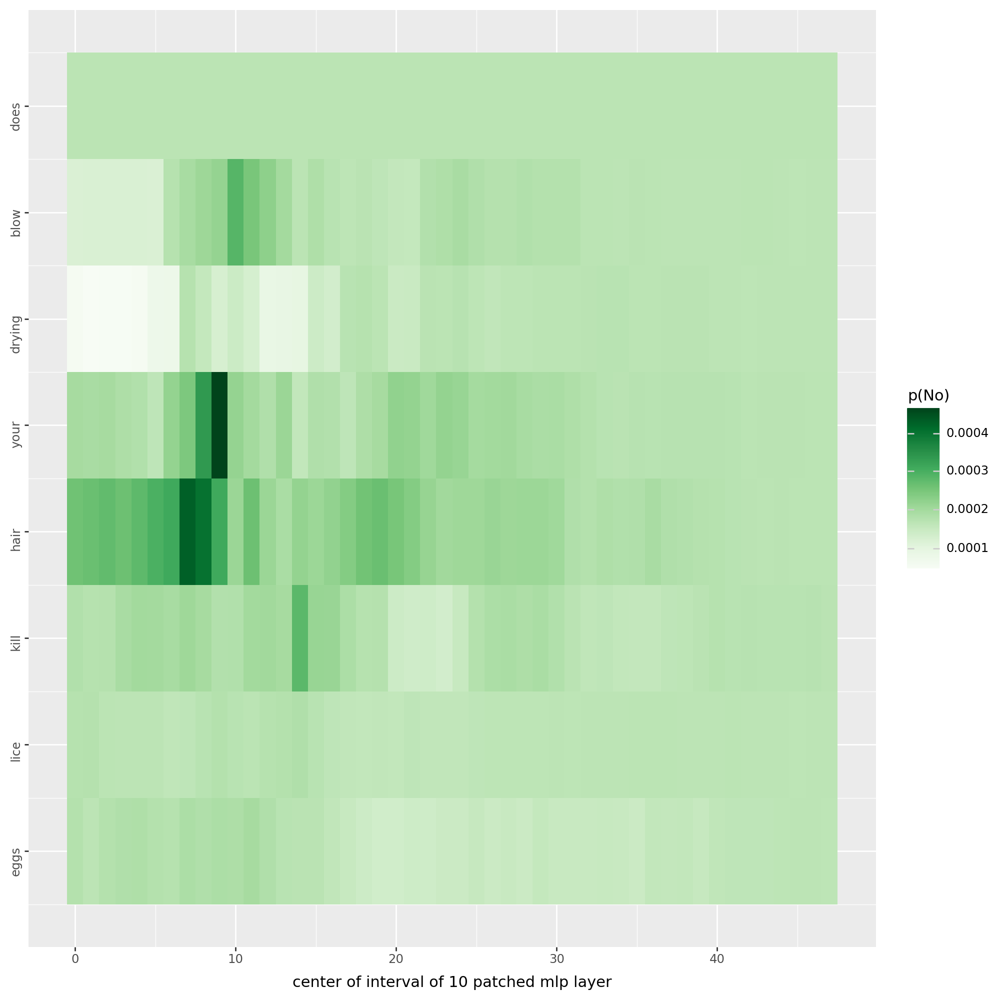

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_7_gpt2-xl_no_attention_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 48 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 48 rows containing missing values.


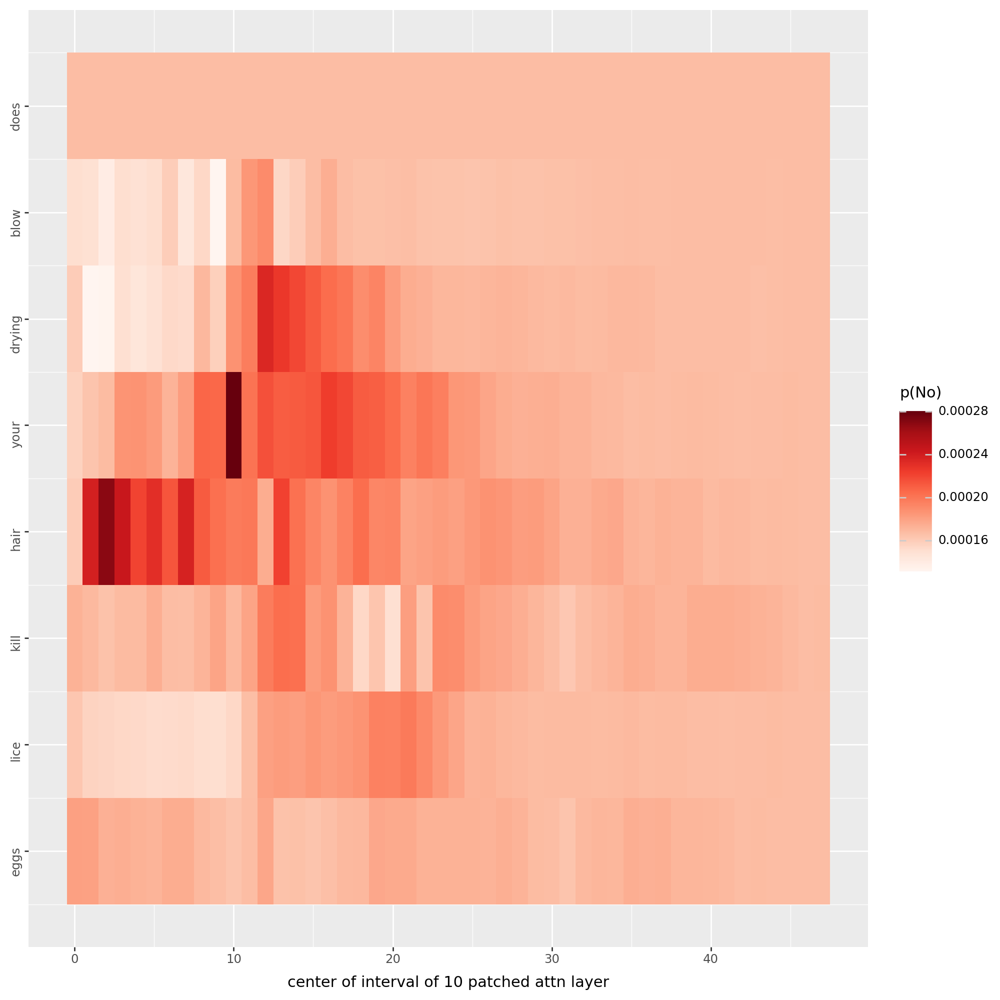

does blow drying your hair kill lice eggs
Przed zaszumieniem
?                    0.7214300036430359
_or                  0.04994981363415718
_in                  0.03702013939619064
_on                  0.03037397563457489
_and                 0.02422187849879265
,                    0.021851904690265656
?"                   0.01787911355495453
_inside              0.009006212465465069
_that                0.006453167647123337
_if                  0.005528618581593037
Po zaszumieniu
.                    0.38835299015045166
\n                   0.12285599857568741
_in                  0.09419606626033783
,                    0.044823866337537766
_and                 0.04268459975719452
!                    0.03973125293850899
_on                  0.030940311029553413
_(                   0.01150136161595583
_at                  0.009311494417488575
_of                  0.009295997209846973
['does', 'blow', 'drying', 'your', 'hair', 'kill', 'lice', 'eggs']


100%|██████████| 48/48 [03:03<00:00,  3.81s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_7_boolq_gpt2-xl_seed-1_yes_block_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 48 rows containing missing values.


[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 48 rows containing missing values.


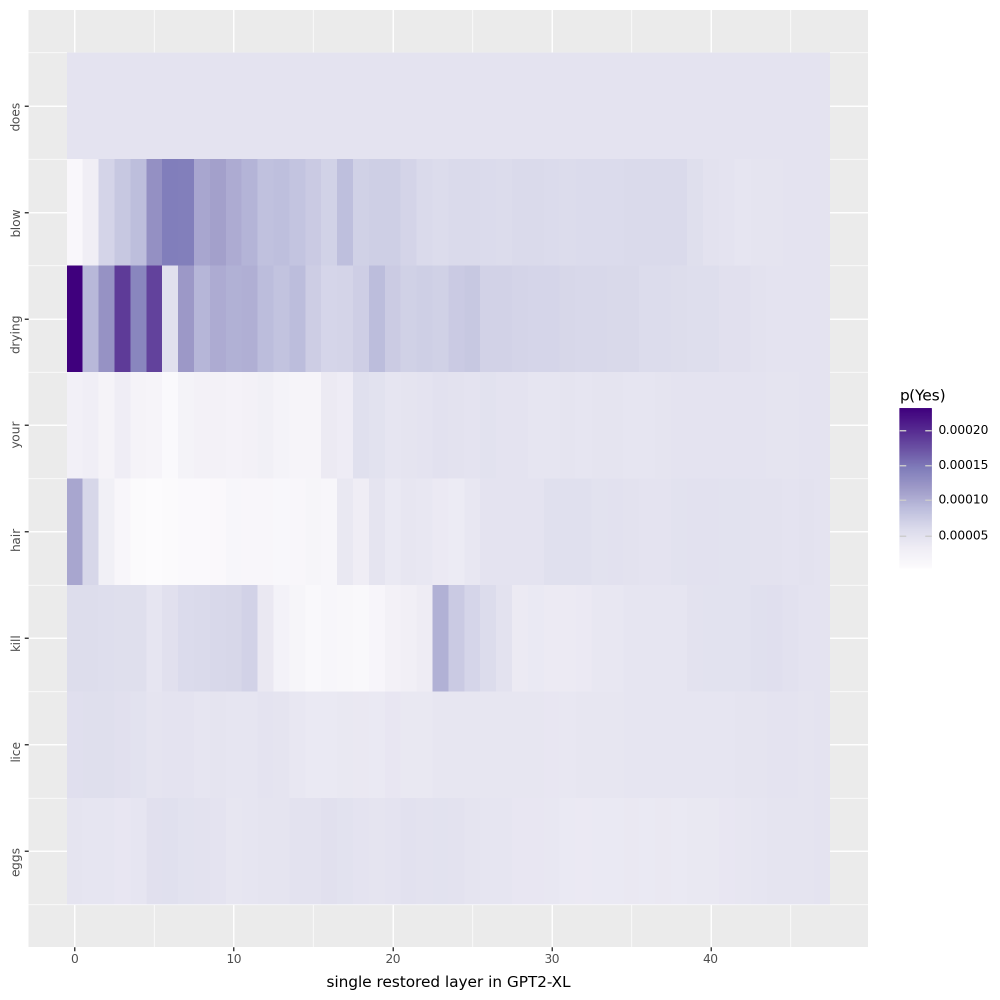

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_7_boolq_gpt2-xl_seed-1_yes_mlp_activation.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 48 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 48 rows containing missing values.


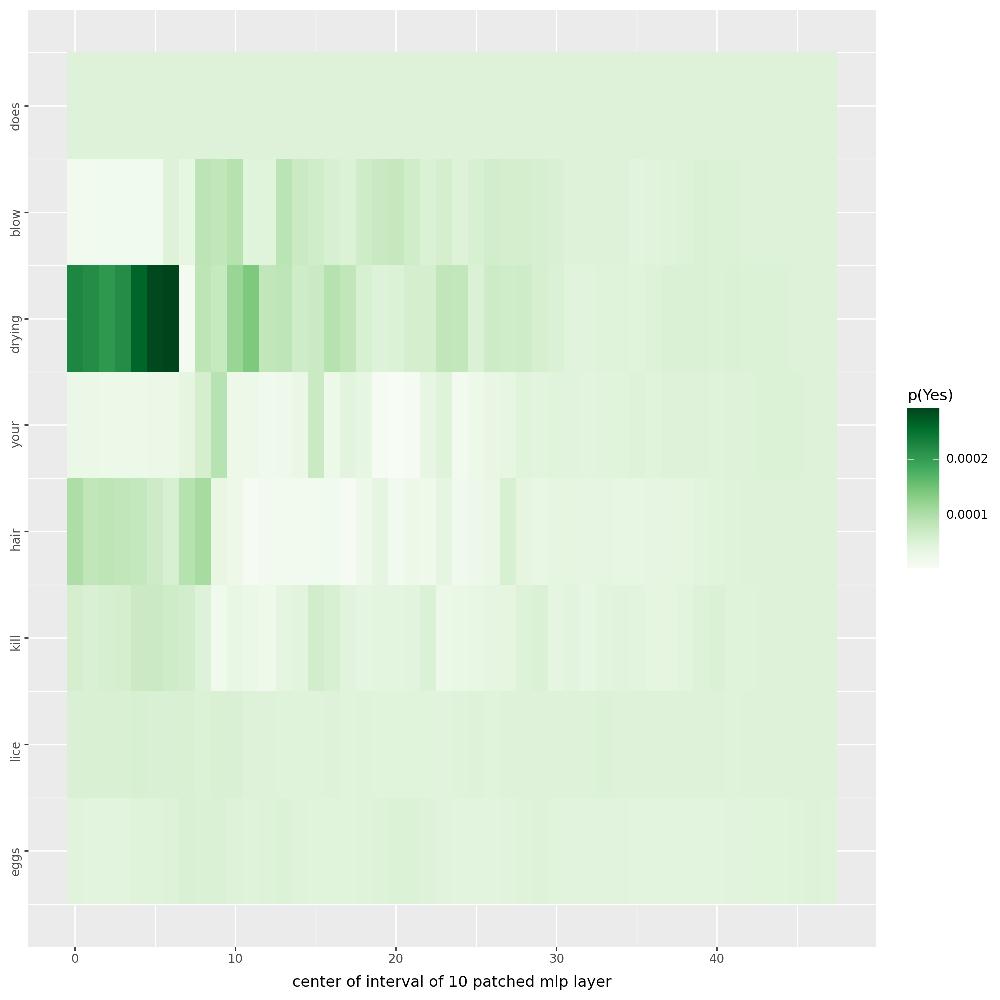

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_7_boolq_gpt2-xl_seed-1_yes_attention_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 48 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 48 rows containing missing values.


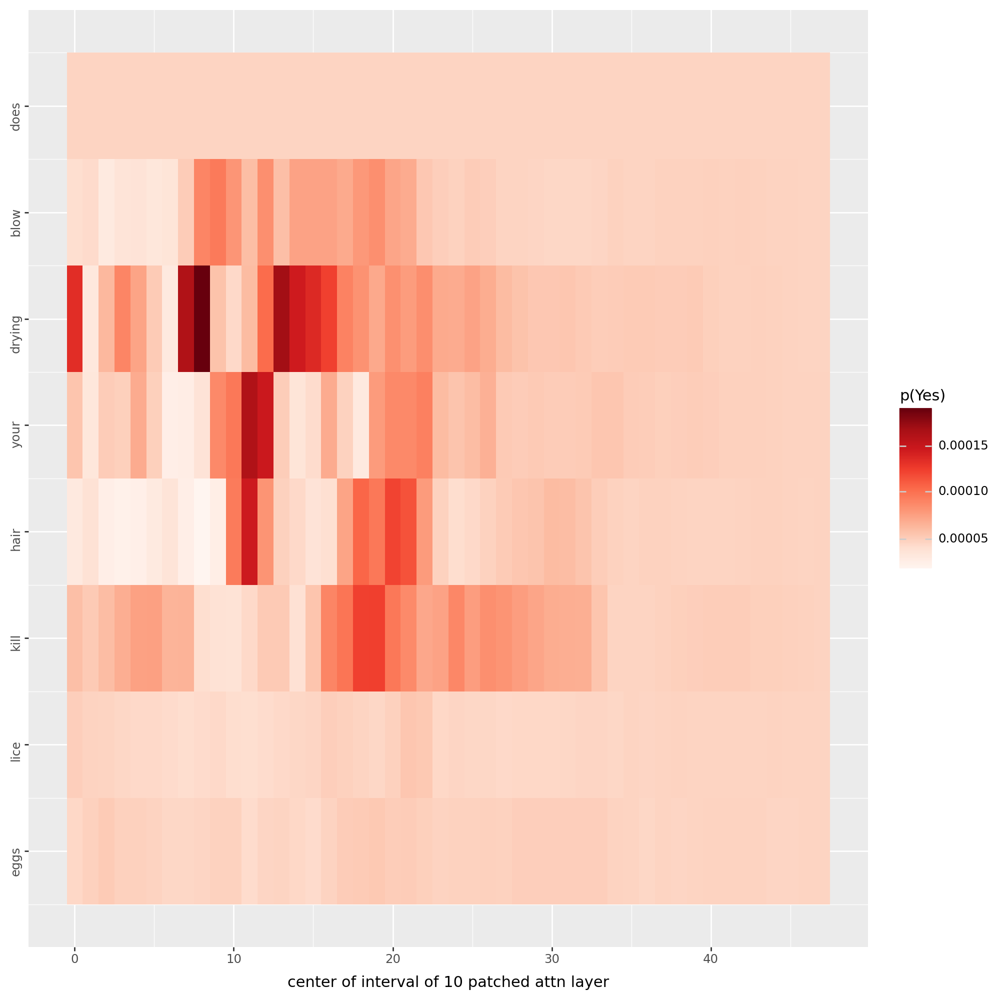

100%|██████████| 48/48 [03:24<00:00,  4.27s/it]
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_7_boolq_gpt2-xl_seed-1_no_block_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 48 rows containing missing values.


[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 48 rows containing missing values.


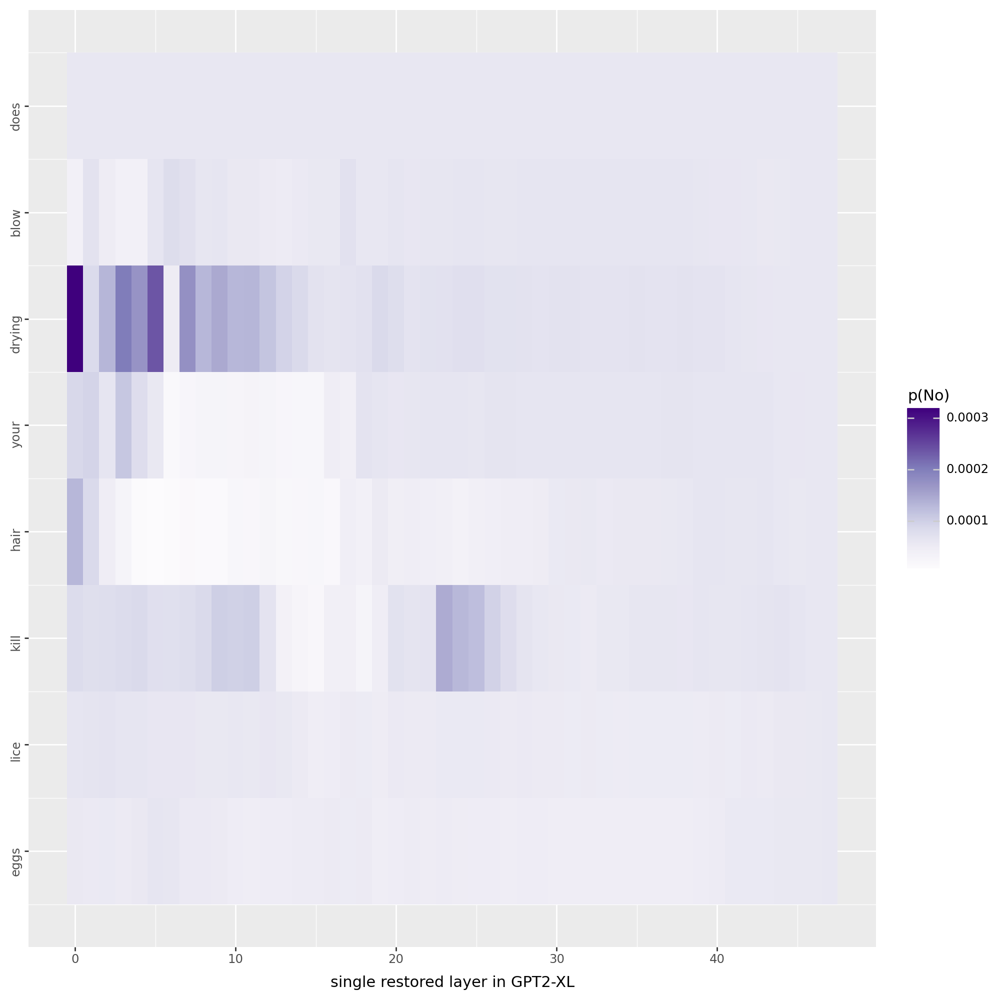

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_7_boolq_gpt2-xl_seed-1_no_mlp_activation.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 48 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 48 rows containing missing values.


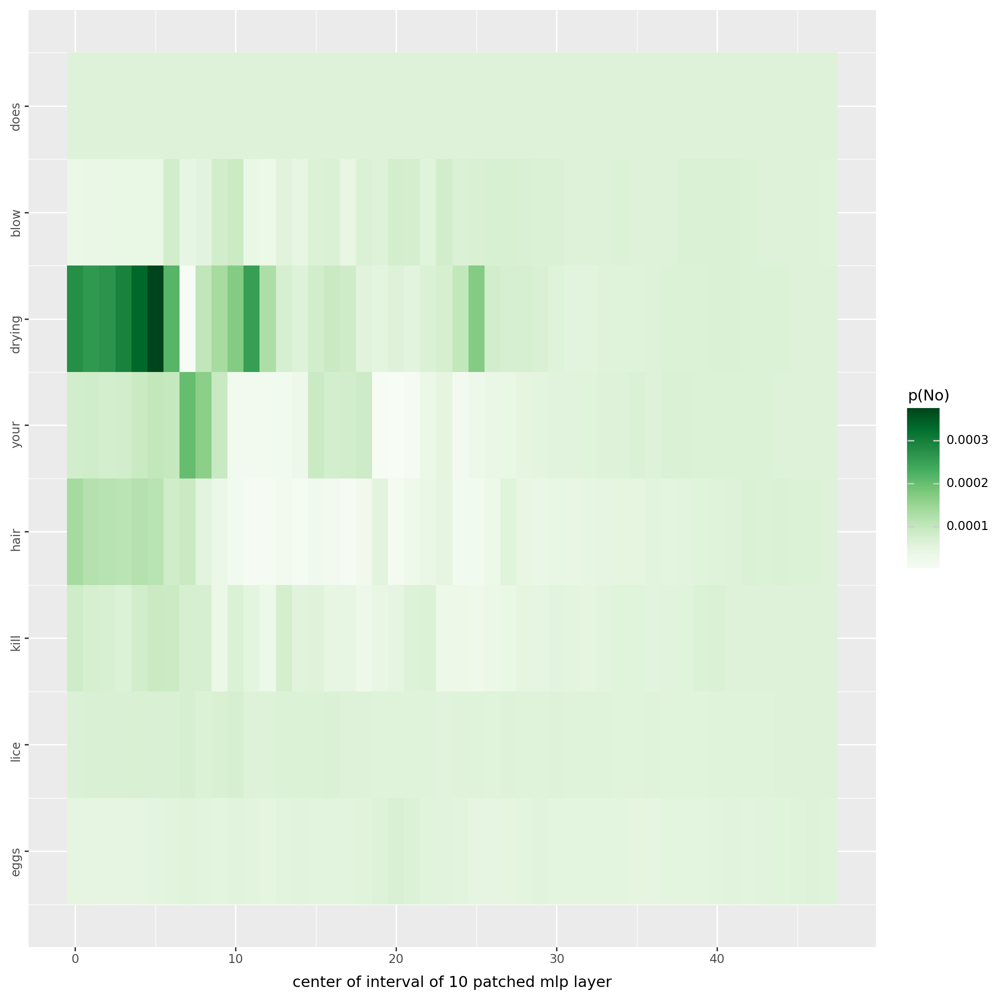

[0, 1, 2, 3, 4, 5, 6, 7]


/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 10 x 10 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: ./data/zadanie3/example_7_boolq_gpt2-xl_seed-1_no_attention_output.pdf
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 48 rows containing missing values.
/usr/local/lib/python3.11/dist-packages/plotnine/layer.py:364: PlotnineWarning: geom_tile : Removed 48 rows containing missing values.


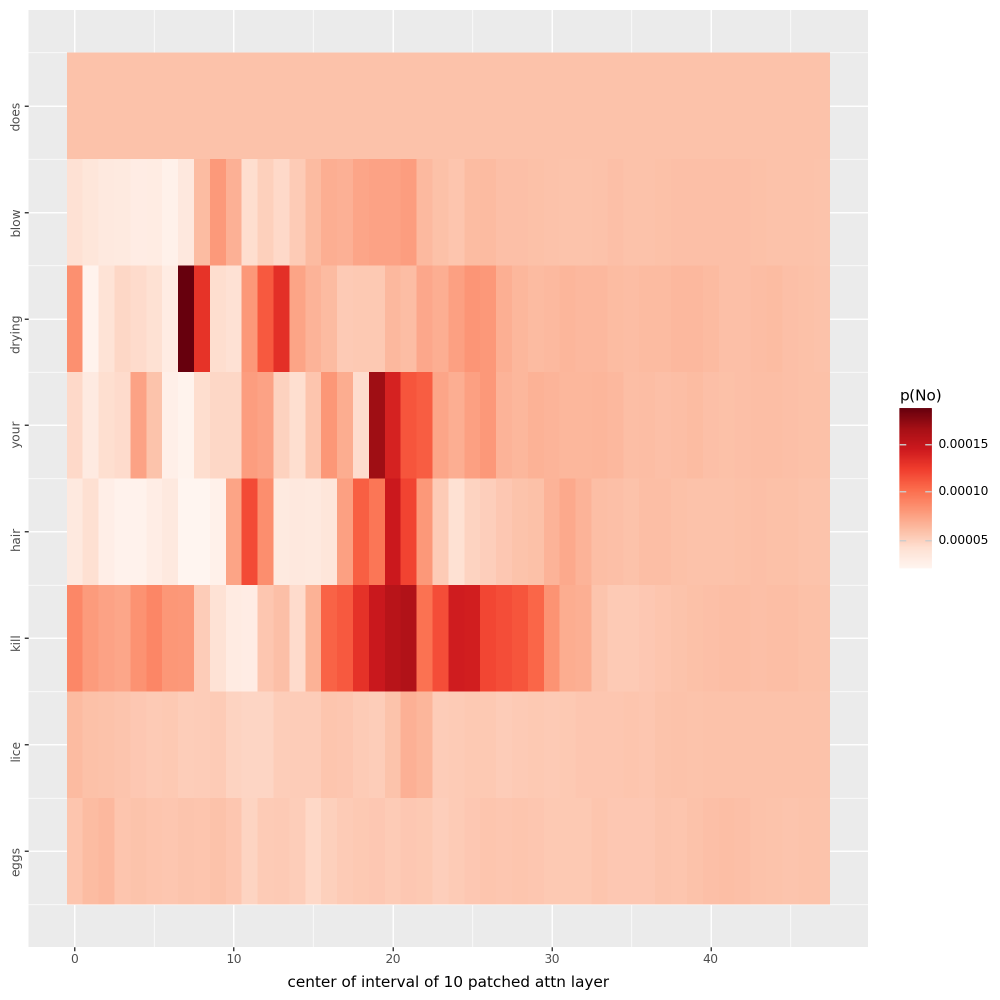

In [37]:
run(example_7['question'][0], unit_locations, models_dict, 7)

### Przykład 8

In [ ]:
example_8 = ds['train'].select(range(12, 13))
print('QUESTION: {} \nANSWER: {}\nPASSAGE: {}\n'.format(example_8['question'], example_8['answer'], example_8['passage']))

In [ ]:
tok = tokenizer(example_8['question'], return_tensors='pt').to(device)
tokens = tokenizer.convert_ids_to_tokens(tok['input_ids'][0])

In [ ]:
unit_locations = [1, 2, 3]

In [ ]:
run(example_8['question'][0], unit_locations, models_dict, 8)